In [1]:
import pickle
import os
from wordcloud import WordCloud
import pandas as pd
from konlpy.tag import Okt
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

import matplotlib.pyplot as plt
plt.rcParams['font.family'] ='Malgun Gothic'
plt.rcParams['axes.unicode_minus'] =False

from numpy import dot
from numpy.linalg import norm

def cos_sim(a, b):
    return dot(a, b) / (norm(a) * norm(b))

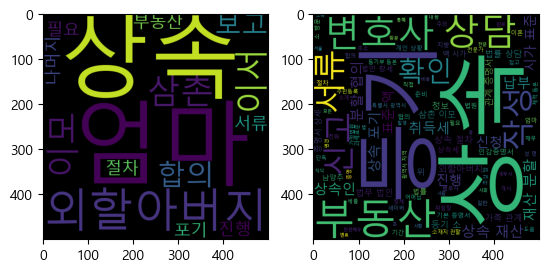

['외할아버지', '엄마', '삼촌', '이모', '이서', '합의', '보고', '엄마', '부동산', '상속', '나머지', '상속', '포기', '진행', '절차', '필요', '서류']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '김솔애', '변호사', '외할아버지', '어머님께', '부동산', '단독', '상속', '합의', '상속', '포기', '삼촌', '이모', '상속', '등기', '진행', '상속', '등기', '절차', '상속', '포기', '확인', '삼촌', '이모', '법원', '상속', '포기', '신고', '확인', '상속', '포기', '신고', '상속', '개시', '날로', '개월', '가정법원', '상속', '재산', '분할', '협의', '작성', '어머님', '삼촌', '이모', '부동산', '어머님', '단독', '상속', '내용', '협의', '작성', '필요', '서류', '준비', '상속', '시일', '증명', '서류', '외할아버지', '사망진단서', '가족', '관계', '증명서', '외할아버지', '어머님', '삼촌', '이모', '가족', '관계', '증명', '서류', '상속', '포기', '확인', '서류', '삼촌', '이모', '상속', '포기', '신고', '확인', '부동산', '등기부', '등본', '상속', '부동산', '등기부', '등본', '인감증명서', '모든', '상속인', '인감증명서', '위임장', '직접', '방문', '위임장', '작성', '대리인', '통해', '진행', '등기', '소', '방문', '신청', '준비', '서류', '관할', '등기', '소', '방문', '상속', '등기', '신청', '등기', '비용', '납부', '등기', '신청', '발생', '등기', '비용', '납부', '등기', '완료', '등기', '소', '심사', '등기', '완료', '등기', '권리', '증', '주의', '사항',

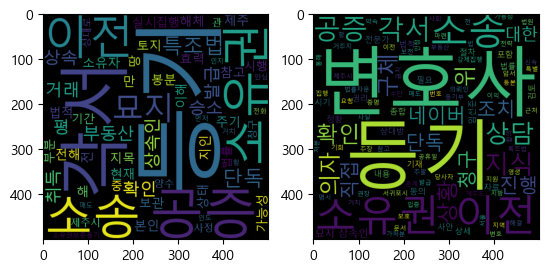

['제주', '땅', '평', '등기', '묘지', '지목', '평', '만', '봉분', '해체', '상태', '부동산', '특조법', '실시', '등기', '전해', '주기', '전', '토지', '소유자', '공증', '각서', '현재', '본인', '보관', '거래', '등기', '해', '소송', '소송', '승소', '가능성', '공증', '각서', '법적', '효력', '참고', '지인', '이해', '부분', '각서', '단독', '집행', '소송', '특조법', '시행', '기간', '중', '법률', '확인', '발급', '단독', '소유권', '이전', '등기', '확인', '발급', '특조법', '소유권', '이전', '등기', '제주시', '관', '사정', '소유권', '취득', '상속', '상속', '양수', '상대로', '소유권', '이전', '등기', '청구', '승소', '단독', '소유권보존등기', '함', '등기', '취득', '묘지', '상속인', '거치', '공증', '각서', '소송', '등기', '묘지', '상속인', '먼저', '등기', '이전', '인지', '부동산', '매도', '인도', '공증', '각서', '안심', '거래', '전화']
['네이버', '지식', '상담', '변호사', '임선준', '법적', '조치', '상세', '상담', '요청', '확인', '번호', '공증', '각서', '매도', '약속', '증명', '문서', '단독', '집행', '위', '법원', '소송', '통해', '강제집행', '공증', '각서', '소유권', '이전', '절차', '직접', '진행', '참고', '이전', '특조법', '소유권', '이전', '등기', '위', '확인', '발급', '단독', '등기', '명시', '묘지', '상속인', '당사자', '의자', '직접', '소유권', '이전', '진행', '기회', '묘지', '상속인', '관계', '동의', '공증', '각서', '의자', '권리', '인정',

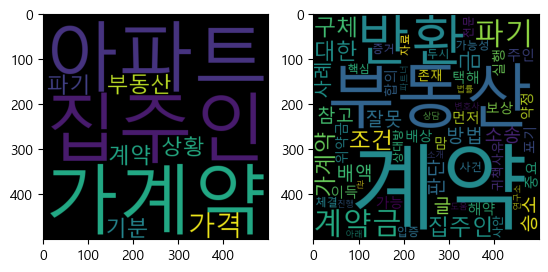

['아파트', '가계약', '집주인', '가격', '부동산', '상황', '계약', '파기', '기분']
['계약금', '배액', '배상', '해약', '주인', '먼저', '계약', '파기', '계약금', '포기', '계약', '실행', '방법', '집주인', '계약', '계약', '계약', '파기', '계약금', '배액', '계약', '파기', '방법', '택해', '집주인', '맘', '집주인', '계약', '파기', '보상', '이득', '부동산', '가계약', '금', '반환', '가능', '계약', '중요', '조건', '대한', '합의', '위약금', '약정', '존재', '귀책사유', '계약', '파기', '구체', '계약', '조건', '계약', '조건', '반환', '가능성', '대한', '구체', '판단', '부동산', '가계약', '금', '반환', '사건', '핵심', '계약', '체결', '상대방', '잘못', '계약', '파기', '잘못', '입증', '대한', '증거', '두시', '부동산', '가계약', '금', '반환', '구체', '사안', '판단', '자료', '전문', '변호사', '상담', '진행', '참고', '글', '소개', '부동산', '계약금', '반환', '관', '아래', '글', '참고', '도움', '부동산', '계약금', '반환', '소송', '승소', '사례', '부동산', '계약금', '반환', '소송', '승소', '사례', '파트너', '부동산', '법률', '연구소']


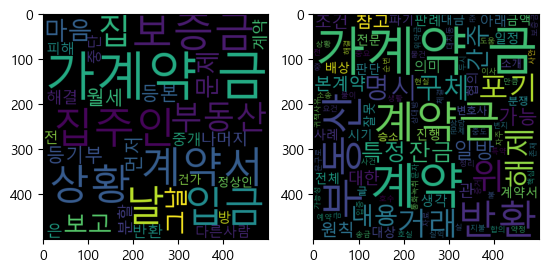

['집', '보고', '마음', '가계약', '금', '집주인', '입금', '그날', '부동산', '문제', '등기부', '등본', '상황', '집주인', '부동산', '상황', '계약서', '보증금', '월세', '먼저', '가계약', '금', '집주인', '입금', '나머지', '은', '계약서', '날', '입금', '날', '보증금', '해결', '보증금', '분할', '계약', '가계약', '금', '반환', '가계약', '금', '집', '중개', '중단', '계약서', '날', '전', '다른사람', '방', '피해', '가계약', '금', '상황', '정상인', '건가']
['가계약', '금', '의미', '상황', '생각', '문제', '판례', '아래', '정리', '계약서', '가계약', '금', '송금', '통화녹취', '문자', '내용', '가계약', '금', '계약', '간주', '거래', '대상', '물건', '특정', '거래', '대금', '금액', '잔금', '일정', '불', '계약', '간주', '계약', '위', '순번', '예약', '의미', '일방', '해제', '위', '가계약', '금', '포기', '가능', '가계약', '금', '계약', '간주', '거래', '대상', '물이', '특정', '번지', '호수', '호실', '거래', '대금', '명시', '계약금', '잔금', '금액', '일정', '명시', '중도', '금', '잔금', '시기', '본계약', '원칙', '일방', '해제', '위', '가계약', '금', '계약금', '전체', '배상', '위', '구체', '명시', '본계약', '준', '요건', '가계약', '금', '포기', '해제', '특약', '문구로', '명시', '일방', '해제', '본계약', '전', '가계약', '금', '포기', '가능', '판례', '참고', '위', '내용', '특정', '사례', '내용', '현실', '소송', '진행', '실익', '만큼', '원칙', 

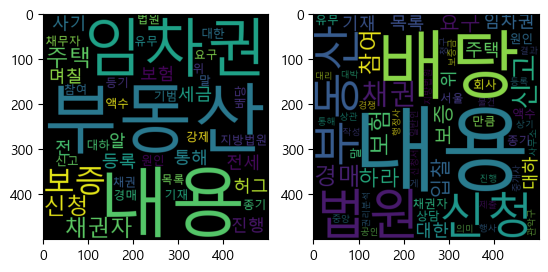

['전세', '사기', '알', '임차권', '등록', '진행', '허그', '보증', '보험', '통해', '세금', '며칠', '전', '지방법원', '등기', '부동산', '강제', '채권자', '주택', '보증', '채무자', '기범', '목록', '기재', '부동산', '대한', '주택', '임차권', '위', '부동산', '대하', '채권자', '신청', '채권', '유무', '원인', '액수', '배당', '요구', '종기', '법원', '신고', '내용', '경매', '참여', '신청', '말', '내용', '내용']
['목록', '기재', '부동산', '대한', '주택', '임차권', '위', '부동산', '대하', '채권자', '신청', '채권', '유무', '원인', '액수', '배당', '요구', '종기', '법원', '신고', '하라', '내용', '경매', '참여', '신청', '말', '내용', '내용', '상기', '내용', '법원', '배당', '신고', '하라', '의미', '보증', '보험', '회사', '보험', '청구', '만큼', '채권', '행사', '보증', '보험', '회사', '진행', '만큼', '배당', '신고', '법원', '경매', '물건', '권리분석', '입찰', '대리', '상담', '서울', '관악구', '대박', '행정사', '공인', '중개사', '사무소', '서울', '중앙', '지방법원', '등록', '상담', '목록', '기재', '부동산', '대한', '주택', '임차권', '위', '부동산', '대하', '채권자', '신청', '채권', '유무', '원인', '액수', '배당', '요구', '종기', '법원', '신고', '하라', '내용', '경매', '참여', '신청', '말', '내용', '내용', '경매', '참여', '게', '채권', '법원', '배당', '요구', '신청서', '작성', '제출', '보증', '보험', '통해', '보증금', '상관', '내용', '입찰', '

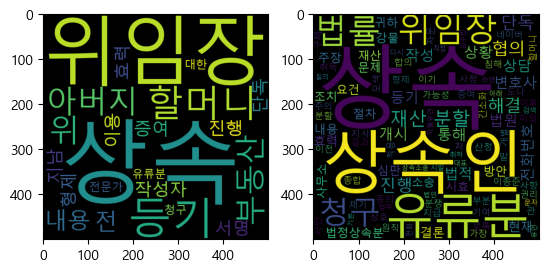

['아버지', '아버지', '전', '할머니', '위임장', '내용', '부동산', '작성자', '증여', '할머니', '위', '위임장', '서명', '할머니', '상속', '등기', '지남', '상속', '등기', '위', '위임장', '효력', '위임장', '이용', '단독', '상속', '등기', '진행', '상속', '등기', '형제', '유류분', '청구', '부동산', '상속', '대한', '전문가']
['로톡', '네이버', '지식', '상담', '변호사', '이종준', '결론', '작성', '위임장', '현재', '상황', '단독', '상속', '등기', '진행', '상속', '등기', '상속', '개시', '진행', '할머니', '상속', '개시', '상속', '등기', '이후', '진행', '작성', '위임장', '상속', '개시', '이전', '작성', '상속', '내용', '증여', '관', '내용', '이기', '현재', '상황', '효력', '상속', '법정상속분', '원칙', '위임장', '상속인', '동의', '단독', '상속', '재산', '처', '분할', '형제', '유류분', '청구', '유류분', '상속인', '법정상속분', '미달', '상속', '부분', '상속인', '청구', '권리', '말', '유류분', '청구', '가능성', '위임장', '귀하', '단독', '상속', '재산', '취득', '상속인', '유류분', '침해', '주장', '유류분', '청구', '소송', '제기', '소송', '결과', '법원', '상속인', '기여', '도나', '사정', '종합', '유류분', '산정', '상속인', '유류분', '지급', '해결', '방안', '상속', '재산', '분할', '협의', '상속인', '협의', '상속', '재산', '분할', '가장', '상호', '합의', '통해', '분쟁', '해결', '법적', '절차', '간소화', '상속', '재산', '분할', '심판', '협의', '법원', '상속', 

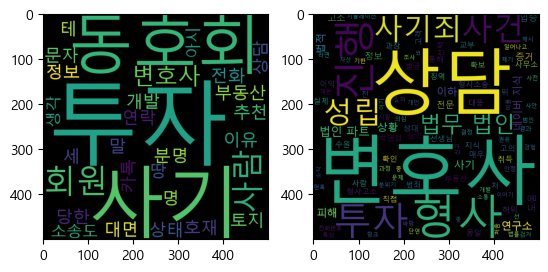

['동호회', '회원', '추천', '부동산', '투자', '사기', '당한', '분명', '테', '정보', '사람', '세', '명', '말', '토지', '개발', '호재', '땅', '사람', '이유', '대면', '투자', '투자', '회원', '연락', '동호회', '문자', '카톡', '전화', '상태', '변호사', '사기', '상담', '사기', '소송도', '생각', '변호사', '아시']
['네이버', '지식', '상담', '변호사', '동일', '고객', '사건', '처음', '고객', '직접', '소통', '실제', '조사', '재판', '과정', '분위기', '사전', '시뮬레이션', '진행', '링크', '법률', '상담', '전화번호', '확인', '사람', '안정', '자산', '중', '선택', '단연', '코', '부동산', '이야기', '특성', '상대', '제시', '정보', '투자', '결정', '부동산', '투자', '사기', '일어나고', '실제', '개발', '소식', '기반', '투자', '권유', '개인', '선택', '결과', '상대', '과장', '허위', '정보', '이용', '현혹', '투자', '이기', '사기죄', '성립', '형사', '고소', '진행', '범죄', '의심', '상황', '라면', '시일', '투자', '사기', '신고', '진행', '범인', '검거', '도움', '선', '사안', '변호사', '증거', '확보', '제기', '종', '법적', '문제', '깊이', '지식', '경험', '바탕', '대응', '사례', '지니', '사건', '대처', '동일', '변호사', '네이버', '지식', '지식', '전문가', '네이버', '지식', '상담', '변호사', '김정', '신의성실', '허위', '과장', '과고', '이득', '사기죄', '부당이득', '금', '반환', '소송', '진행', '사기죄', '불법영득의사', '고의', '인정', '성립', '입증', '증거', 

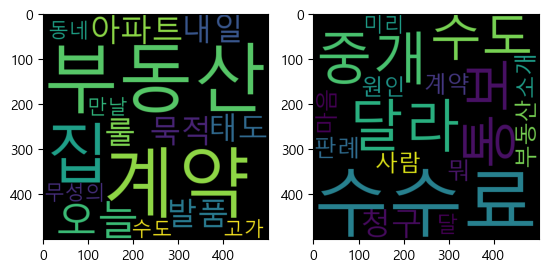

['묵적', '룰', '집', '부동산', '계약', '오늘', '아파트', '부동산', '내일', '집', '부동산', '계약', '오늘', '발품', '부동산', '태도', '무성의', '계약', '동네', '고가', '만날', '수도', '집', '계약']
['사람', '부동산', '계약', '통보', '중개', '수수료', '달라', '수도', '뭐', '마음', '통보', '중개', '수수료', '청구', '판례', '소개', '원인', '청구', '수도', '수수료', '달', '수수료', '달라', '미리']


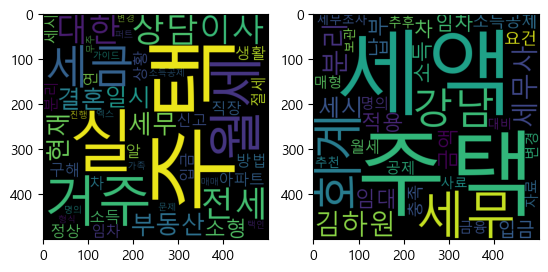

['부동산', '세금', '세무', '상담', '현재', '결혼', '일시', '주택', '실', '거주', '소형', '아파트', '전세', '실', '거주', '정상', '이사', '실', '거주', '주택', '월세', '연', '월세', '구해', '이사', '주택', '월세', '대한', '소득', '신고', '알', '상황', '절세', '방법', '대한', '직장', '생활', '분리', '세시', '세금', '주택', '주택', '임차', '차', '입금', '소득공제', '무주', '택인', '가족', '전세', '주택', '매매', '형식', '명의', '변경', '문제', '가이드', '엑스', '퍼트', '상담', '진행']
['세무', '회계', '강남', '김하원', '세무사', '분리', '세시', '주택', '임대', '소득', '금액', '적용', '세액', '납부', '주택', '임차', '차', '입금', '소득공제', '요건', '충족', '월세', '세액', '공제', '매형', '명의', '변경', '금융', '자료', '사료', '추후', '세무조사', '대비', '보관', '추천']


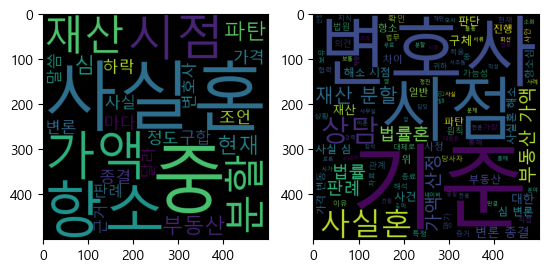

['사실혼', '재산', '분할', '항소', '중', '재산', '분할', '부동산', '가액', '시점', '심', '사실혼', '파탄', '시점', '항소', '중', '현재', '부동산', '가격', '정도', '하락', '사실혼', '파탄', '시점', '가액', '중', '현재', '가액', '사실', '심', '변론', '종결', '사실혼', '항소', '중', '조언', '구합', '변호사', '마다', '말씀', '달라', '판례', '근거']
['지식', '법률', '상담', '진행', '정진', '변호사', '상담', '전용', '회선', '사실혼', '법률혼', '변론', '종결', '시가', '원칙', '파탄', '시로', '판단', '문제', '서초동', '교대역', '앞', '법무', '법인', '올해', '이혼', '전문', '변호사', '상담', '서류', '작성', '재판', '참석', '직접', '담당', '변호사', '선임', '변호사', '경력', '업무', '분야', '확인', '상담', '오시', '사무실', '무료', '주차', '사실혼', '재산', '분할', '부동산', '가액', '기준', '시점', '법률', '법률혼', '사실혼', '차이', '법률혼', '대체로', '재산', '분할', '시점', '사실', '심', '변론', '종결', '기준', '대법원', '판례', '통용', '사실혼', '재산', '분할', '법률혼', '기준', '적용', '기준', '적용', '법원', '판단', '심', '사실혼', '파탄', '시점', '기준', '시점', '재산', '가액', '평가', '기준', '가능성', '항소심', '기준', '항소', '중일', '보통', '사실', '심', '변론', '종결', '기준', '재산', '평가', '가능성', '변호사', '의견', '이유', '법원', '재량', '구체', '사건', '상황', '판례', '법원', '판결', '항소심', '대체로', '법률혼', '사실

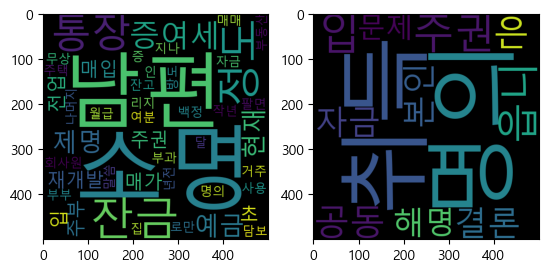

['재개발', '입', '주권', '매입', '잔금', '초', '매가', '전업', '주부', '남편', '회사원', '자금', '소명', '부부', '무상', '증', '여분', '년전', '사용', '백정', '작년', '제명', '부동산', '매매', '예금', '정도', '소명', '남편', '통장', '잔고', '소명', '나머지', '소명', '남편', '월급', '명의', '통장', '예금', '제명', '통장', '인', '잔금', '증여세', '부과', '현재', '거주', '주택', '팔면', '리지', '현재', '집', '담보', '소명', '잔금', '지나', '달', '증여세', '정도', '남편', '정도', '로만', '증여세', '방도', '말씀']
['입', '주권', '명의', '취득', '읍니', '공동', '명의', '취득', '은', '결론', '본인', '자금', '해명', '문제']


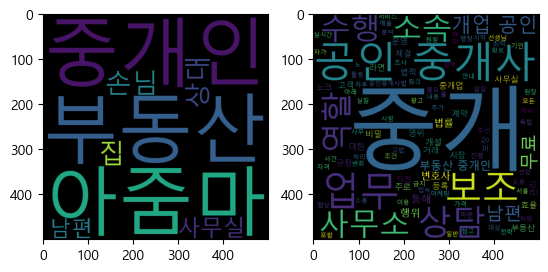

['부동산', '중개인', '아줌마', '손님', '상대', '집', '사무실', '남편']
['부동산', '중개인', '역할', '법적', '규정', '중개', '사무소', '개설', '등록', '개업', '공인', '중개사', '소속', '소속', '공인', '중개사', '중개', '보조', '개업', '공인', '중개사', '중개', '사무소', '운영', '부동산', '중개', '업무', '직접', '수행', '자격', '사람', '소속', '공인', '중개사', '개업', '공인', '중개사', '소속', '중개', '업무', '수행', '보조', '역할', '중개', '보조', '업무', '보조', '역할', '선생님', '남편', '부동산', '중개인', '사무실', '직책', '남편', '개업', '공인', '중개사', '라면', '중개', '사무소', '운영', '모든', '법적', '행정', '업무', '관리', '고객', '직접', '계약', '체결', '중개', '업무', '수행', '소속', '공인', '중개사', '라면', '개업', '공인', '중개사', '업무', '보조', '실질', '중개', '행위', '수행', '중개', '보조', '원일', '중개', '대상', '물', '대한', '현장', '안내', '일반', '사무', '처리', '역할', '주로', '중개', '보조', '독립', '중개', '행위', '공인중개사법', '중개', '사무소', '개설', '등록', '중개업', '영위', '규정', '기인', '서울', '고법', '노', '판결', '공인', '중개사', '자가', '중개업', '영위', '행위', '금지', '추가', '상담', '노크', '상담', '서비스', '이용', '변호사', '선임', '사건', '필요', '법률', '사무소', '광고', '무료', '계속', '무료', '아래', '링크', '접속', '상담', '시작', '변호사', '무료', '법률', '상담', '노크', '실시간', 

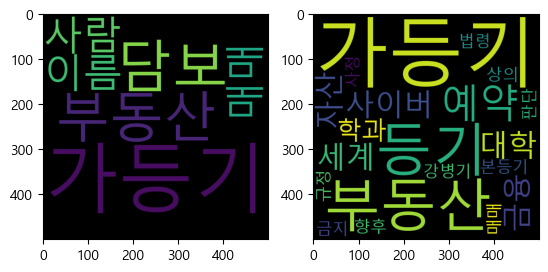

['담보', '가등기', '부동산', '사람', '이름', '매매', '가등기']
['세계', '사이버', '대학', '부동산', '금융', '자산', '학과', '강병기', '가등기', '본등기', '향후', '등기', '예약', '등기', '가등기', '부동산', '가등기', '금지', '법령', '상의', '규정', '사정', '매매', '예약', '가등기', '판단']


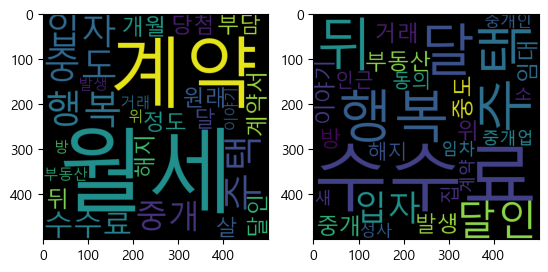

['원래', '계약', '월세', '살', '행복', '주택', '당첨', '개월', '정도', '월세', '계약', '중도', '해지', '월세', '계약서', '중도', '입자', '중개', '수수료', '부담', '달', '뒤', '행복', '주택', '달인', '입자', '부동산', '거래', '위', '이야기', '방', '중개', '수수료', '발생']
['달', '뒤', '행복', '주택', '달인', '입자', '부동산', '거래', '위', '이야기', '방', '중개', '수수료', '발생', '임대', '중도', '해지', '동의', '집', '인근', '중개업', '소', '새', '임차', '계약', '성사', '중개인', '수수료']


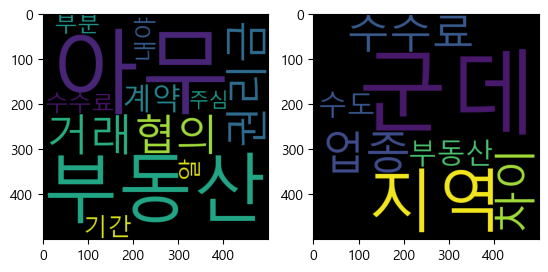

['아무', '부동산', '거래', '권리금', '협의', '계약', '기간', '수수료', '내야', '알', '부분', '주심']
['지역', '업종', '수수료', '차이', '부동산', '군데', '수도', '군데']


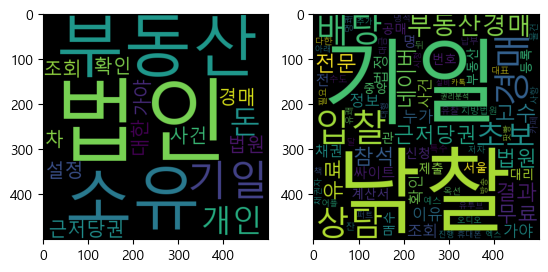

['개인', '법인', '돈', '법인', '소유', '부동산', '근저당권', '설정', '법인', '법인', '소유', '부동산', '대한', '차', '기일', '기일', '가야', '법원', '경매', '사건', '조회', '확인']
['근저당권', '입찰', '기일', '참석', '이유', '누가', '낙찰', '정보', '기일', '입찰', '법정', '입찰', '결과', '가야', '법원', '경매', '사건', '조회', '확인', '싸이트', '낙찰', '명', '입찰', '낙찰', '결과', '근저당권', '배당', '기일', '배당', '전', '채권', '계산서', '제출', '부동산', '경매', '공매', '관', '전문', '상담', '법원', '경매', '매수', '신청', '대리', '등록', '번호', '서울', '중앙', '지방법원', '전문', '예스', '옥션', '대표', '명석', '초보', '특수', '물건', '책', '저자', '채권자', '기일', '필요', '유찰', '수도', '낙찰', '다한', '낙찰', '잔', '대금', '납부', '달', '뒤', '배당', '기일', '참석', '배당', '사항', '네이버', '카페', '유쾌', '명쾌', '부동산경매', '휴대폰', '팟빵', '어플', '진행', '부동산경매', '초보', '고수', '오디오', '방송', '무료', '아래', '유투브', '시청', '부동산경매', '초보', '고수', '네이버', '엑스', '퍼트', '추가', '유료', '상담', '경매', '대행', '상담', '무료', '권리분석', '상담', '실비', '유료', '카톡']


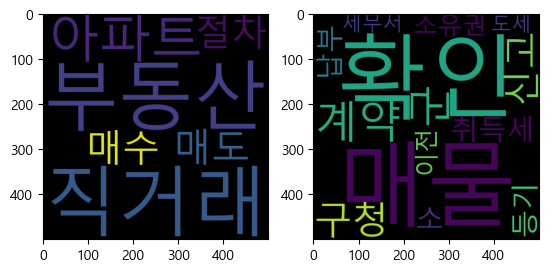

['부동산', '직거래', '아파트', '매도', '매수', '절차']
['매물', '확인', '계약', '군', '구청', '신고', '취득세', '납부', '등기', '소', '소유권', '이전', '세무서', '도세']


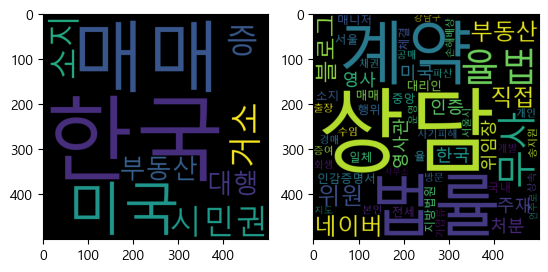

['미국', '시민권', '한국', '거소', '증', '소지', '한국', '부동산', '매매', '한국', '대행', '매매']
['미국', '주재', '한국', '영사관', '영사', '인증', '처분', '위임장', '인감증명서', '소지', '국내', '대리인', '매매', '계약', '체결', '계약', '일체', '행위', '율', '법률', '매니저', '율법', '무사', '네이버', '블로그', '서울', '중앙', '지방법원', '법률', '상담', '위원', '전세', '사기피해', '상담', '위원', '방문', '출장', '상담', '본인', '송지원', '경매', '공매', '부동산', '개발', '상속', '증여', '손해배상', '부동산', '채권', '가압류', '개인', '회생', '파산', '직접', '상담', '수임', '블로그', '직접', '운영', '서울시', '강남구', '언주로', '네이버', '지도', '율법', '무사', '사무소']


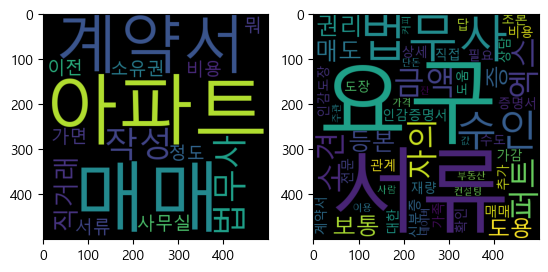

['아파트', '직거래', '매매', '계약서', '작성', '소유권', '이전', '법무사', '계약서', '작성', '아파트', '매매', '법무사', '사무실', '가면', '서류', '뭐', '비용', '정도']
['법무사', '요구', '서류', '매도', '보통', '권리', '증', '등본', '도용', '인감증명서', '인감도장', '요구', '수인', '초본', '가족', '관계', '증명서', '상세', '계약서', '요구', '신분증', '수인', '도장', '재량', '서류', '가감', '수도', '비용', '매매', '금액', '필요', '서류', '금액', '법무사', '직접', '도움', '확인', '추가', '대한', '답', '상담', '전문', '부동산', '컨설팅', '네이버', '엑스', '퍼트', '이용', '자의', '엑스', '퍼트', '가격', '단돈', '커피', '잔', '값', '자의', '주관', '소견', '사람', '소견']


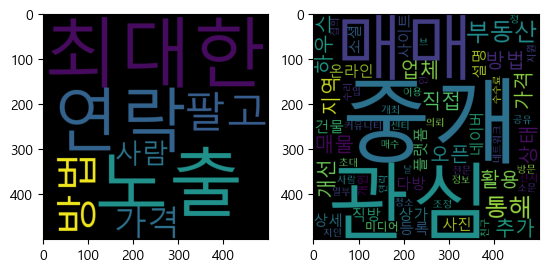

['최대한', '노출', '연락', '팔고', '방법', '가격', '사람']
['상가', '건물', '매매', '방법', '온라인', '플랫폼', '활용', '부동산', '중개', '사이트', '직방', '다방', '네이버', '부동산', '매물', '등록', '사진', '상세', '설명', '추가', '관심', '소셜', '미디어', '활용', '개인', '지역', '커뮤니티', '매물', '정보', '공유', '친구', '지인', '입', '소문', '날', '부동산', '중개', '업체', '이용', '전문', '중개', '업체', '의뢰', '네트워크', '통해', '매수', '오픈', '하우스', '직접', '방문', '정', '오픈', '하우스', '개최', '관심', '사람', '초대', '직접', '가격', '조정', '가격', '추가', '인', '센티', '브', '중개', '수수료', '일부', '지원', '상태', '개선', '수리', '청소', '통해', '집의', '상태', '개선', '관심', '방법', '통해', '관심', '매매', '지역', '신지', '연락', '매매']


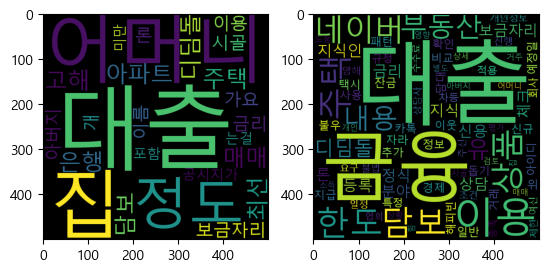

['어머니', '정도', '아파트', '매매', '고해', '대출', '은행', '주택', '담보', '대출', '최선', '디딤돌', '보금자리', '론', '금리', '대출', '이용', '가요', '아버지', '시골', '집', '어머니', '이름', '집', '개', '공시지가', '미만', '포함', '는걸']
['유', '주택', '자라', '디딤돌', '보금자리', '론', '상품', '이용', '일반', '주택', '담보', '대출', '금리', '한도', '이용', '유', '주택', '신규', '담대', '금융', '비교', '체크', '상품', '이용', '잔금', '예정일', '추가', '아이디', '확인', '택시', '지급', '해피빈', '불우', '이웃', '돕기', '사용', '네이버', '지식', '상담', '카톡', '경제', '분야', '지식인', '부동산', '담보', '대출', '금융', '상품', '담보', '대출', '분야', '위', '금융', '상담', '내용', '정보', '내용', '신용', '금융', '거래', '패턴', '차등', '적용', '네이버', '지식인', '이용', '규정', '특정', '회사', '개인정보', '양해', '대출', '진행', '불법', '수수료', '요구', '금융', '정식', '등록', '상담사', '여신', '금융', '협회', '정식', '등록', '체크', '주신', '내용', '디딤돌', '보금자리', '론', '금리', '대출', '일정', '조건', '충족', '이용', '대출', '한도', '제한', '아버지', '별도', '시골', '집', '거주', '부동산', '어머니', '소득', '신용', '평가', '대출', '한도', '영향', '부동산', '매매', '대출', '개인', '상황', '상세', '검토', '도움', '힘', '대출', '네이버', '지식']


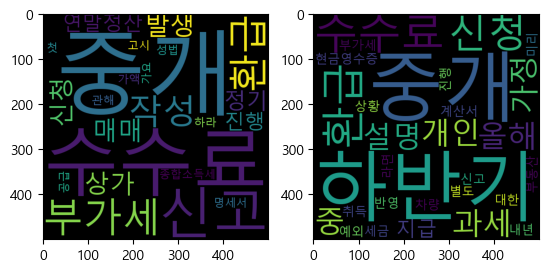

['상가', '매매', '발생', '중개', '수수료', '부가세', '환급', '신청', '정기', '신고', '부가세', '신고', '연말정산', '진행', '종합소득세', '고시', '신고', '첫', '중개', '수수료', '환급', '성법', '공급', '가액', '명세서', '작성', '하라', '중개', '수수료', '관해', '작성', '가요']
['개인', '과세', '가정', '설명', '올해', '하반기', '중', '중개', '수수료', '지급', '현금영수증', '세금', '계산서', '상황', '라면', '내년', '하반기', '대한', '부가세', '신고', '진행', '반영', '부동산', '차량', '취득', '예외', '환급', '신청', '중개', '수수료', '미리', '별도', '환급', '신청']


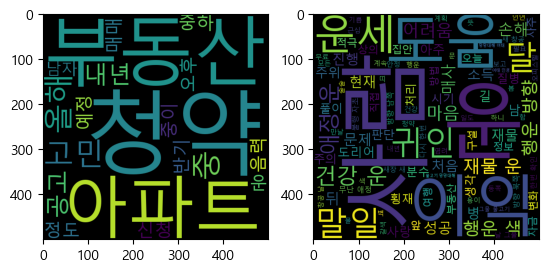

['부동산', '매매', '아파트', '청약', '고민', '중', '올해', '내년', '중', '부동산', '운', '올해', '아파트', '청약', '공고', '공고', '신청', '고민', '중이', '내년', '중하', '반기', '정도', '청약', '예정', '음력', '오후', '남자']
['올해', '내년', '운', '시기', '내년', '문서', '운', '부산', '역방', '추가', '유료', '상담', '넵', '토정비결', '풀이', '오늘', '운세', '꿈', '풀이', '띠', '운세', '무료', '주역', '음양설', '기초', '정통', '사주', '봄', '적중', '률', '오늘', '개월', '사주', '풀이', '아래', '확인', '사주', '정보', '음력', '오늘', '운세', '해몽', '띠', '운세', '무료', '평', '남편', '호랑이', '연발', '대가', '노력', '빛', '처음', '괴로움', '마침내', '영화', '질병', '서로', '마음', '상하', '주의', '매사', '곳곳', '관리', '실행', '뜻', '전달', '진행', '의심', '용이', '하늘', '마음껏', '활보', '대인', '라면', '봄', '만난', '장수', '정치', '만사', '귀인', '동', '만날', '이익', '서쪽', '샘', '비', '물이', '고이', '물', '다시', '목', '축', '음양', '서로', '이름', '높이', '널리', '알리', '위험', '사방', '매사', '활기', '달', '새장', '새', '창공', '날', '그물', '물고기', '망망대해', '여태', '인생', '행운', '사람', '도움', '하니', '풍요', '날', '사람과', '융화', '이익', '운', '처음', '진행', '어려움', '봉착', '행동', '조급', '심', '귀인', '주위', '도움', '술술', '말일', '왕', '환상', '의욕', '상실', '실의', '주

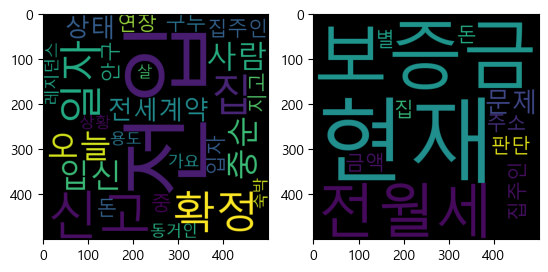

['전입', '신고', '확정', '일자', '오늘', '입신', '집', '중순', '사람', '집', '전세계약', '상태', '집주인', '입자', '안구', '지고', '돈', '구두', '연장', '중', '동거인', '전입', '신고', '상황', '레지던스', '숙박', '용도', '살', '전입', '신고', '확정', '일자', '가요']
['현재', '전월세', '보증금', '판단', '현재', '집', '보증금', '집주인', '돈', '주소', '현재', '전월세', '보증금', '금액', '문제', '별', '문제']


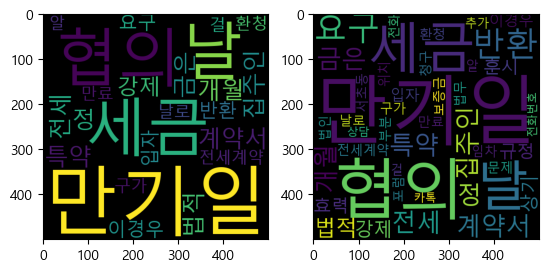

['계약서', '만기일', '특약', '만기일', '개월', '협의', '날', '정', '집주인', '날', '협의', '전세', '금은', '법적', '강제', '이경우', '입자', '만기일', '세금', '반환', '요구', '전세계약', '만료', '날로', '세금', '환청', '구가', '걸', '알']
['계약서', '만기일', '특약', '만기일', '개월', '협의', '날', '정', '집주인', '날', '협의', '전세', '금은', '법적', '강제', '협의', '상기', '효력', '훈시', '규정', '이경우', '입자', '만기일', '세금', '반환', '요구', '전세계약', '만료', '날로', '세금', '환청', '구가', '걸', '알', '임차', '보증금', '반환', '요구', '문제', '만기일', '청구', '서초동', '위치', '법무', '법인', '포럼', '부분', '추가', '전화', '카톡', '상담', '전화번호']


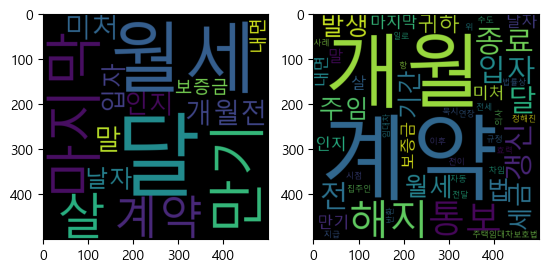

['달', '월세', '만기', '달', '마지막', '살', '계약', '개월전', '말', '미처', '인지', '달', '입자', '날자', '보증금', '월세', '내면']
['달', '월세', '만기', '달', '마지막', '살', '계약', '개월', '전', '말', '미처', '인지', '달', '입자', '날자', '보증금', '월세', '내면', '주택임대차보호법', '전세', '계약', '해지', '의사', '계약', '종료', '개월', '전', '개월', '전', '집주인', '전달', '주임', '법', '계약', '갱신', '항', '위', '기간', '해지', '통보', '계약', '자동', '연장', '묵시', '갱신', '발생', '입자', '계약', '종료', '세금', '수도', '해지', '통보', '세금', '반환', '시점', '귀하', '사례', '법률상', '정해진', '기간', '해지', '통보', '주임', '법', '계약', '갱신', '이후', '입자', '계약', '해지', '통보', '일로', '개월', '해지', '효력', '발생', '규정', '귀하', '개월', '전이', '통보', '개월', '임대차', '종료', '차임', '지급']


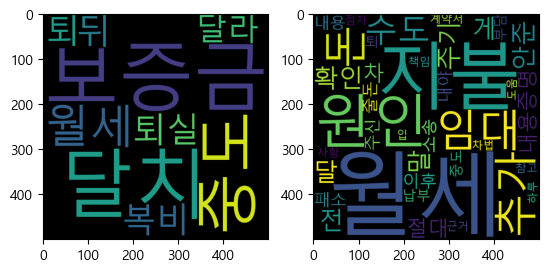

['중도', '퇴', '보증금', '중도', '퇴실', '달치', '월세', '보증금', '복비', '달치', '보증금', '뒤', '월세', '달치', '달라']
['임대', '말', '게', '확인', '월세', '달', '안준', '돈', '주기', '전', '절대', '차', '내용증명', '이후', '소송', '패소', '줄돈', '내야', '돈', '주신', '내용', '월세', '추가', '지불', '월세', '납부', '원인', '중도', '퇴', '추가', '부담', '원인', '수도', '계약서', '임대', '차법', '근거', '월세', '지불', '사항', '원인', '수도', '입', '점자', '책임', '월세', '지불', '참고', '도움', '하루']


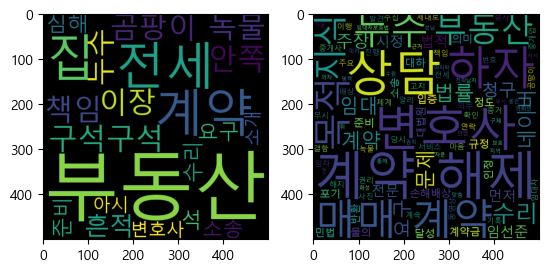

['전세', '계약', '집', '부동산', '구석구석', '책임', '녹물', '이장', '안쪽', '곰팡이', '누수', '흔적', '심해', '석', '수리', '요구', '부동산', '소송', '준비', '부동산', '변호사', '아시', '소개']
['네이버', '지식', '상담', '변호사', '임선준', '체계', '전문', '법률', '서비스', '확인', '번호', '연락', '전세', '계약', '발견', '문제', '마음', '먼저', '계약', '당시', '중개사', '임대', '고지', '의무', '제대로', '이행', '법적', '문제', '부동산', '중개업', '주요', '결함', '알리', '배상', '책임', '수리', '요구', '계속', '무시', '임대', '임차', '권리', '수리', '청구', '시정', '임대차', '계약', '해지', '주장', '손해배상', '청구', '입증', '증거', '수집', '녹물', '곰팡이', '문제', '사진', '동영상', '기록', '법적', '절차', '진행', '임대차보호법', '근거', '임대', '시정', '요구', '손해배상', '청구', '소송', '전', '미리', '부동산', '변호사', '법률', '상담', '구체', '전략', '보시', '수원', '지역', '성남', '화성', '용인', '평택', '안양', '법률', '상담', '가능', '상담', '통해', '의뢰인', '위', '맞춤', '자문', '마지막', '의자', '서서', '남지', '권익', '보호', '임선준', '변호사', '네이버', '지식', '지식', '전문가', '수리', '요구', '계약', '파기', '보증금', '반환', '소송', '준비', '부동산', '본인', '주장', '중개', '수수료', '반환', '해', '하자', '정도', '발생', '시기', '거주', '기간', '상세', '부분', '상담', '변호사', '준비', '소장', '수리', '김정', '변호사'

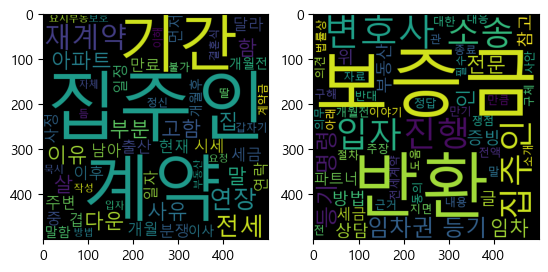

['전세', '집주인', '분쟁', '아파트', '전세', '계약', '기간', '중', '집주인', '집주인', '현재', '아파트', '전세', '살', '계약', '기간', '남아', '살', '달라', '고함', '함', '세금', '다운', '재계약', '다운', '이유', '주변', '시세', '재계약', '기간', '계약', '개월', '이유', '집주인', '계약', '만료', '집주인', '사정', '기간', '이후', '출산', '일정', '겹', '계약', '일자', '먼저', '집', '집주인', '연락', '계약', '기간', '개월전', '말', '고함', '집', '계약', '개월후', '이사', '집주인', '말함', '갑자기', '말', '함', '불가', '사유', '딸', '결혼식', '정신', '이해', '사유', '듬', '계약금', '요지부동', '입자', '보호', '방법', '계약', '연장', '자체', '집주인', '요청', '기간', '연장', '부분', '재계약', '집주인', '부분', '묵시', '연장', '부동산', '재계약', '작성']
['전', '개월전', '말', '집주인', '동의', '내용', '대한', '증빙', '쟁점', '증빙', '반대', '정답', '만큼', '의견', '전세계약', '종료', '집주인', '입자', '보증금', '전액', '반환', '의무', '보증금', '집주인', '입자', '구해', '지면', '보증금', '이야기', '법률상', '근거', '주장', '만기', '집주인', '보증금', '임차권', '등기', '명령', '보증금', '반환', '소송', '진행', '구체', '대응', '방법', '사안', '상담', '자료', '전문', '변호사', '상담', '진행', '참고', '글', '소개', '임차권', '등기', '명령', '보증금', '반환', '소송', '관', '아래', '글', '참고', '도움', '부동산', '전문', '변호사', '보증금',

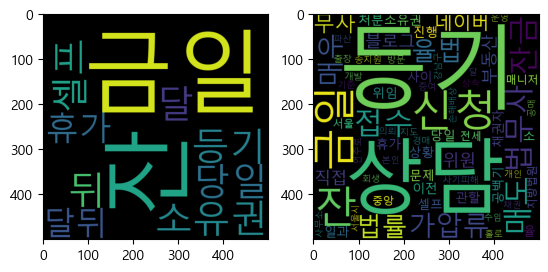

['소유권', '등기', '잔', '금일', '당일', '달', '뒤', '셀프', '휴가', '잔', '금일', '달뒤']
['소유권', '이전', '등기', '신청', '잔', '금일', '관할', '등기', '소', '접수', '휴가', '문제', '셀프', '법무사', '위임', '잔금', '당일', '잔금', '일과', '등기', '신청', '접수', '사이', '공백기', '매도', '처분', '매도', '채권자', '가압류', '진행', '매우', '상황', '율', '법률', '매니저', '율법', '무사', '네이버', '블로그', '서울', '중앙', '지방법원', '법률', '상담', '위원', '전세', '사기피해', '상담', '위원', '방문', '출장', '상담', '본인', '송지원', '경매', '공매', '부동산', '개발', '상속', '증여', '손해배상', '부동산', '채권', '가압류', '개인', '회생', '파산', '직접', '상담', '수임', '블로그', '직접', '운영', '서울시', '강남구', '언주로', '네이버', '지도', '율법', '무사', '사무소', '홀로', '등기', '잔', '금일', '기준', '등기', '달', '매우', '법무사', '의뢰']


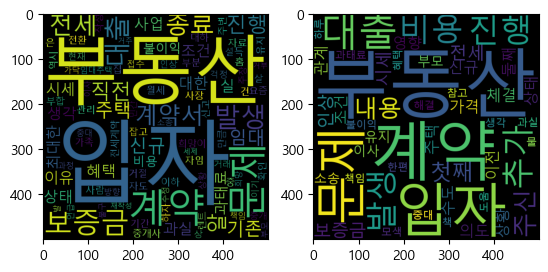

['부동산', '중개사', '이하', '부동산', '은', '임대', '주택', '임대', '사업', '자임', '알', '주택', '직전', '계약', '종료', '계약', '부동산', '계약', '진행', '기존', '보증금', '자료', '문제', '발생', '건', '계약', '전세', '보증금', '기존', '전세계약', '종료', '월세', '전환', '생각', '기존', '전세', '계약', '희망이', '거절', '이유', '부분', '대하', '부동산', '알', '신규', '입자', '요즘', '대출', '대출', '조건', '부합', '전세', '주택', '중', '부동산', '사장', '집', '가족', '알', '살', '사람', '설득', '신규', '입자', '최대한', '대출', '대출', '조건', '보증금', '잡고', '전세', '진행', '계약서', '보증금', '직전', '상태', '시세', '계약서', '부동산', '직전', '종료', '계약', '자도', '관리', '실', '기간', '실', '유지', '이유', '알', '보증금', '대한', '진행', '역시', '확인', '진행', '문제', '생각', '주변', '시세', '만큼', '계약서', '작성', '신규', '입자', '계약서', '렌트', '홈', '신고', '하자', '직전', '종료', '전세', '보증금', '인상', '계약', '접수', '현재', '입자', '대출', '문제', '발생', '걱정', '부동산', '중개', '상', '문제', '상황', '이기', '과실', '주장', '거래', '대한', '과태료', '민간', '임대주택', '사업', '혜택', '불이익', '발생', '임대', '문제', '발', '최대한', '입자', '계약', '종료', '입자', '문제', '방향', '가닥', '과정', '발생', '비용', '부동산', '중대', '과실', '책임', '입자', '이사', '희망', '비용', '문제', '발생', '

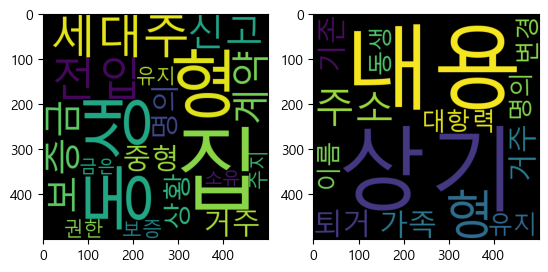

['집', '세대주', '형', '동생', '거주', '중형', '집', '전입', '신고', '상황', '집', '보증금', '형', '명의', '유지', '계약', '형', '세대주', '계약', '권한', '보증금', '동생', '주지', '집', '전입', '신고', '집', '동생', '보증', '금은', '소유']
['상기', '내용', '형', '주소', '퇴거', '가족', '거주', '기존', '대항력', '유지', '명의', '동생', '이름', '변경']


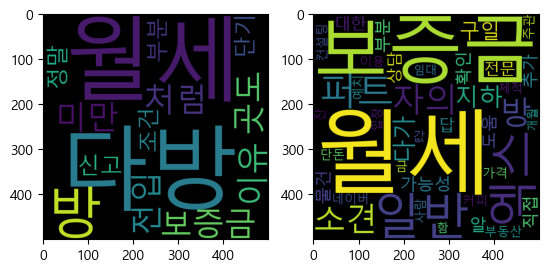

['다방', '월세', '방', '보증금', '처럼', '미만', '곳도', '이유', '전입', '신고', '단기', '정말', '조건', '부분']
['월세', '보증금', '지하', '다가', '구일', '가능성', '일반', '부분', '물건', '직접', '알', '도움', '확인', '추가', '대한', '답', '상담', '전문', '부동산', '컨설팅', '네이버', '엑스', '퍼트', '이용', '자의', '엑스', '퍼트', '가격', '단돈', '커피', '잔', '값', '자의', '주관', '소견', '사람', '소견', '보증금', '예치', '금', '체적', '월세', '방', '함', '임대', '입장', '방', '월세', '일반', '개월', '보증금']


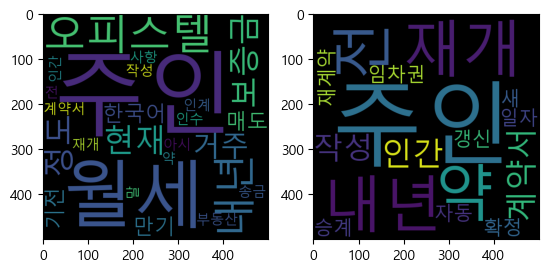

['현재', '보증금', '월세', '정도', '오피스텔', '거주', '한국어', '내년', '만기', '기전', '주인', '오피스텔', '매도', '부동산', '말', '월세', '사항', '인수', '인계', '주인', '주인', '주인', '월세', '송금', '내년', '재개', '약', '전', '주인', '인간', '계약서', '작성', '아시']
['내년', '재개', '약', '전', '주인', '인간', '계약서', '작성', '주인', '임차권', '자동', '승계', '새', '주인', '갱신', '재계약', '확정', '일자']


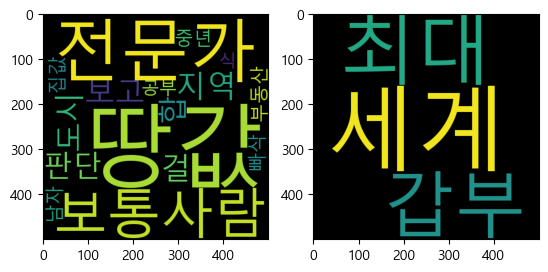

['전문가', '보통사람', '지역', '도시', '땅값', '걸', '보고', '판단', '합', '중년', '남자', '부동산', '집값', '땅값', '빠삭', '공부', '식']
['세계', '최대', '갑부']


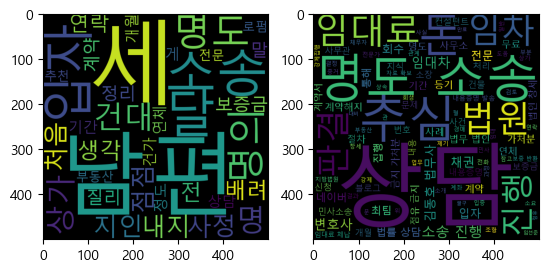

['명도', '소송', '남편', '명의', '건대', '상가', '입자', '명', '달', '세', '내지', '남편', '지인', '처음', '사정', '점점', '생각', '배려', '전', '연락', '보증금', '남편', '질리', '말', '정리', '계약', '기간', '개월', '정도', '세', '연체', '게', '달', '소송', '세', '입자', '건가', '상담', '부동산', '전문', '로펌', '추천']
['네이버', '지식', '상담', '변호사', '임선준', '싸움', '민사소송', '대비', '전문', '법조인', '번호', '참고', '상담', '사유', '임대료', '연체', '계약', '만료', '불구', '장소', '점유', '임차', '상대로', '명도', '소송', '절차', '진행', '수가', '퇴거', '조치', '취하', '기', '위', '부동산', '전문', '로펌', '변호사', '도움', '추천', '명도', '소송', '제기', '전', '내용증명', '발송', '사태', '전', '입자', '결과', '도출', '입자', '합의', '가능성', '추후', '소송', '과정', '상대방', '고의', '입증', '증거', '활용', '참고', '소', '점유권', '이전', '가처분', '준비', '부분', '금액', '문제', '만큼', '피해', '점점', '전문', '변호사', '도움', '보시', '상담', '번호', '통해', '예약', '임대료', '건물', '명도', '강제집행', '지연', '이자', '한번', '조력', '상담', '사건', '검토', '통해', '변수', '사전', '대비', '전문', '변호사', '조언', '평일', '주말', '공휴일', '상시', '예약', '가능', '임선준', '변호사', '네이버', '지식', '지식', '전문가', '서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '박영재', '변호사'

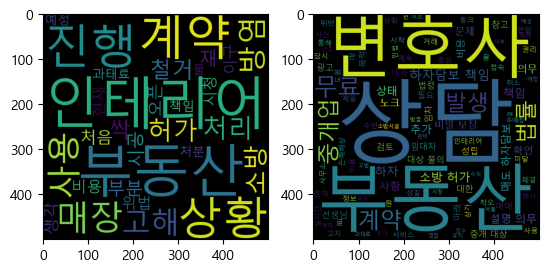

['인테리어', '매장', '부동산', '인테리어', '사용', '고해', '계약', '진행', '방염', '처리', '인테리어', '소방', '허가', '철거', '싹', '부분', '재', '시공', '진행', '상황', '처음', '계약', '생각', '오픈', '비용', '상황', '이구', '현재', '시청', '부동산', '위법', '과태료', '처분', '예정', '부동산', '책임', '물']
['상가', '임대차', '계약', '소방', '허가', '문제', '추가', '비용', '발생', '대한', '부동산', '책임', '검토', '선생님', '계약', '당시', '인테리어', '완비', '상태', '매장', '인수', '방염', '처리', '소방', '허가', '상황', '이로', '예상', '원', '추가', '비용', '발생', '시청', '부동산', '원', '과태료', '부과', '예정', '법령', '판례', '검토', '임대차', '계약', '체결', '임대', '임차', '목적', '물', '사용', '수익', '상태', '유지', '의무', '서울', '고법', '선고', '민', '사부', '판결', '소방시설', '임차', '영업', '임차', '차임', '지급', '의무', '발생', '내용', '착오', '의사표시', '취소', '관', '민법', '법률행위', '중요', '부분', '착오', '취소', '과실', '추가', '상담', '노크', '상담', '서비스', '이용', '변호사', '선임', '사건', '필요', '법률', '사무소', '광고', '무료', '계속', '무료', '아래', '링크', '접속', '상담', '시작', '변호사', '무료', '법률', '상담', '노크', '실시간', '상담', '비밀', '보장', '변호사', '무료', '비밀', '보장', '법률', '상담', '선생님', '상황', '상가', '임대차', '계약', '소방', '허가', '문제', '상치', '비용', '증

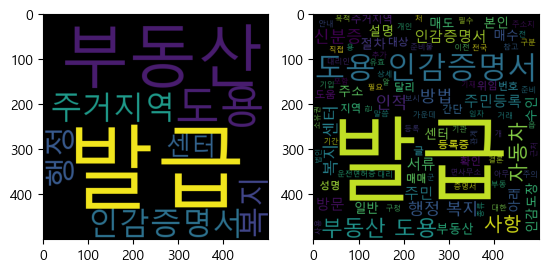

['부동산', '도용', '인감증명서', '발급', '주거지역', '행정', '복지', '센터', '발급']
['부동산', '도용', '인감증명서', '본인', '전국', '행정', '복지', '센터', '주민', '센터', '발급', '주거지역', '지역', '행정', '복지', '센터', '방문', '발급', '발급', '필요', '사항', '신분증', '주민', '등록증', '운전면허증', '본인', '확인', '서류', '인감도장', '등록', '인감도장', '발급', '목적', '부동산', '도용', '기재', '행정', '복지', '센터', '신분증', '인감도장', '방문', '발급', '자동차', '도용', '인감증명서', '발급', '방법', '사항', '아래', '글', '참고', '자동차', '도용', '인감증명서', '발급', '방법', '간단', '설명', '자동차', '도용', '인감증명서', '발급', '방법', '간단', '설명', '자동차', '매도', '자동차', '등록증', '도용', '인감증명서', '도용', '인감증명서', '부동산', '자동차', '거래', '매도', '발급', '서류', '일반', '용', '인감증명서', '달리', '도용', '인감증명서', '증명서', '가운데', '매수', '인적', '사항', '성명', '주민등록', '번호', '주소', '기입', '관계', '도용', '인감증명서', '발급', '전', '매수', '인적', '사항', '성명', '주민등록', '번호', '주소', '알', '발급', '기관', '방문', '자동차', '도용', '인감증명서', '란', '자동차', '도용', '인감증명서', '부동산', '도용', '인감증명서', '발급', '주거지역', '행정', '복지', '센터', '발급', '근처', '주민', '센터', '군', '구청', '읍', '면사무소', '방문', '준비물', '신분증', '수인', '인적', '사항', '주민등록', '주소', '확인', '필수'

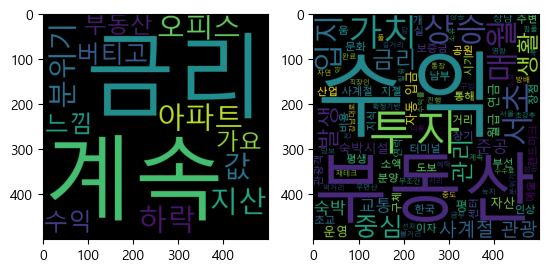

['금리', '계속', '아파트', '값', '하락', '분위기', '지산', '오피스', '버티고', '느낌', '수익', '부동산', '가요']
['수익', '부동산', '무조건', '답', '금리', '계속', '상승', '분위기', '수익', '부동산', '분양', '투자', '중도', '금무', '이자', '진행', '준공', '전', '금리', '영향', '사계절', '관광', '숙박', '서초', '움', '지젤', '소액', '투자', '수익', '발생', '관리', '평생', '월급', '연금', '매월', '자동', '입금', '부동산', '가치', '상승', '입지', '투자', '매월', '수익', '교통', '생활', '문화', '예술', '중심', '초교', '남부', '터미널', '도보', '거리', '서초', '강남대로', '부선', '자연', '녹지', '기반', '서리', '풀', '공원', '부선', '상공', '우면산', '방배', '공원', '먹거리', '볼거리', '길거리', '힐링', '부동산', '상승', '가치', '재테크', '성공', '입지', '한국', '랜드마크', '서초', '중심', '사계절', '관광객', '짐풀', '서울', '주변', '교통', '입지', '특', '장점', '준공', '완료', '생활', '숙박시설', '투자', '약', '평', '담보', '구입', '실', '투자', '소요', '보증금', '대출', '이자', '수익률', '소유', '부동산', '자산', '가치', '관리', '매월', '월급', '연금', '통장', '자동', '입금', '직장인', '부동산', '투자', '초강추', '수익', '발생', '혜택', '매월', '확정', '수익', '보증금', '선지', '운영', '수수료', '제후', '지급', '전문', '운영', '관리', '온라인', '홍보', '관광객', '장악', '사계절', '공연', '뮤지컬', '국악', '오디션', '박물', '관등', '사

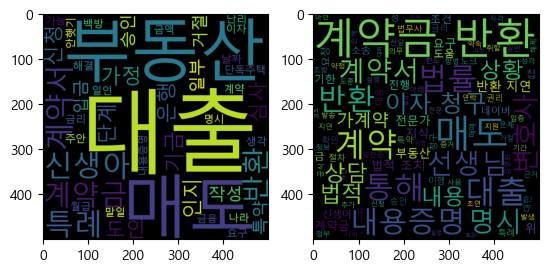

['신생아', '특례', '대출', '가정', '인지', '기금', '신청', '은행', '심사', '단계', '부동산', '도인', '계약서', '작성', '계약금', '일부', '대출', '승인', '입금', '신생아', '특례', '대출', '거절', '계약금', '반환', '특약', '단독주택', '나라', '대출', '금액', '백방', '금융', '금리', '대출', '가능', '부동산', '계약', '매도', '반환', '매도', '대출', '생각', '안햇기', '부동산', '요구', '월급', '일인', '말일', '난리', '주안', '해결', '계약서', '명시', '날짜', '매도', '이자', '내용증명']
['네이버', '지식', '상담', '변호사', '임선준', '사전', '법적', '대비', '번호', '확인', '법률', '상담', '통해', '상황', '검토', '부동산', '계약금', '반환', '특약', '계약서', '명시', '신생아', '특례', '대출', '거절', '상황', '계약금', '권리', '매도', '반환', '지연', '상황', '라면', '계약서', '내용', '근거', '계약금', '반환', '요청', '무시', '법적', '조치', '매도', '일정', '기간', '반환', '약속', '기한', '대응', '매도', '약속', '내용증명', '통해', '공식', '반환', '요청', '매도', '법적', '책임', '전달', '효과', '반환', '요청', '정당성', '이자', '청구', '명시', '계약서', '반환', '지연', '피해', '입증', '청구', '반환', '기한', '내용증명', '통해', '다시', '한번', '요구', '전달', '반환', '민사', '소송', '진행', '밀착', '소통', '통해', '의뢰인', '권리', '첫', '상담', '사건', '마무리', '전문', '변호사', '직접', '조언', '진행', '전국', '모든', '날', '법률', '조력', '

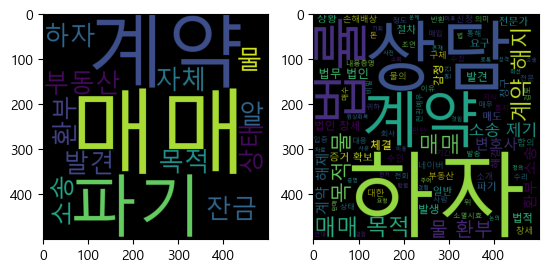

['부동산', '매매', '계약', '잔금', '하자', '발견', '매매', '계약', '자체', '파기', '상태', '매매', '계약', '파기', '매매', '목적', '물', '환부', '소송', '알']
['로톡', '네이버', '지식', '상담', '변호사', '소희', '부동산', '매입', '하자', '발생', '계약', '파기', '하자', '정의', '하자', '계약', '체결', '발견', '하자', '매매', '계약', '해제', '사유', '하자', '매수', '계약', '체결', '계약', '체결', '정도', '결함', '의미', '계약', '파기', '매매', '목적', '물', '환부', '소송', '계약', '파기', '매매', '계약', '파기', '일반', '매매', '계약', '체결', '상태', '하자', '발생', '계약', '해제', '원상회복', '요구', '의미', '매매', '목적', '물', '환부', '소송', '계약', '체결', '매수', '상태', '매매', '목적', '물', '하자', '발생', '이유', '매매', '계약', '해제', '목적', '물의', '반환', '요구', '소송', '제기', '법적', '절차', '하자', '통지', '하자', '발견', '먼저', '판매', '하자', '통지', '해결', '위', '기회', '주어', '이후', '문제', '해결', '계약', '해제', '요구', '소송', '제기', '계약', '해제', '하자', '것임', '입증', '소송', '통해', '목적', '물', '환부', '요청', '매매', '목적', '물', '환부', '소송', '제기', '일반', '증거', '확보', '하자', '증명', '하자', '대한', '증거', '확보', '사진', '전문가', '감정', '수리', '비용', '하자', '존재', '입증', '자료', '수집', '법률', '상담', '전문가', '조언', '법률', '절차', '부동산', '소송', '

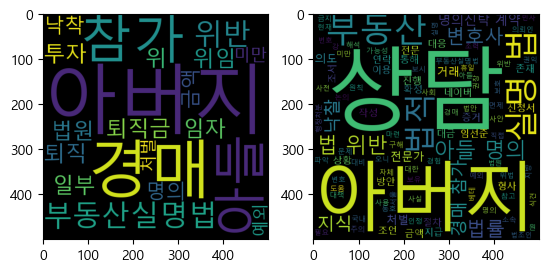

['아버지', '퇴직', '퇴직금', '일부', '투자', '위', '법원', '경매', '참가', '위임', '아들', '임자', '아버지', '아버지', '아들', '명의', '경매', '참가', '낙착', '부동산실명법', '위반', '부동산실명법', '위반', '금액', '미만', '처벌', '예외']
['네이버', '지식', '상담', '변호사', '임선준', '법안', '대한', '전문', '식견', '경험', '보유', '베테', '변호사', '직접', '도움', '번호', '연락', '부동산실명법', '부동산', '거래', '실명', '거래', '명의', '사용', '거래', '원칙', '금지', '아버지', '아들', '명의', '법원', '경매', '참가', '낙찰', '부동산', '실명', '법', '위반', '해석', '법적', '문제', '처벌', '위반', '금액', '아버지', '낙찰', '금액', '원', '미만', '형사', '처벌', '행정처분', '면제', '가능성', '존재', '처벌', '예외', '위법', '사실', '자체', '인정', '주의', '사안', '경매', '절차', '법적', '조언', '전문', '변호사', '현재', '상황', '파악', '법적', '대책', '강', '구해', '필요', '법률', '상담', '통해', '대응', '방안', '논의', '보시', '권장', '사전', '대비', '통해', '의뢰인', '권익', '보호', '방안', '마련', '형사', '민사', '법적', '절차', '대응', '법조인', '국내', '휴일', '조력', '진행', '오니', '참고', '임선준', '변호사', '네이버', '지식', '지식', '전문가', '서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '동호', '변호사', '부동산', '실명', '법', '위반', '아버지', '아들', '명의', '경매', '참가', '부동산', '취득', '부동산'

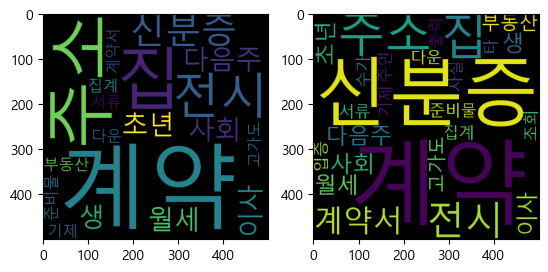

['사회', '초년', '생', '다음주', '월세', '이사', '부동산', '계약', '집', '계약', '주소', '전시', '신분증', '고가도', '주소', '전시', '준비물', '신분증', '집계', '서류', '기제', '집', '계약', '계약', '계약서', '다운']
['사회', '초년', '생', '다음주', '월세', '이사', '부동산', '계약', '집', '계약', '주소', '전시', '신분증', '고가도', '주소', '전시', '준비물', '신분증', '집계', '서류', '기제', '집', '계약', '계약', '계약서', '다운', '주민', '타', '계약', '사실', '조회', '입증', '수가', '신분증', '출력', '계약서', '신분증']


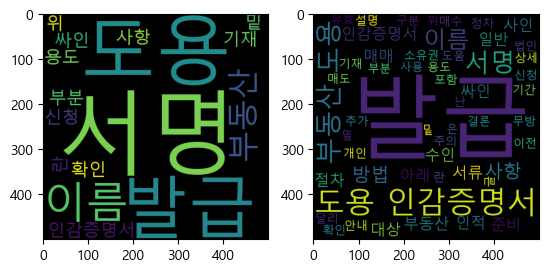

['부동산', '도용', '인감증명서', '발급', '용도', '도용', '란', '위', '기재', '사항', '확인', '밑', '발급', '신청', '이름', '서명', '서명', '부분', '서명', '이름', '싸인']
['부동산', '도용', '인감증명서', '발급', '용도', '도용', '란', '위', '기재', '사항', '확인', '밑', '발급', '신청', '이름', '서명', '서명', '부분', '서명', '이름', '싸인', '서명', '이름', '서명', '은', '이름', '정자', '옆', '싸인', '부동산', '도용', '인감증명서', '발급', '서명', '난', '이름', '사인', '결론', '사인', '무방', '부동산', '도용', '인감증명서', '발급', '방법', '준비', '서류', '아래', '글', '부동산', '도용', '인감증명서', '발급', '방법', '부동산', '도용', '인감증명서', '발급', '방법', '안내', '부동산', '도용', '인감증명서', '부동산', '매매', '매도', '매수', '서류', '소유권', '이전', '절차', '도용', '인감증명서', '일반', '인감증명서', '수인', '인적', '사항', '포함', '발급', '추가', '준비', '아래', '개인', '법인', '구분', '발급', '절차', '주의', '사항', '상세', '설명', '도용', '인감증명서', '발급', '대상', '유효', '기간', '대상', '부동산', '도용', '인감증명서', '부동산', '매매', '사용', '일반', '인감증명서', '달리', '수인', '인적', '도움']


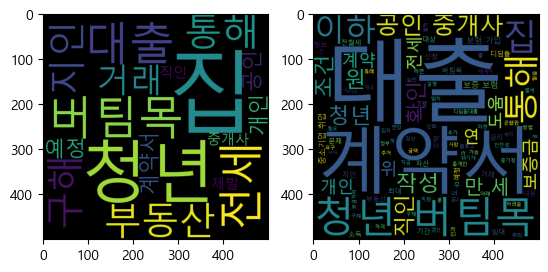

['청년', '버팀목', '전세', '대출', '부동산', '통해', '집', '구해', '지인', '집', '거래', '예정', '개인', '계약서', '공인', '중개사', '직인', '제발']
['청년', '버팀목', '대출', '청년', '버팀목', '대출', '위', '부동산', '통해', '집', '필요', '지인', '집', '거래', '예정', '라면', '개인', '계약서', '작성', '사항', '확인', '공인', '중개사', '직인', '청년', '버팀목', '대출', '신청', '공인', '중개사', '직인', '공인', '중개사', '통해', '계약', '진행', '계약', '신뢰', '성과', '안전성', '계약서', '작성', '개인', '계약서', '작성', '계약서', '내용', '법적', '문제', '주의', '계약서', '임대', '인과', '임차', '정보', '임대', '기간', '보증금', '월세', '조건', '기재', '보증', '보험', '가입', '청년', '버팀목', '대출', '보증', '보험', '가입', '보증', '보험', '가입', '위', '계약서', '계약서', '공인', '중개사', '통해', '작성', '문제', '정보', '도움', '추가', '말씀', '도움', '엄지', '집', '마련', '대출', '어려움', '정부', '지원', '디딤돌', '특례', '대출', '버팀목', '은행권', '금리', '대출', '환', '대출', '제도', '통해', '도움', '대출', '승인', '자격', '조건', '한도', '신청', '방법', '구체', '설명', '내용', '아래', '글', '확인', '블로그', '청년', '위', '주거', '대출', '가이드', '버팀목', '중소기업', '취업', '디딤돌', '보금자리', '론', '중기청', '전월세', '대출', '확인', '청년', '버팀목', '전세', '대출', '확인', '디딤돌대출', '청년', '버팀목', '자금', '대

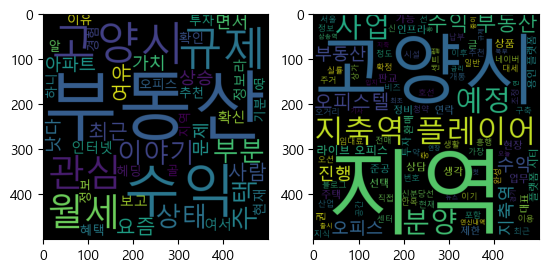

['최근', '부동산', '관심', '고양시', '수익', '부동산', '부동산', '사람', '요즘', '월세', '수익', '여유', '고양시', '수익', '부동산', '이야기', '아파트', '가치', '상승', '월세', '낫다', '면서', '문제', '인터넷', '정보라', '확신', '상태', '현재', '주택', '상태', '여서', '주택', '부동산', '규제', '부동산', '관심', '보고', '오피스', '부동산', '규제', '이야기', '확인', '부동산', '규제', '부분', '혜택', '수익', '부동산', '투자', '고양시', '지역', '골', '알', '추천', '이유', '땅', '헤딩', '기분', '하니', '부분', '수익', '부동산', '경험', '정보']
['첫', '오피스', '부동산', '규제', '오늘', '권', '업무', '시설', '실률', '임대료', '흥행', '뉴스', '기사', '최근', '권', '업무', '시설', '실률', '임대료', '흥행', '경기', '고양시', '지축', '동', '라이브', '오피스', '지축역', '플레이어', '분양', '중이', '지축역', '플레이어', '호선', '지축역', '이용', '입지', '개통', '예정', '연신내역', '북부', '연장', '예정', '신분당선', '삼송역', '이용', '부동산', '최초', '연', '확정', '금리', '상품', '지축역', '플레이어', '출시', '눈길', '이처럼', '담보', '대출', '제한', '전매', '제한', '제한', '주택', '수익', '부동산', '오피스', '투자', '최근', '대세', '일반', '오피스', '라이브', '오피스', '이기', '고양시', '수익', '부동산', '라이브', '오피스', '라이브', '오피스', '란', '일과', '주거', '공간', '재택근무', '현재', '대세', '주거', '형태', '지역', '고양시', '지축역', '플레이어',

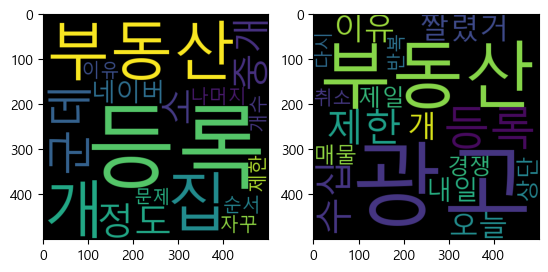

['군데', '정도', '부동산', '중개', '소', '집', '네이버', '부동산', '등록', '개', '등록', '나머지', '등록', '순서', '자꾸', '이유', '집', '개', '등록', '등록', '개수', '제한', '문제']
['등록', '제한', '수십', '부동산', '광고', '이유', '부동산', '광고', '짤렸거', '오늘', '개', '부동산', '광고', '내일', '광고', '제일', '상단', '광고', '경쟁', '매물', '취소', '다시', '반복']


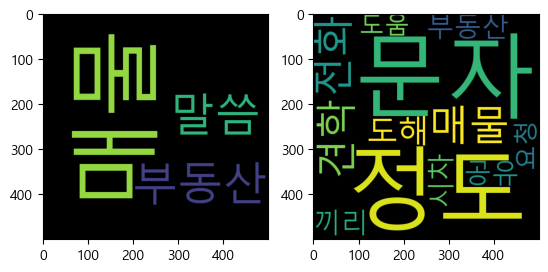

['매물', '부동산', '말씀']
['문자', '정도', '매물', '견학', '전화', '도해', '부동산', '끼리', '공유', '시차', '도움', '요청']


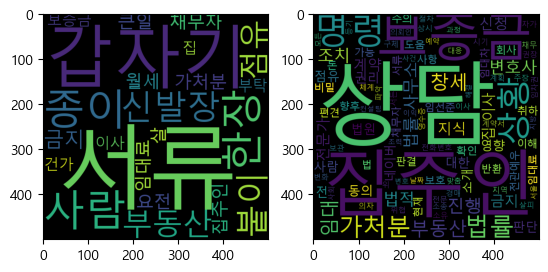

['갑자기', '사람', '서류', '종이', '한장', '신발장', '붙이', '서류', '부동산', '점유', '금지', '가처분', '채무자', '집주인', '요전', '월세', '살', '임대료', '큰일', '보증금', '집', '이사', '건가', '부탁']
['네이버', '지식', '상담', '변호사', '임선준', '현재', '상황', '파악', '법적', '조치', '진행', '전문', '법률', '상담', '상시', '가능', '전화번호', '확인', '부동산', '점유', '금지', '가처분', '채무자', '소유', '부동산', '자가', '권리', '주장', '법원', '명령', '의자', '집주인', '채무', '부동산', '대한', '법적', '조치', '진행', '상황', '판단', '향후', '경매', '법적', '절차', '주의', '집주인', '상황', '향후', '임대차', '계약', '위협', '보증금', '보호', '위', '임대차', '계약서', '영수증', '보관', '집주인', '상황', '변화', '주의', '살피', '시기', '이사', '보증금', '반환', '소송', '임차권', '등기', '명령', '신청', '진행', '집', '이사', '전', '보증금', '반환', '대한', '구체', '계획', '부동산', '법률', '전문가', '상담', '법적', '조치', '취하', '권장', '전', '지역', '서든', '의뢰인', '날짜', '상담', '예약', '가능', '보증금', '권리', '이익', '보호', '맞춤', '법률', '컨설팅', '진행', '사건', '해결', '법적', '대응', '모든', '과정', '체계', '조력', '진행', '임선준', '변호사', '네이버', '지식', '지식', '전문가', '서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '박영재', '변호사', '당황', '단계', '상황', '이해', '집주인', '부동

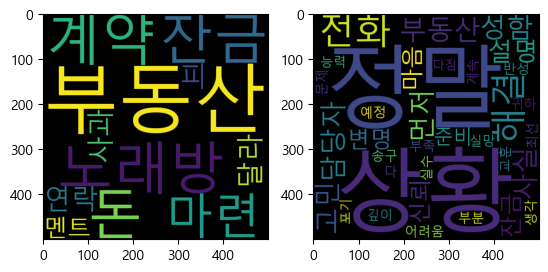

['노래방', '계약', '잔금', '돈', '마련', '부동산', '연락', '피', '부동산', '달라', '사과', '멘트']
['부동산', '담당자', '성함', '먼저', '전화', '정말', '사실', '전화', '고민', '상황', '설명', '변명', '신뢰', '마음', '잔금', '준비', '어려움', '능력', '부족', '상황', '예정', '정말', '송구', '깊이', '반성', '귀하', '실망', '부분', '생각', '포기', '문제', '해결', '계속', '최선', '다', '교훈', '실수', '다짐', '상황', '해결', '정말']


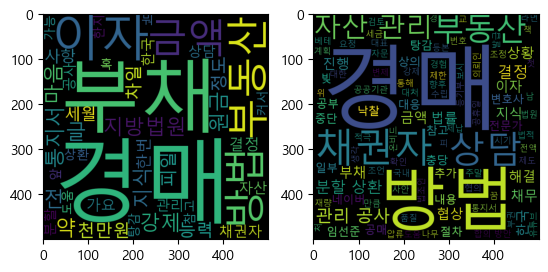

['지방법원', '부동산', '강제', '경매', '통지서', '지식', '마음', '글', '약', '전', '원금', '천만원', '정도', '부채', '능력', '차일', '피일', '세월', '이자', '이자', '부채', '사항', '한번', '경매', '결정', '경매', '방법', '가요', '채권자', '한국', '자산', '관리', '공사', '상담', '분할', '상환', '금액', '커서', '혹', '이자', '탕감', '가능', '한지', '앞', '방법', '뭐', '참고', '경매', '부동산', '부채', '금액', '도움']
['네이버', '지식', '상담', '변호사', '임선준', '조언', '대처', '방법', '법률', '상담', '대표', '번호', '확인', '부동산', '강제', '경매', '통지서', '상황', '경매', '피', '방법', '제한', '법원', '경매', '결정', '경매', '절차', '중단', '위', '채권자', '협상', '경매', '방법', '채무', '전액', '변제', '채권자', '합의', '통해', '분할', '상환', '계획', '수립', '방법', '한국', '자산', '관리', '공사', '상담', '분할', '상환', '이자', '요청', '공공기관', '만큼', '상황', '일부', '이자', '분할', '상환', '채권자', '재량', '결정', '상담', '진행', '협상', '향후', '대응', '방안', '채권자', '적극', '협상', '경매', '절차', '중단', '법률', '전문가', '상담', '채무', '조정', '제도', '검토', '경매', '부동산', '부채', '금액', '충당', '추가', '채무', '남', '법적', '대응', '참고', '부동산', '사안', '해결', '경험', '베테', '법조인', '첫', '상담', '국내', '품질', '법률', '자문', '주말', '공휴일', '의뢰인', '처', '상황', '해결', '책', '임

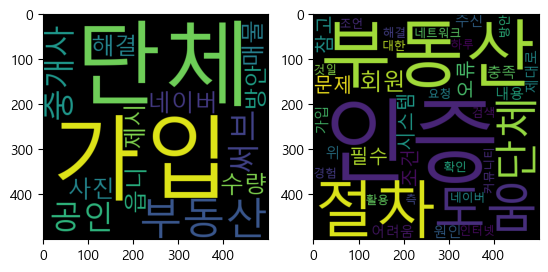

['공인', '중개사', '단체', '가입', '단체', '가입', '부동산', '써브', '네이버', '부동산', '매물', '수량', '사진', '읍니', '해결', '방안', '제시']
['주신', '내용', '부동산', '단체', '회원', '가입', '인증', '어려움', '문제', '원인', '인증', '위', '필수', '조건', '충족', '인증', '절차', '제대로', '시스템', '오류', '네트워크', '문제', '것일', '해결', '방안', '부동산', '단체', '인증', '절차', '필수', '조건', '확인', '네이버', '부동산', '측', '인증', '절차', '시스템', '오류', '대한', '도움', '요청', '인터넷', '검색', '커뮤니티', '활용', '회원', '경험', '조언', '참고', '도움', '참고', '도움', '하루']


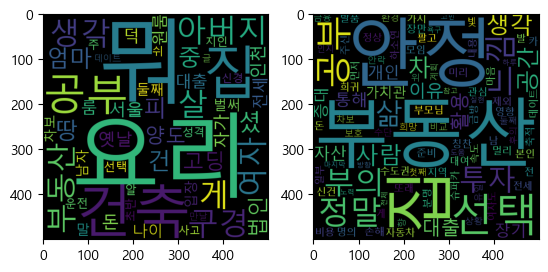

['건축', '아버지', '건축', '엄마', '요리', '셨', '피', '건', '집', '구경', '땅', '구경', '중', '고딩', '요리', '아버지', '법인', '요리', '뭐', '양도', '뭐', '요리', '건축', '부동산', '공부', '옛날', '생각', '생각', '돈', '서울', '인천', '뭐', '자가', '대출', '룸', '전세', '살', '원룸', '덕', '나이', '벌써', '살', '말', '여자', '입장', '남자', '부동산', '공부', '뭐', '둘째', '차보', '집', '선택', '게', '운전', '주', '알', '초반', '지인', '성격', '사고', '쉬', '게', '집', '공부', '신경', '데이트', '여자', '만날', '글']
['정말', '칭찬', '공간', '마음', '전세', '금방', '집', '명의', '집', '장만', '전', '자동차', '부모님', '영향', '정말', '차', '선택', '멀리', '지역', '수도권', '카', '차', '대여', '정말', '미리', '준비', '부동산', '공부', '안정', '게', '비용', '일부', '슈퍼카', '희귀', '제외', '정상', '손해', '본인', '신건', '하소연', '느낌', '생각', '가시', '빛', '부동산', '공부', '발품', '여자도', '부동산', '관심', '사람', '분명', '모임', '또래', '공부', '발', '팔고', '데이트', '생각', '안정', '느낌', '느낌', '남', '돈', '대출', '활용', '대출', '활용', '부의', '축적', '속도', '집', '먼저', '주신', '내용', '부동산', '공부', '차보', '집', '선택', '이유', '첫째', '부동산', '안정', '투자', '수단', '금융', '자산', '비교', '안정', '둘째', '안정', '안락', '위', '공간', '부동산', '투자', '통해', '장기', '부의'

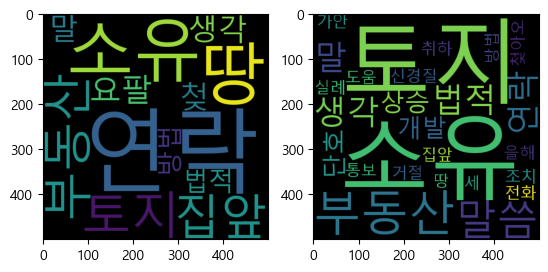

['소유', '땅', '토지', '부동산', '집앞', '요팔', '생각', '연락', '말', '첮', '연락', '법적', '방법']
['소유', '토지', '개발', '상승', '부동산', '단호', '말씀', '생각', '신경질', '말', '을해', '전화', '가안', '법적', '조치', '취하', '세', '실례', '거절', '통보', '도움', '말씀', '소유', '땅', '토지', '부동산', '집앞', '생각', '연락', '말', '첮아오', '연락', '법적', '방법']


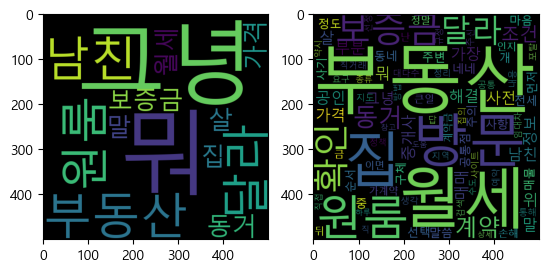

['뭐', '그녕', '부동산', '원룸', '달라', '남친', '동거', '살', '집', '월세', '보증금', '가격', '말']
['뭐', '그녕', '부동산', '원룸', '달라', '남친', '동거', '살', '집', '월세', '보증금', '가격', '말', '네네', '동네', '주변', '부동산', '공인', '중개사', '보증금', '월세', '정도', '월세', '매물', '선택', '개', '달라', '말씀', '집', '집', '중', '가장', '마음', '집', '계약', '부동산', '전세', '월세', '계약', '주의', '사항', '사기', '부동산', '계약', '공통점', '순서', '구체', '사전', '확인', '확인', '먼저', '가계약', '금', '계약금', '뒤', '큰일', '난', '인지', '해결', '부분', '이면', '정말', '해결', '손해', '대다수', '답', '공통', '부분', '정리', '매매', '직거래', '공인', '중개사', '통해', '생각', '지도', '매매', '직', '뭐', '그녕', '부동산', '원룸', '달라', '남친', '동거', '살', '집', '월세', '보증금', '가격', '말', '원룸', '위', '지역', '선정', '포탈', '사이트', '검색', '방문', '예약', '방문', '사전', '방문', '약시', '임대차', '조건', '주신', '내용', '부동산', '직접', '방문', '원룸', '확인', '가장', '방법', '보증금', '월세', '집의', '종류', '조건', '부동산', '정책', '규정', '동거', '정보', '요구', '수도', '정보', '위', '부동산', '방문', '상세', '조건', '확인', '참고', '도움', '하루']


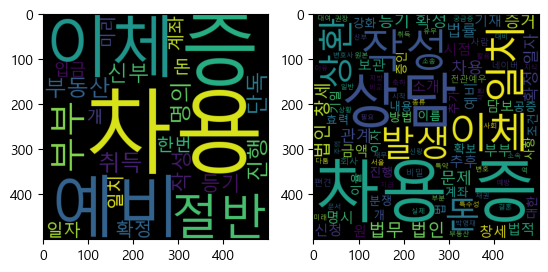

['예비', '부부', '부동산', '취득', '단독', '명의', '진행', '예비', '신부', '차용', '차용', '증', '작성', '차용', '증', '등기', '확정', '일자', '계좌', '이체', '일치', '돈', '한번', '입금', '절반', '절반', '이체', '차용', '증', '개', '미리']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '박영재', '변호사', '결혼', '시작', '축하', '부동산', '취득', '차용', '증', '작성', '대한', '궁금증', '차용', '증', '등기', '확정', '일자', '계좌', '이체', '일치', '일치', '필요', '증거', '확보', '권장', '차용', '증', '등기', '확정', '일자', '차용', '증', '효력', '발생', '시점', '추후', '소송', '증거', '활용', '등기', '확정', '일자', '시점', '실제', '돈', '이체', '시점', '일치', '법적', '문제', '이유', '일치', '증거', '강화', '계좌', '이체', '역', '차용', '증', '등기', '확정', '일자', '비교', '증거', '확보', '분쟁', '예방', '추후', '분쟁', '발생', '일치', '부분', '다툼', '발생', '돈', '이체', '차용', '증', '개', '개', '차용', '증', '차용', '증', '차용', '금액', '상환', '조건', '기재', '문서', '돈', '이체', '차용', '금액', '상환', '조건', '차용', '증', '차용', '증', '내용', '기재', '차용', '예비', '신랑', '이름', '대여', '예비', '신부', '이름', '차용', '금액', '원', '상환', '방법', '원', '원', '상환', '기일', '상환', '기일', '명시', '이자', '유무', '이율', '이자', '지급', '이율', '명시', '담보

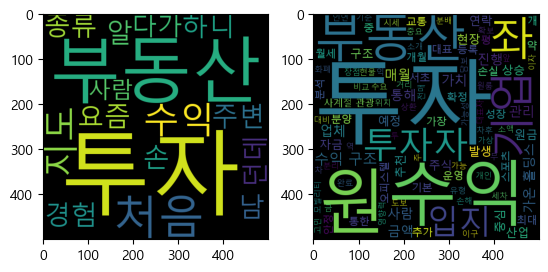

['요즘', '부동산', '투자', '부동산', '경험', '주변', '하니', '손', '남', '알', '투자', '처음', '투자', '수익', '부동산', '투자', '던데', '지도', '수익', '부동산', '종류', '처음', '다가', '투자', '지도', '투자', '투자', '사람']
['수익', '부동산', '유형', '상가', '지식', '산업', '센터', '오피스텔', '레지던스', '오피스', '유형', '수익', '부동산', '매달', '월세', '현금', '흐름', '현시', '기상', '실투', '자금', '추천', '수익', '부동산', '땐', '입지', '배후', '수요', '환금', '현장', '방문', '비교', '분석', '판단', '부분', '부동산', '안목', '부동산', '한층', '연락', '현장', '추천', '비교', '분석', '연락', '해', '수익', '부동산', '대세', '오피스텔', '가장', '인기', '장점', '소액', '투자가', '월세', '입지', '피', '투자', '목적', '돈', '남산', '센트럴시티', '오피스텔', '추천', '현장', '동대문역', '화공', '역', '을지로', '역', '충무로역', '트리플', '권', '대로', '변', '중구청', '옆', '이구', '동국대', '후문', '앞', '입지', '교통', '임차', '수요', '확정', '분양', '시세', '월세', '세차', '익', '최하', '세운', '재정', '비', '촉진', '지구', '앞', '차후', '집값', '상승', '이구', '사항', '연락', '가온', '홀딩스', '현재', '상당', '투자자', '주식', '가상', '화폐', '직접투자', '방법', '수익', '진행', '고민', '중', '투자자', '투자', '통해', '손실', '손해', '보고', '현실', '손실', '손해', '안정', '수익', '발생', '고민', '가온', '홀딩스', '세상', 

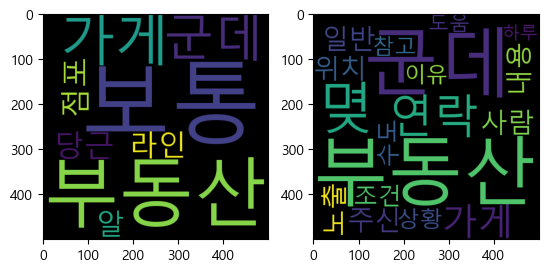

['가게', '보통', '부동산', '부동산', '보통', '군데', '당근', '점포', '라인', '알']
['부동산', '몆', '군데', '연락', '부동산', '몆', '군데', '연락', '주신', '내용', '가게', '부동산', '일반', '사람', '노출', '군데', '위치', '조건', '부동산', '가게', '수도', '상황', '이유', '군데', '참고', '도움', '하루']


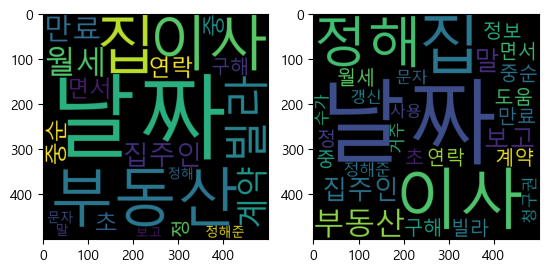

['빌라', '월세', '계약', '만료', '집주인', '부동산', '연락', '초', '중순', '중', '면서', '집', '구해', '날짜', '정', '날짜', '정해준', '날짜', '이사', '문자', '부동산', '이사', '날짜', '정해', '보고', '날짜', '집', '말']
['집주인', '이사', '날짜', '정해', '날짜', '집', '도움', '정보', '빌라', '월세', '계약', '만료', '집주인', '부동산', '연락', '초', '중순', '중', '면서', '집', '구해', '날짜', '정', '날짜', '정해준', '날짜', '이사', '문자', '부동산', '이사', '날짜', '정해', '보고', '날짜', '집', '말', '부동산', '이사', '날짜', '정해', '보고', '날짜', '집', '말', '갱신', '청구권', '사용', '거주', '수가']


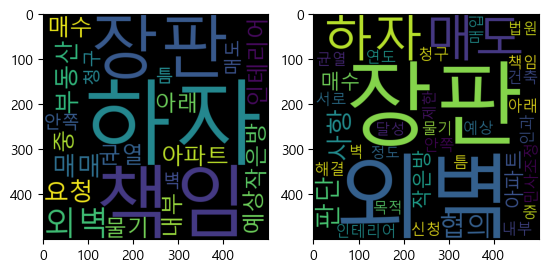

['부동산', '매매', '하자', '책임', '요청', '아파트', '매수', '작은방', '인테리어', '중', '장판', '물기', '예상', '외벽', '균열', '외벽', '내부', '장판', '아래', '안쪽', '벽', '틈', '하자', '책임', '매도', '청구']
['아파트', '매수', '작은방', '인테리어', '중', '장판', '물기', '예상', '외벽', '균열', '외벽', '내부', '장판', '아래', '안쪽', '벽', '틈', '하자', '책임', '매도', '청구', '매도', '인과', '협의', '해결', '사항', '서로', '협의', '법원', '민사조정', '신청', '판단', '건축', '연도', '하자', '매입', '목적', '달성', '제한', '정도', '판단', '사항']


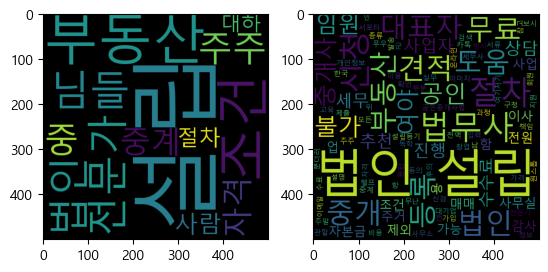

['전문가', '님들', '부동산', '법인', '설립', '설립', '조건', '주주', '중', '부동산', '중계', '자격', '사람', '설립', '조건', '절차', '대하']
['부동산', '중개', '법인', '설립', '조건', '자본금', '중개', '사업', '가능', '부동산', '매매', '업', '불가', '대표자', '공인', '중개사', '여야', '대표자', '제외', '임원', '이사', '감사', '공인', '중개사', '여야', '함', '주거', '용', '사무실', '사업자', '등록', '불가', '대표자', '임원', '전원', '공인중개사법', '항', '실무', '교육', '수료', '절차', '법인', '설립등기', '관할', '군', '구청', '중개', '사무소', '등록', '사업자', '등록', '법인', '설립', '절차', '참고', '법인', '설립', '절차', '창업', '서포터', '푸우', '주말', '번시', '법인', '종류', '주주', '부동산', '중계', '자격', '법인', '설립', '법무사', '비용', '전액', '지원', '도움', '추천', '법인', '설립', '뿐더러', '신경', '부분', '법인', '설립', '법무사', '수수료', '무료', '진행', '법인', '설립', '모든', '과정', '원스톱', '후의', '세무', '책임', '전문가', '무료', '상담', '보시', '도움', '한국', '세무', '원단', '남', '개인정보', '이용', '동의', '법인', '설립', '법인', '설립', '인', '대기업', '법인', '설립', '세무사', '추천', '독학', '법무사', '설명', '법무사', '수수료', '무료', '위', '이미지', '상담', '전', '법인', '설립', '여기저기', '검색', '헬프', '법인', '설립', '법인', '설립', '온라인', '진행', '무난', '신청', '회원', '가입', '법인', '설

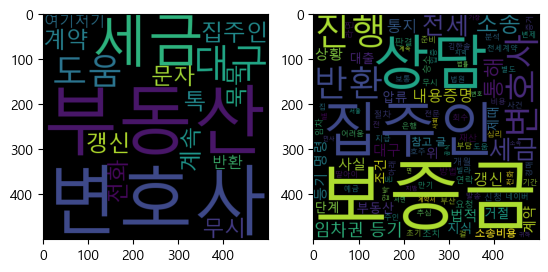

['대구', '부동산', '변호사', '도움', '부동산', '변호사', '집주인', '세금', '계약', '갱신', '계속', '톡', '문자', '전화', '무시', '묵묵', '부동산', '변호사', '여기저기', '부동산', '변호사', '세금', '반환']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '김한솔', '변호사', '집주인', '연락', '무시', '상황', '라면', '조치', '대구', '지역', '부동산', '전문', '변호사', '상담', '가장', '변호사', '귀하', '상황', '분석', '세금', '반환', '위', '법적', '절차', '집주인', '세금', '반환', '요청', '서면', '통지', '방법', '내용증명', '통해', '공식', '요청', '집주인', '계속', '무시', '면', '민사', '소송', '통해', '세금', '반환', '요청', '변호사', '도움', '계약서', '세금', '지급', '역', '연락', '기록', '정리', '증거', '확보', '세금', '반환', '법적', '보호', '권리', '절차', '통해', '해결', '변호사', '상담', '구체', '계획', '사건', '데이터', '바탕', '의뢰인', '사안', '분석', '상담', '진행', '분야', '별', '전문', '변호사', '상황', '상담', '진행', '전국', '상담', '가능', '하단', '통해', '상담', '도움', '유선', '상담', '진행', '김한솔', '변호사', '네이버', '지식', '지식', '전문가', '네이버', '지식', '상담', '변호사', '다희', '보증금', '위', '전세계약', '문제', '해지', '사실', '입증', '위', '아래', '조건', '보증금', '지급', '사실', '계약', '갱신', '거절', '사실', '만기', '개월', '전', '만기', '불구', '보증금', '사실', '조건', '실

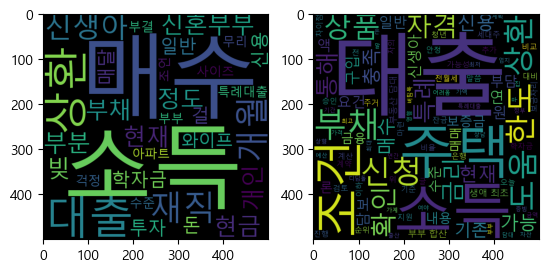

['재직', '개월', '신생아', '신혼부부', '현재', '현금', '정도', '개인', '빚', '소득', '소득', '부분', '부채', '학자금', '일반', '신용', '대출', '상환', '투자', '매달', '돈', '걸', '상환', '소득', '와이프', '특례대출', '사이즈', '아파트', '매수', '대출', '부결', '걱정', '매수', '매수', '부부', '무리', '수준', '조언']
['신생아', '특례대출', '통해', '주택', '담보', '대출', '계획', '신생아', '특례', '대출', '조건', '지원', '자격', '대출', '신청', '기준', '출산', '무', '주택', '세대주', '주택', '세대주', '부부', '합산', '연', '소득', '원', '이하', '자산', '가액', '원', '이하', '대출', '한도', '금리', '최대', '원', '생애', '최초', '주택', '구입', '자의', '상향', '대출', '금리', '최저', '연', '최고', '연', '가능', '부동산', '담대', '조건', '소득', '부채', '주택', '담보', '대출', '위', '안정', '소득', '증빙', '현재', '부부', '합산', '소득', '소득', '요건', '충족', '부채', '학자금', '일반', '신용', '대출', '영향', '은', '연간', '소득', '대비', '부채', '상환', '액', '비율', '말', '일반', '여야', '주택', '가격', '대비', '대출', '가능', '금액', '비율', '생애', '최초', '주택', '구입', '자의', '매수', '가능성', '부담', '수준', '매수', '가능성', '신생아', '특례', '대출', '조건', '충족', '소득', '요건', '대출', '승인', '기존', '부채', '기준', '충족', '확인', '은행', '상담', '계산', '부담', '수준', '매수', '상환', '액', '계산', '대출

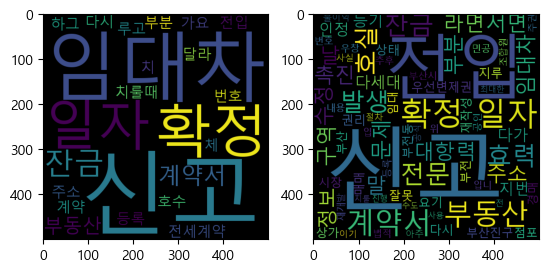

['전세계약', '임대차', '신고', '확정', '일자', '전입', '신고', '잔금', '치', '루고', '계약', '하그', '계약서', '주소', '호수', '부동산', '등록', '번호', '달라', '부동산', '계약서', '부분', '잔금', '치룰때', '다시', '체', '임대차', '신고', '확정', '일자', '가요']
['인정', '전입', '신고', '부동산', '주소', '다가', '라면', '지번', '다세대', '호실', '등기', '라면', '호실', '전입', '신고', '날', '대항력', '발생', '대항력', '발생', '확정', '일자', '효력', '우선변제권', '전입', '신고', '확정', '일자', '효력', '상태', '전입', '신고', '날', '권리', '발생', '부동산', '호실', '잘못', '다시', '재작성', '잔금', '지루', '전입', '신고', '확정', '일자', '요기', '부산진구', '부전동', '서면', '부전', '시장', '상가', '점포', '임대', '매매', '전문', '부산', '서면', '경매', '전문', '부산시', '민공', '촉진', '구역', '촉진', '구역', '재개발', '조합원', '입', '주권', '전문', '우창', '공인', '입니', '임대차', '신고', '확정', '일자', '위', '계약서', '내용', '계약서', '주소', '부동산', '등록', '번호', '문제', '임대차', '신고', '확정', '일자', '법적', '효력', '정보', '신고', '추후', '불이익', '부동산', '말', '사실', '아주', '말', '공식', '절차', '이기', '최대한', '정보', '사용', '계약서', '부분', '잔금', '치룰', '수정', '계약서', '부분', '잔금', '수정', '전', '신고', '진행', '문제', '수도']


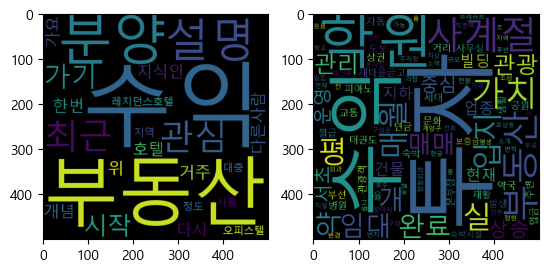

['최근', '수익', '부동산', '관심', '가기', '시작', '지식인', '수익', '부동산', '설명', '다시', '한번', '설명', '수익', '부동산', '분양', '다른사람', '호텔', '개념', '가요', '수익', '부동산', '분양', '거주', '위', '레지던스호텔', '사용', '지역', '오피스텔', '수익', '부동산', '분양', '대충', '정도']
['인천', '계양구', '효성동', '번지', '로얄', '빌딩', '소개', '면적', '평', '규모', '지하', '지상', '건물', '현재', '실', '칸', '실', '걱정', '빌딩', '업종', '구성은', '지하', '주차장', '새마을금고', '약국', '분식점', '뚜레쥬르', '전체', '재활', '정형외과', '태권도', '학원', '부공', '실', '병원', '임대', '새마을금고', '문화', '타', '피아노', '학원', '사무실', '구성', '전형', '병원', '학원', '건물', '경쟁', '항아리', '상권', '작전역', '도보', '거리', '반경', '약', '세대', '재건축', '세대', '초', '중', '개', '학교', '밀집', '지역', '현재', '임대', '완료', '호수', '현금', '투자', '수익', '율', '약', '프로', '후반', '수익', '율', '임대', '완료', '읍니', '매매', '가능', '업종', '약국', '재활', '정현', '외과', '태권도', '학원', '사무실', '피아노', '학원', '가격', '전화', '매매', '조성', '본부장', '사계절', '관광', '숙박', '지젤', '움', '소액', '투자', '수익', '발생', '관리', '평생', '월급', '연금', '매월', '자동', '입금', '부동산', '가치', '상승', '입지', '투자', '매월', '수익', '교통', '생활', '문화', '예술', '중심', '초교', '남부', '터미널',

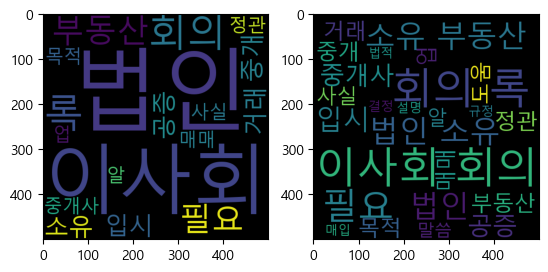

['법인', '소유', '부동산', '입시', '법인', '이사회', '회의', '록', '이사회', '회의', '록', '공증', '필요', '거래', '중개', '중개사', '법인', '정관', '목적', '부동산', '매매', '업', '이사회', '회의', '록', '필요', '사실', '알']
['법인', '소유', '부동산', '입시', '이사회', '회의', '록', '필요', '중개사', '설명', '법적', '규정', '결정', '도움', '말씀', '법인', '소유', '부동산', '입시', '법인', '이사회', '회의', '록', '이사회', '회의', '록', '공증', '필요', '거래', '중개', '중개사', '법인', '정관', '목적', '부동산', '매매', '업', '이사회', '회의', '록', '필요', '사실', '알', '법인', '소유', '부동산', '입시', '이사회', '회의', '록', '필요', '공증', '도움', '법인', '소유', '부동산', '입시', '법인', '이사회', '회의', '록', '이사회', '회의', '록', '공증', '필요', '거래', '중개', '중개사', '법인', '정관', '목적', '부동산', '매매', '업', '이사회', '회의', '록', '필요', '사실', '알', '법인', '소유', '부동산', '매입', '이사회', '회의', '록', '필요', '도움', '말씀', '법인', '소유', '부동산', '입시', '법인', '이사회', '회의', '록', '이사회', '회의', '록', '공증', '필요', '거래', '중개', '중개사', '법인', '정관', '목적', '부동산', '매매', '업', '이사회', '회의', '록', '필요', '사실', '알']


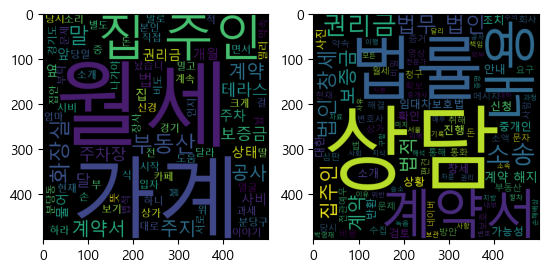

['경기도', '분당구', '분당동', '상가', '보증금', '부', '과세', '별도', '월세', '계약', '카페', '위', '계약서', '당일', '부동산', '집', '주인', '주차', '집', '옆', '주차장', '주차', '말', '가계', '앞', '테라스', '손', '가계', '공사', '중', '권리금', '말', '집안', '화장실', '가계', '시비', '화장실', '사비', '가계', '화장실', '공사', '하라', '화장실', '가계', '부동산', '화장실', '사비', '집', '주인', '직접', '크게', '신경', '말', '공사', '가계', '장사', '시작', '집', '주인', '집', '옆', '주차장', '가계', '앞', '테라스', '월세', '달', '집', '주인', '계약서', '계약서', '당시', '말로', '계약', '불', '식', '계약', '주차장', '테라스', '주지', '달', '말', '집', '주인', '뜻', '대로', '계속', '밀고', '걸', '소리', '서로', '얼굴', '보기', '집', '주인', '가계', '하니', '집', '주인', '월세', '물어', '보증금', '보증금', '월세', '이야기', '가계', '부동산', '놨', '집', '주인', '부동산', '놨습니', '문제', '경기', '가계', '현재', '전', '집', '주인', '딸', '말', '월세', '달라', '면서', '월세', '주지', '법', '적', '엄마', '월세', '법적', '부동산', '법', '가계', '소개', '부동산', '물어', '월세', '개월', '밀리', '법', '입자', '권리금', '화장실', '공사', '비도', '나가야', '말', '인지', '본인', '계약', '약속', '월세', '계약서', '월세', '가계', '월세', '주지', '개월', '월세', '주지', '상태', '상태', '달', '돈', '월세', '도움', '부탁'

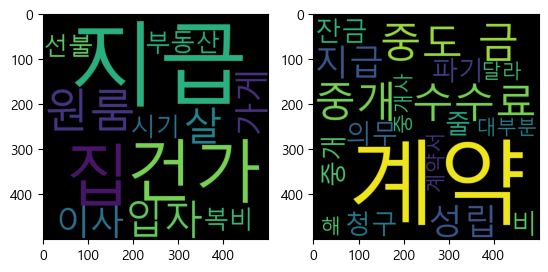

['원룸', '입자', '살', '이사', '가게', '집', '부동산', '복비', '지급', '지급', '시기', '집', '지급', '건가', '선불', '지급', '건가']
['중개', '수수료', '중개', '비', '계약', '성립', '청구', '계약', '성립', '중도', '금', '계약', '중도', '금', '지급', '중도', '금', '계약', '잔금', '지급', '중개', '수수료', '계약', '파기', '줄', '의무', '대부분', '중개사', '계약서', '중개', '수수료', '달라', '해', '중개', '수수료', '중개', '비', '계약', '성립', '청구', '계약', '성립', '중도', '금', '계약', '중도', '금', '지급', '중도', '금', '계약', '잔금', '지급', '중개', '수수료', '계약', '파기', '줄', '의무', '대부분', '중개사', '계약서', '중개', '수수료', '달라', '해']


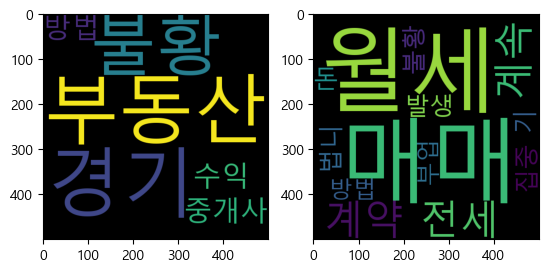

['부동산', '경기', '불황', '중개사', '수익', '방법']
['매매', '월세', '전세', '계약', '계속', '발생', '집중', '돈', '법니', '불황', '기', '방법', '부업']


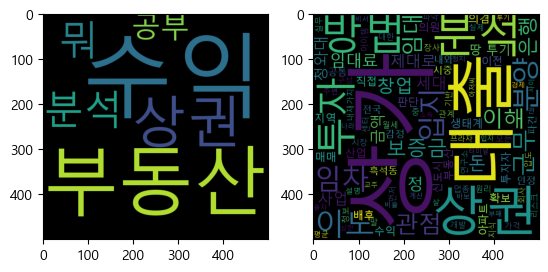

['수익', '부동산', '상권', '분석', '뭐', '공부']
['상가', '투자', '상권', '분석', '창업', '시장', '원리', '이해', '창업', '임차', '업종', '아이템', '상가', '상권', '입지', '판단', '장사', '돈', '벌', '월세', '공실이', '발생', '리스크', '창업', '시장', '임차', '대한', '이해', '필수', '생태계', '이해', '중요성', '상담사', '말', '분양', '신규', '분양', '현장', '현재', '임대료', '매매', '가격', '정', '기존', '상가', '상가', '투자', '먼저', '속', '생태계', '구성', '요소', '관계', '제대로', '이해해', '래야', '분양', '매수', '금액', '임대료', '판단', '투자자', '관점', '상가', '공급', '행사', '개발', '주체', '상가', '장사', '창업', '임차', '관점', '이해', '투자자', '차별', '경쟁력', '제대로', '상가', '투자', '먼저', '생태계', '구성', '관계', '특성', '이해', '상권', '분석', '입지', '분석', '제대로', '법', '상가', '내재가치', '판단', '상권', '분석', '입지', '분석', '임차', '관점', '사업', '타당성', '분석', '상가', '가치', '파악', '상권', '분석', '입지', '조건', '분석', '입지', '업종', '아이템', '임차', '관점', '임대료', '일지', '투자자', '관점', '임차', '입장', '생각', '관점', '변화', '임대료', '분양', '가격', '게', '핵심', '상권', '입지', '분석', '기반', '제대로', '내재가치', '파악', '상가', '투자', '대한', '정보', '지식', '산업', '센터', '연구소', '빌딩', '랩', '지식', '산업', '센터', '연구소', '분양', '매매', '임대', '관리', '세금',

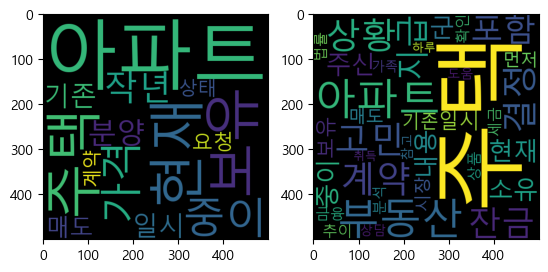

['현재', '아파트', '보유', '중이', '가격', '작년', '아파트', '분양', '현재', '일시', '주택', '보유', '기존', '아파트', '매도', '요청', '상태', '아파트', '계약', '주택']
['주신', '내용', '현재', '상황', '부동산', '소유', '고민', '중이', '군', '고민', '일시', '주택', '보유', '상황', '기존', '아파트', '매도', '아파트', '계약', '주택', '먼저', '부동산', '시장', '추이', '분석', '세금', '부동산', '법률', '확인', '금융', '상품', '결정', '가족', '상담', '결정', '참고', '도움', '하루', '아파트', '취득', '잔금', '지급', '계약', '주택', '포함', '잔금', '지급', '주택', '포함']


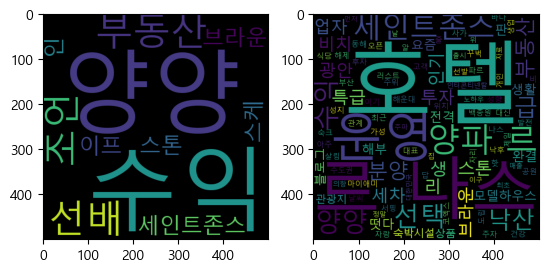

['양양', '수익', '부동산', '선배', '조언', '세인트존스', '브라운', '스톤', '인', '스케', '이프']
['최근', '낙산', '도립', '공원', '해제', '핫', '양양', '생', '숙크', '러스트', '낙산', '비치', '자리', '선발', '주자', '분양', '주위', '세차', '부산', '바다', '동해', '서핑', '성지', '수도권', '아주', '인기', '낙산', '광안', '리', '낙후', '해운대', '광안', '리', '마이애미', '발전', '날씨', '건강', '꾸벅', '세인트존스', '브라운', '스톤', '양파', '르', '나스', '투자', '수익', '호텔', '고객', '성향', '선택', '가성', '비', '호텔', '선택', '급', '특급', '호텔', '선택', '세인트존스', '급', '알', '개인', '세인트존스', '브라운', '스톤', '양파', '르', '나스', '선택', '양파', '르', '나스', '이기', '자랑', '수익', '호텔', '운영', '사가', '제일', '운영', '업자', '관계', '식당', '오픈', '생업', '대신', '줄', '업자', '집', '살림', '백종원', '대표', '답', '후자', '양파', '르', '나스', '운영', '파르', '나스', '코엑스', '위치', '인터콘티넨탈', '호텔', '주파', '르', '나스', '운영', '급', '특급', '호텔', '노하우', '대한민국', '매출', '위', '호텔', '이구', '양파', '르', '나스', '선택', '양파', '르', '나스', '모델하우스', '전격', '해부', '완결', '판', '떳다', '양파', '르', '나스', '모델하우스', '전격', '해부', '완결', '판', '떳다', '날', '정말', '요즘', '세인트존스', '양양', '먼저', '의향', '출시', '자료', '세인트존스', '양양', '양양', '최초', '급'

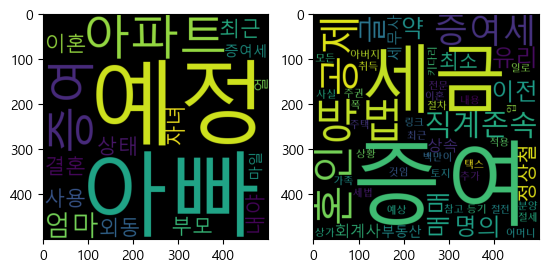

['부모', '자녀', '아파트', '증여', '예정', '최근', '결혼', '아빠', '증여', '엄마', '아빠', '이혼', '상태', '엄마', '예정', '아빠', '아파트', '사용', '예정', '외동', '내야', '증여세', '얼', '마일']
['직계존속', '최근', '증여', '사실', '혼인', '아버지', '증여', '직계존속', '공제', '혼인', '공제', '증여세', '이혼', '어머니', '증여', '직계존속', '공제', '증여세', '혼인', '일로', '혼인', '공제', '추가', '것임', '증여세', '백만이', '증여세', '약', '취득', '약', '예상', '세금', '상황', '방법', '적용', '세금', '폭', '세금', '방법', '절', '세법', '내용', '링크', '참고', '명의', '이전', '증여', '매매', '유리', '세금', '최소', '방법', '키다리', '택스', '증여', '매매', '유리', '세금', '최소', '명의', '이전', '방법', '글', '정상철', '회계사', '세무사', '상속', '부동산', '증여', '전', '증여', '모든', '절차', '등기', '절세', '방법', '글', '정상철', '회계사', '세무사', '상속', '증여', '전문', '글', '상가', '주택', '토지', '분양', '입', '주권', '부동산', '가족']


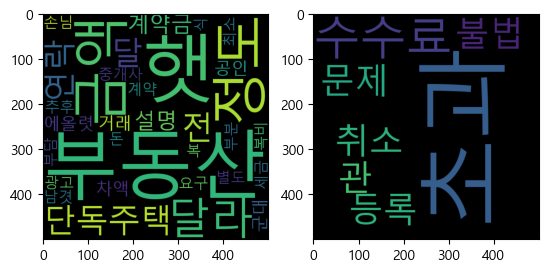

['단독주택', '부동산', '정도', '전', '정도', '햇', '달', '부동산', '연락', '계약금', '설명', '에올렷', '금액', '거래', '햇', '부동산', '차액', '군대', '공인', '중개사', '광고', '햇', '손님', '계약', '부동산', '복비', '돈', '달라', '요구', '최소', '금액', '남겻', '복', '별도', '추후', '달라', '식', '햇', '세금', '부분', '부담']
['초과', '수수료', '관', '문제', '초과', '수수료', '등록', '취소', '불법']


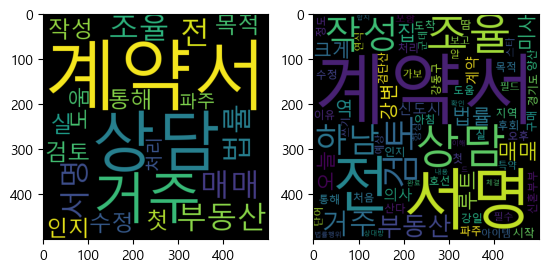

['실', '거주', '목적', '부동산', '매매', '계약서', '작성', '전', '법률', '상담', '계약서', '검토', '서명', '전', '계약서', '상담', '계약서', '수정', '조율', '서명', '법률', '상담', '통해', '조율', '첫', '부동산', '매매', '인지', '도움', '거주', '파주', '처리']
['실', '거주', '목적', '부동산', '매매', '계약서', '작성', '전', '법률', '상담', '계약서', '검토', '서명', '전', '계약서', '상담', '계약서', '수정', '조율', '서명', '법률', '상담', '통해', '조율', '첫', '부동산', '매매', '인지', '도움', '거주', '파주', '처리', '계약서', '검토', '서명', '전', '서명', '집', '신혼부부', '처음', '집', '구매', '후회', '이유', '산다', '오늘', '경기도', '하남', '지역', '루트', '크게', '호선', '하남', '검단산', '역', '시작', '강동구', '강일', '역', '도착', '아침', '오후', '정도', '땀', '양산', '아이템', '필수', '하남', '가보', '알', '단어', '크게', '미사', '강변', '신도시', '스타', '필드', '오늘', '군데', '루트', '포함', '보고', '예상', '미사', '강변', '신도시', '연식', '계약서', '서명', '조율', '계약서', '쓰기', '전', '검토', '특약', '조율', '작성', '항상', '법률행위', '계약서', '작성', '서명', '드', '전', '상담', '완료', '계약', '내용', '이해', '계약', '상대방', '의사', '의사', '합치', '확인', '체결']


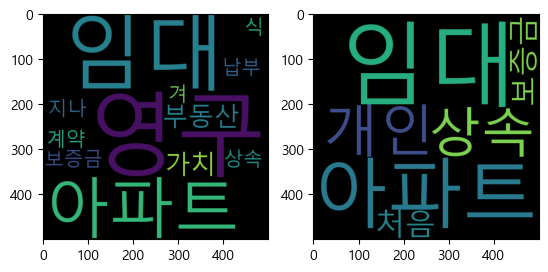

['영구', '임대', '아파트', '상속', '영구', '임대', '아파트', '부동산', '가치', '식', '계약', '납부', '보증금', '부동산', '가치', '겨', '지나']
['임대', '아파트', '개인', '상속', '처음', '보증금']


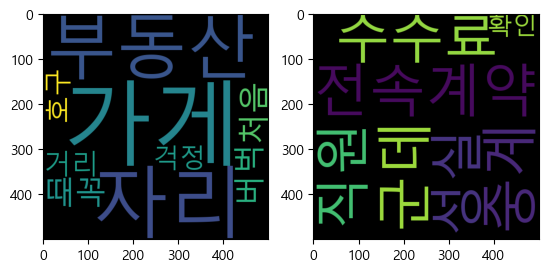

['가게', '자리', '부동산', '때꼭', '처음', '버벅', '거리', '호구', '걱정']
['전속계약', '군데', '중계', '수수료', '직원', '성실', '확인']


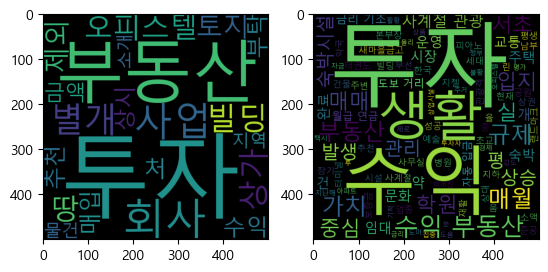

['회사', '사업', '별개', '부동산', '투자', '빌딩', '상가', '오피스텔', '투자', '땅', '토지', '제외', '수익', '부동산', '투자', '처', '상시', '투자', '매입', '추천', '부탁', '금액', '지역', '물건', '소개']
['수익', '부동산', '도움', '정부', '규제', '택시', '집중', '제로', '금리', '기조', '장기', '투', '자금', '규제', '상대', '수익', '부동산', '몰리', '지난해', '이어진', '강도', '주택', '규제', '경제', '불황', '금리', '기조', '기적', '투자자', '수익', '부동산', '눈', '평가', '중', '아파트', '오피스텔', '생활', '숙박시설', '주거', '상품', '규제', '도마', '상업시설', '린', '생활', '시설', '상대', '활황', '누리', '주택', '시장', '규제', '유동성', '장세', '금리', '장기', '화로', '수익', '부동산', '관심', '코로나', '팬데믹', '상황', '수익', '부동산', '거래', '상업', '용지', '매매', '증가', '양적', '완화', '금리', '기조', '지속', '주택', '시장', '규제', '강화', '수익', '부동산', '시장', '투자', '용', '수익', '부동산', '건', '추천', '린', '생활', '시설', '건', '호텔', '매매', '건', '아래', '정보', '성공', '투자', '인천', '계양구', '효성동', '번지', '로얄', '빌딩', '소개', '면적', '평', '규모', '지하', '지상', '건물', '현재', '실', '칸', '실', '걱정', '빌딩', '업종', '구성은', '지하', '주차장', '새마을금고', '약국', '분식점', '뚜레쥬르', '전체', '재활', '정형외과', '태권도', '학원', '부공', '실', '병원', '임대', '새마을금고', '문화', '타

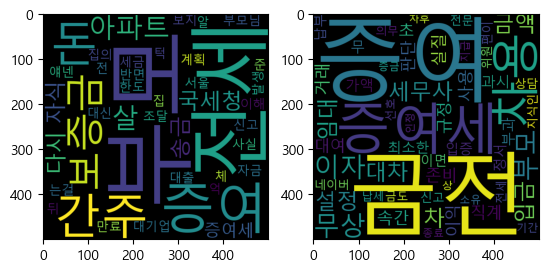

['부모님', '전세', '보증금', '증여', '간주', '서울', '아파트', '살', '자금', '조달', '계획', '보지', '얘넨', '억', '집', '턱', '대기업', '대출', '증여', '국세청', '체', '는걸', '알', '반면', '전세', '사실', '살', '집의', '보증금', '부모', '대신', '준', '전세', '만료', '돈', '부모', '다시', '증여', '간주', '이해', '전세', '아파트', '전', '부모', '돈', '자식', '돈', '뒤', '자식', '세금', '다시', '부모', '송금', '증여세', '발생', '부모', '송금', '국세청', '신고', '증여세', '한도', '증여', '간주']
['세무사', '직계', '존비', '속간', '금전', '대차', '거래', '실질', '차용', '증여', '판단', '금전', '무상', '사용', '이익', '증여', '규정', '금전', '대여', '초', '과시', '무', '이자', '증여세', '부과', '금전', '대차', '가액', '최소한', '이자', '설정', '증여세', '금액', '설정', '차', '입금', '입증', '차', '입금', '정서', '이면', '이자', '납부', '증여세', '신고', '편이', '네이버', '지식인', '전문', '상담', '위원', '선호', '세무사', '전세', '금도', '부모', '무상', '증여', '증여세', '납세', '의무', '임대', '기간', '종료', '임대', '증금', '소유', '부모', '차용', '지급', '무상', '증여', '차후', '금액', '부모', '상', '차용', '인정']


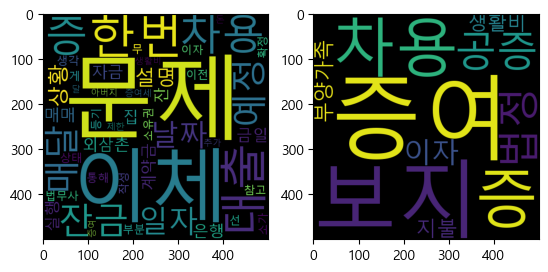

['상황', '설명', '외삼촌', '집', '매매', '계약금', '이체', '한번', '이체', '잔', '금일', '대출', '실행', '대출', '자금', '은행', '법무사', '통해', '문제', '대출', '생각', '잔금', '부분', '선', '차용', '증', '무', '이자', '매달', '참고', '소유권', '이전', '상태', '차용', '증', '문제', '게', '매달', '이체', '예정', '차용', '증', '잔금', '일자', '날짜', '작성', '날짜', '등기', '소가', '확정', '일자', '문제', '증여세', '아버지', '생활비', '달', '돈', '한번', '한번', '제한', '증여', '추가', '예정', '문제']
['차용', '증', '공증', '법정', '이자', '지불', '증여', '보지', '부양가족', '생활비', '증여', '보지']


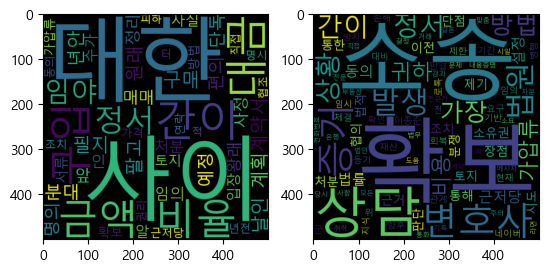

['간이', '정서', '임야', '필지', '구매', '간이', '계약서', '날인', '구입', '대금', '비율', '원래', '계획', '년안', '팔고', '분대', '예정', '편의', '구입', '대금', '비율', '단독', '명의', '매매', '사이', '사정', '왕래', '사이', '앞', '정리', '임의', '처분', '인', '사실', '알', '수가', '입장', '토지', '대한', '서류', '확보', '방법', '금액', '대한', '가압류', '근저당', '사이', '가격', '터', '금액', '대한', '권리', '명시', '조치', '동의', '년전', '적', '협조', '직접', '연락', '피하']
['로톡', '네이버', '지식', '상담', '변호사', '이종준', '전', '체결', '간이', '정서', '기반', '토지', '확보', '상황', '군', '현재', '상황', '가장', '법적', '증거', '확보', '분쟁', '발생', '대비', '확보', '위', '방법', '소송', '통한', '확인', '소유권', '이전', '가장', '방법', '법원', '소송', '제기', '간이', '정서', '근거', '귀하', '소유권', '이전', '등기', '요구', '장점', '법원', '판결', '통해', '확보', '향후', '분쟁', '발생', '법적', '근거', '단점', '소송', '기간', '소송', '비용', '발생', '가압류', '근저당', '설정', '임시', '조치', '소송', '병행', '임의', '토지', '처분', '가압류', '근저당', '설정', '장점', '재산', '처분', '제한', '손해', '방지', '단점', '동의', '가압류', '근저당', '설정', '비용', '발생', '동의', '법원', '판단', '소송', '제기', '동의', '법원', '판단', '귀하', '협의', '시도', '관계', '회복', '변호사', '통해', '내용증명', '협의',

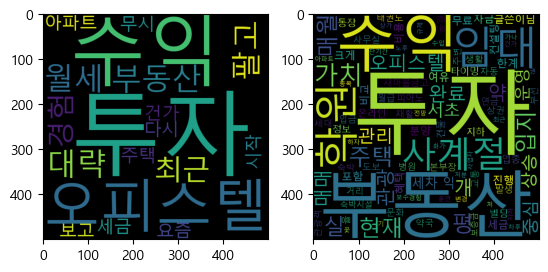

['수익', '부동산', '투자', '대략', '오피스텔', '월세', '팔고', '투자', '최근', '경험', '아파트', '오피스텔', '주택', '건가', '세금', '무시', '요즘', '보고', '수익', '투자', '다시', '시작']
['분양', '꽃', '윤언', '아파트', '오피스텔', '주택', '건가', '주택', '현재', '오피스텔', '노후', '화가', '진행', '하자', '보수', '비용', '처분', '권', '여유', '자금', '오피스텔', '주택', '포함', '비교', '부동산', '규제', '상가', '투자', '단기간', '세차', '익', '투자', '처', '최근', '경험', '기', '한계', '크게', '주택', '포함', '세금', '변경', '임대', '사업자', '세금', '혜택', '수익', '부동산', '투자', '종목', '분양', '가나', '차후', '전망', '비교', '세차', '익', '임대', '수입', '글쓴이님', '여유', '자금', '자하', '투자', '목적', '투자', '컨설팅', '크게', '현재', '수도권', '수익', '부동산', '투자', '컨설팅', '무료', '진행', '온라인', '한계', '수익', '부동산', '투자', '정보', '상단', '네임카드', '통해', '부동산', '투자', '타이밍', '정보', '글쓴이님', '통장', '잔고', '마련', '인천', '계양구', '효성동', '번지', '로얄', '빌딩', '소개', '면적', '평', '규모', '지하', '지상', '건물', '현재', '실', '칸', '실', '걱정', '빌딩', '업종', '구성은', '지하', '주차장', '새마을금고', '약국', '분식점', '뚜레쥬르', '전체', '재활', '정형외과', '태권도', '학원', '부공', '실', '병원', '임대', '새마을금고', '문화', '타', '피아노', '학원', '사무실', '구성', '전형', '병원', '

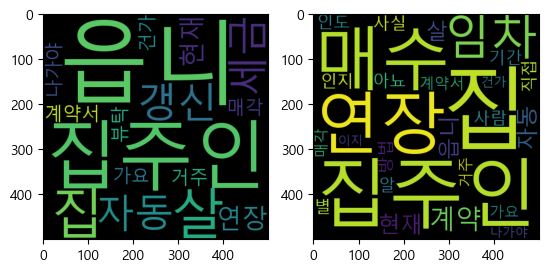

['세금', '갱신', '읍니', '집주인', '자동', '연장', '현재', '살', '읍니', '계약서', '살', '읍니', '집주인', '집', '매각', '거주', '가요', '집', '나가야', '건가', '뷰탁']
['아뇨', '집주인', '임차', '계약', '집', '매수', '인도', '현재', '집', '임차', '사실', '인지', '계약', '기간', '알', '매수', '매수', '사람', '직접', '별', '방법', '집주인', '자동', '연장', '현재', '살', '읍니', '계약서', '살', '읍니', '집주인', '집', '매각', '거주', '가요', '집', '나가야', '건가', '자동', '연장', '연장', '이지']


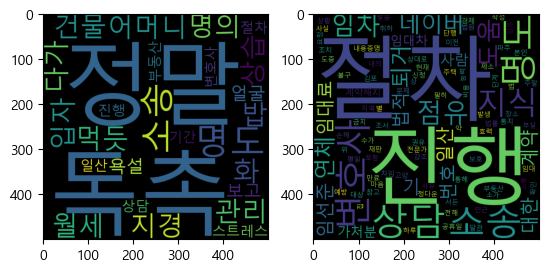

['입자', '정말', '지경', '어머니', '명의', '건물', '관리', '밥', '먹듯', '월세', '정말', '상습', '다가', '독촉', '독촉', '화', '욕설', '얼굴', '보고', '스트레스', '명도', '소송', '진행', '명도', '소송', '절차', '기간', '상담', '일산', '부동산', '변호사']
['네이버', '지식', '상담', '변호사', '임선준', '명도', '소송', '상담', '진행', '단계', '별', '법적', '절차', '법률', '상담', '번호', '확인', '본인', '경제', '능력', '대한', '부실', '사유', '임대료', '연체', '계약', '만료', '불구', '장소', '점유', '임차', '상대로', '명도', '소송', '절차', '진행', '수가', '퇴거', '조치', '취하', '기', '위', '일산', '부동산', '변호사', '도움', '권유', '내용증명', '발송', '참고', '점유', '사람', '재판', '진행', '도중', '사람', '사실', '전해', '소가', '효력', '점유', '대상', '법적', '절차', '진행', '상황', '예방', '점유', '이전', '금지', '가처분', '신청', '강조', '절차', '서든', '통해', '현재', '문제', '대한', '도움', '요청', '도움', '내의', '번호', '상담', '일산', '고양', '지역', '포함', '김포', '양주', '파주', '인근', '평일', '주말', '공휴일', '소통', '마음', '임선준', '변호사', '네이버', '지식', '지식', '전문가', '명도', '소송', '하루', '진행', '임대차', '계약', '제소', '조서', '필히', '작성', '비용', '약', '발생', '임대료', '연체', '법원', '집', '달관', '네이버', '지식', '상담', '변호사', '정다운', '주택', '임대차', '보호', '법', '상', '기'

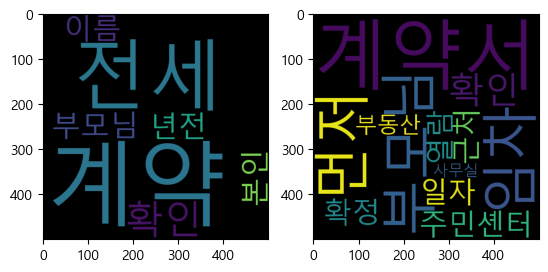

['년전', '전세', '계약', '부모님', '본인', '이름', '계약', '전세', '계약', '확인', '확인']
['부모님', '계약서', '임차', '먼저', '계약서', '확인', '주민셴터', '확정', '일자', '열람', '근처', '부동산', '사무실']


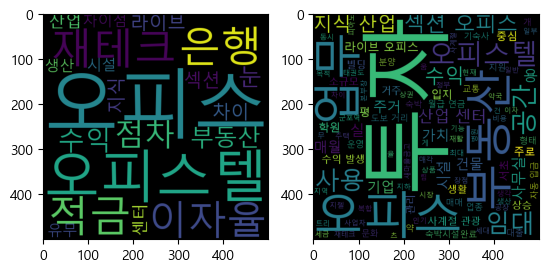

['재테크', '은행', '적금', '이자율', '점차', '수익', '부동산', '눈', '오피스', '오피스텔', '라이브', '오피스', '섹션', '오피스', '차이', '오피스텔', '지식', '산업', '센터', '차이점', '생산', '시설', '유무']
['오피스', '일반', '사무실', '용도', '사용', '부동산', '대형', '오피스', '공간', '세분', '섹션', '오피스', '소형', '오피스', '분양', '시장', '등장', '오피스텔', '주거', '업무', '겸', '부동산', '주로', '주거', '용', '사용', '일부', '업무', '용', '사용', '기도', '라이브', '오피스', '섹션', '오피스', '오피스텔', '기능', '추가', '상품', '주거', '업무', '동시', '공간', '섹션', '오피스', '공간', '분양', '오피스', '일반', '빌딩', '통째', '매각', '섹션', '오피스', '별로', '공간', '매각', '초기', '투자', '비용', '오피스', '빌딩', '달리', '투자', '진입', '장벽', '게', '최대', '강점', '지식', '산업', '센터', '오피스텔', '차이점', '지식', '산업', '센터', '생산', '시설', '업무', '시설', '복합', '건물', '주로', '중소기업', '벤처기업', '정부', '지원', '오피스텔', '주로', '주거', '용', '사용', '부동산', '생산', '시설', '주로', '개인', '소규모', '기업', '부동산', '특성', '장단점', '재테크', '방법', '선택', '부동산', '시장', '변화', '전망', '파악', '적극', '대처', '군포역', '트리', '츠', '지식', '산업', '센터', '팀', '오피스텔', '원래', '업무', '용', '시설', '거주', '목적', '사용', '주택', '임대', '사업자', '사용', '업무', '용', '사용', '임대', '사업자'

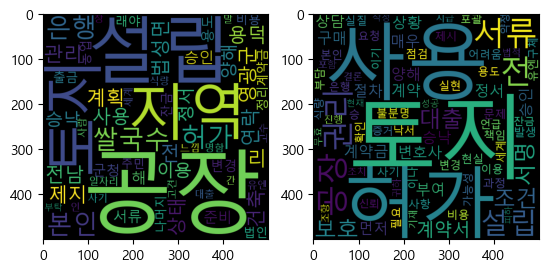

['전남', '영광군', '법성면', '용덕', '리', '제지', '계획', '관리', '지역', '토지', '상태', '전', '공장', '건축', '연락', '쌀국수', '공장', '설립', '토지', '사용', '승낙', '이용', '양해', '정서', '승인', '해', '서류', '본인', '준비', '군청', '공장', '설립', '허가', '용도', '변경', '본인', '비용', '래야', '은행', '출금', '계약금', '나머지', '잔금', '정리', '공장', '허가', '농업', '법인', '설립', '쌀국수', '공장', '지역', '주민', '일자리', '창', '유엔', '식량', '말', '세계', '은행', '대출', '사기', '인', '느낌', '사람', '간', '명함', '고수', '고견', '부탁']
['상황', '구매', '토지', '사용', '승', '낙서', '이용', '양해', '정서', '요청', '서류', '먼저', '승인', '토지', '실질', '사용', '권리', '부여', '이기', '문제', '발생', '토지', '어려움', '공장', '설립', '허가', '용도', '변경', '매우', '절차', '과정', '본인', '비용', '부담', '허가', '책임', '불분명', '사항', '사기', '가능성', '점검', '구매', '제시', '조건', '현실', '실현', '확인', '필요', '유엔', '식량', '이나', '세계', '은행', '대출', '언급', '매우', '포괄', '구체', '증거', '신뢰', '승낙', '약정', '서류', '서명', '전', '변호사', '상담', '계약금', '잔금', '지급', '전', '토지', '사용', '권리', '부여', '서류', '서명', '계약', '조건', '계약금', '먼저', '공장', '설립', '허가', '절차', '진행', '토지', '사용', '권리', '보호', '조건', '계약서', '기재', '법적', '보호', '조치'

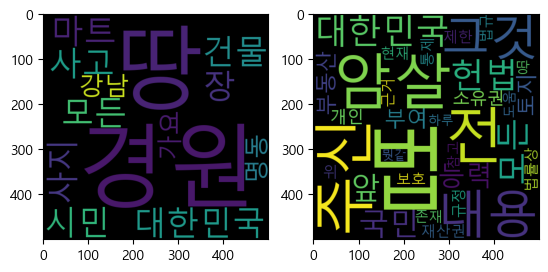

['경원', '대한민국', '모든', '건물', '경원', '사고', '마트', '장', '시민', '사지', '강남', '명동', '땅', '땅', '가요']
['전', '암살', '주신', '내용', '그것', '대한민국', '헌법', '모든', '국민', '법', '앞', '능력', '부여', '부동산', '토지', '소유권', '개인', '재산권', '보호', '제한', '규정', '땅', '통제', '위', '법률상', '근거', '현재', '법규', '존재', '참고', '도움', '하루', '법', '뭣같', '법']


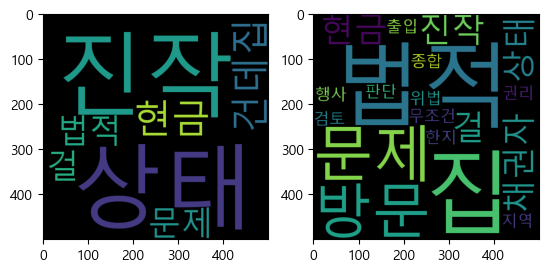

['진작', '상태', '현금', '건데집', '법적', '문제', '걸']
['진작', '상태', '현금', '집', '법적', '문제', '걸', '채권자', '집', '방문', '무조건', '법적', '문제', '권리', '행사', '방문', '출입', '지역', '종합', '검토', '위법', '한지', '판단']


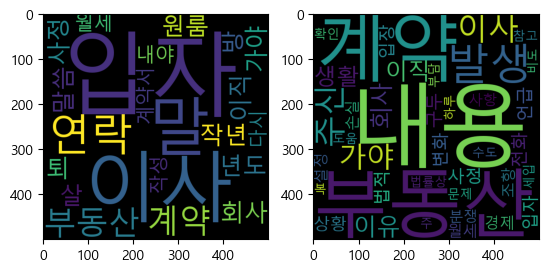

['작년', '원룸', '이사', '년도', '말', '방', '입자', '연락', '회사', '이직', '연락', '살', '사정', '이사', '가야', '부동산', '말씀', '계약', '계약', '입자', '퇴', '입자', '월세', '내야', '계약서', '다시', '작성', '부동산', '말']
['주신', '내용', '이사', '가야', '이유', '회사', '이직', '생활', '사정', '변화', '부동산', '구두', '계약', '전화', '언급', '내용', '법적', '부동산', '입장', '입자', '상황', '월세', '경제', '손실', '발생', '조항', '설정', '부동산', '계약', '사항', '분쟁', '법률상', '문제', '발생', '수도', '계약', '내용', '확인', '참고', '도움', '하루', '세입', '주', '복', '비도', '부담']


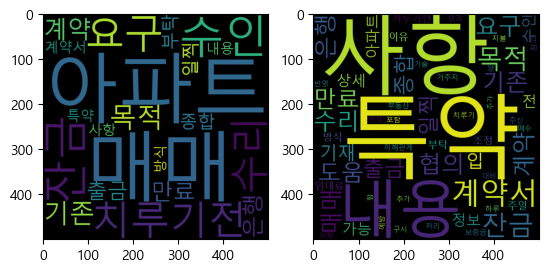

['아파트', '매매', '수인', '잔금', '치루기전', '요구', '수리', '목적', '기존', '계약', '만료', '은행', '출금', '종합', '일찍', '부탁', '계약서', '특약', '사항', '내용', '방식']
['전', '잔금', '지불', '구시', '특약', '가능', '상세', '사항', '협의', '반영', '도움', '정보', '아파트', '매매', '수인', '잔금', '치루기전', '요구', '수리', '목적', '기존', '계약', '만료', '은행', '출금', '종합', '일찍', '부탁', '계약서', '특약', '사항', '내용', '방식', '매수', '인과', '협의', '특약', '사항', '추가', '가능', '목적', '기재', '상세', '내용', '기술', '도움', '정보', '아파트', '매매', '수인', '잔금', '치루기전', '요구', '수리', '목적', '기존', '계약', '만료', '은행', '출금', '종합', '일찍', '부탁', '계약서', '특약', '사항', '내용', '방식', '주신', '내용', '부동산', '매매', '잔금', '치루기', '전', '요구', '이유', '입', '주가', '일찍', '상황', '대비', '계약서', '특약', '사항', '이유', '수리', '목적', '기존', '거주지', '계약', '만료', '은행', '출금', '사항', '종합', '입', '주일', '조정', '내용', '계약서', '기재', '특약', '내용', '입', '주일', '임대료', '협의', '임대료', '조정', '보증금', '처리', '포함', '계약서', '특약', '사항', '기재', '함', '양', '이해관계', '분쟁', '예방', '참고', '도움', '하루']


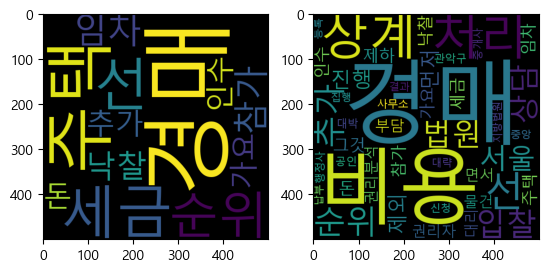

['주택', '세금', '선', '순위', '임차', '경매', '경매', '참가', '낙찰', '추가', '돈', '인수', '가요']
['경매', '진행', '비용', '먼저', '제외', '비용', '그것', '제하', '주택', '세금', '선', '순위', '임차', '경매', '경매', '참가', '낙찰', '추가', '돈', '인수', '가요', '선', '순위', '권리자', '면서', '입찰', '상계', '처리', '비용', '부담', '상계', '처리', '법원', '경매', '물건', '권리분석', '입찰', '대리', '상담', '서울', '관악구', '대박', '행정사', '공인', '중개사', '사무소', '서울', '중앙', '지방법원', '등록', '상담', '상계', '처리', '법원', '신청', '경매', '집행', '비용', '대략', '추가', '납부', '결과']


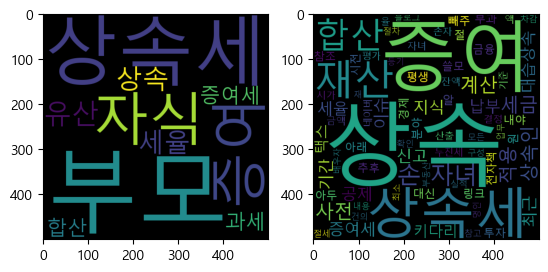

['부모', '자식', '증여', '부모', '유산', '상속', '상속세', '세율', '증여세', '합산', '과세', '상속세']
['지식', '절', '대신', '사전', '증여', '상속', '재산', '합산', '원', '상속', '공제', '적용', '상속세', '부과', '증여', '재산', '추후', '상속', '재산', '합산', '상속세', '내야', '납부', '증여세', '빼주', '알', '아두', '평생', '쓸모', '금융', '경제', '투자', '분야', '지식', '아래', '전자책', '링크', '참조', '상속', '시전', '상속인', '증여', '재산', '상속', '재산', '합산', '상속', '세율', '누진세', '율', '적용', '상속세', '상속', '재산', '평가', '액', '시가', '상속', '공제', '잔액', '세율', '적용', '산출', '상속인', '증여', '금액', '합산', '상속세', '신고', '손자', '상속인', '증여', '기준', '상속세', '신고', '결정', '손', '자녀', '세금', '손', '자녀', '증여', '재산', '네이버', '블로그', '손', '자녀', '세금', '손', '자녀', '증여', '재산', '상속세', '계산', '대습상속', '합산', '기간', '손', '자녀', '증여', '재산', '상속세', '계산', '대습상속', '합산', '기간', '사전', '증여', '상속세', '자녀', '명인', '배우자', '상속', '재산', '구성', '상속', '이슈', '사전', '증여', '상속세', '합산', '재', '계산', '납부', '증여세', '상속세', '차감', '상속', '이슈', '확인', '내용', '참고', '상속', '모든', '상속', '절차', '상속세', '절세', '상속', '등기', '최근', '키다리', '택스', '상속', '증여', '세금', '최소', '업무', '실적', '키다리', '택스', '

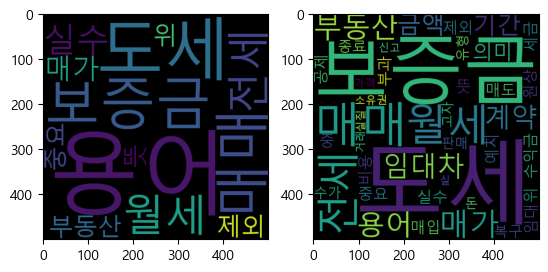

['도세', '보증금', '매매', '월세', '전세', '실수', '매가', '부동산', '용어', '뜻', '위', '제외', '중요', '용어']
['도세', '보증금', '매매', '월세', '전세', '실수', '매가', '부동산', '용어', '뜻', '위', '제외', '중요', '용어', '도세', '매입', '부동산', '매도', '수익금', '비용', '공제', '부과', '세금', '보증금', '임대차', '계약', '기간', '중', '임대', '예치', '금액', '원상', '복구', '계약', '기간', '종료', '수가', '임대차', '유형', '전세', '월세', '매매', '판매', '고자', '돈', '소유권', '의미', '실', '매가', '실질', '거래', '금액', '신고', '가격', '의미']


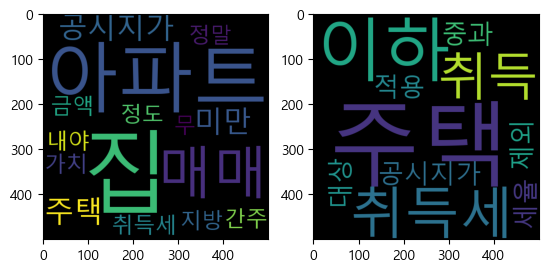

['지방', '아파트', '매매', '공시지가', '미만', '집', '정말', '금액', '가치', '집', '집', '아파트', '매매', '취득세', '정도', '내야', '공시지가', '미만', '주택', '무', '주택', '간주']
['공시지가', '이하', '주택', '취득세', '중과', '대상', '주택', '제외', '취득', '주택', '취득세', '세율', '적용', '이하', '주택', '취득']


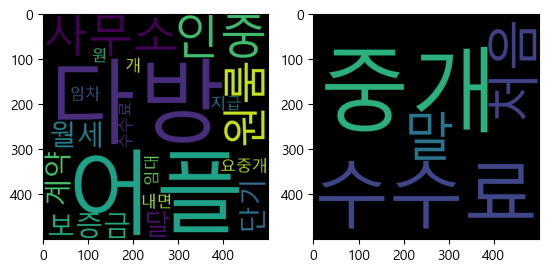

['다방', '어플', '인중', '사무소', '원룸', '보증금', '월세', '달', '단기', '계약', '요중개', '수수료', '임차', '임대', '원', '개', '내면', '지급']
['중개', '수수료', '말', '처음']


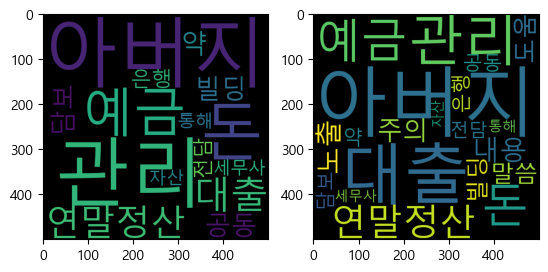

['빌딩', '아버지', '공동', '아버지', '돈', '관리', '예금', '관리', '돈', '예금', '담보', '약', '은행', '대출', '연말정산', '아버지', '대출', '전담', '세무사', '통해', '연말정산', '자산', '관리']
['아버지', '대출', '내용', '노출', '주의', '도움', '말씀', '빌딩', '아버지', '공동', '아버지', '돈', '관리', '예금', '관리', '돈', '예금', '담보', '약', '은행', '대출', '연말정산', '아버지', '대출', '전담', '세무사', '통해', '연말정산', '자산', '관리']


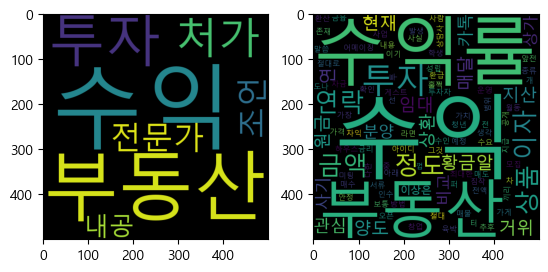

['수익', '부동산', '투자', '수익', '부동산', '투자', '처가', '전문가', '조언', '내공']
['어메이징', '수익률', '수익', '부동산', '육박', '수익률', '부동산', '투자', '수익률', '다한', '부동산', '수요', '훌쩍', '터', '이기', '수인', '매수', '황금알', '거위', '존재', '금액', '절대', '매도', '짐작', '연', '수익', '라면', '보통', '그것', '양도', '차익', '수익', '범위', '양도', '차', '수익', '투자', '연', '수익', '환산', '임대', '수익', '임대', '수익', '발생', '수익', '부동산', '지산', '가치', '성립', '끼리', '정도', '사업', '학생', '가게', '게스트', '하우스', '인수', '운영', '예정', '투자자', '모집', '중', '현재', '금액', '투자', '금액', '전액', '투자', '매달', '원금', '상환', '이자', '개', '월동', '지급', '원금', '상환', '매달', '이자', '이자', '투자', '관심', '카톡', '아이디', '연락', '절대로', '사기', '미팅', '서류', '창업', '청년', '정도', '투', '자금', '수익', '부동산', '분양', '투자', '앞전', '말씀', '내용', '수익률', '사기', '가장', '수익률', '선', '정도', '금융', '상품', '금리', '비교', '비교', '수익률', '안정', '최대한', '추후', '환급', '생각', '수익', '부동산', '상품', '종류', '수익률', '상품', '확인', '연락', '공개', '오픈', '전', '부동산', '매물', '아래', '카톡', '방법', '연락', '현재', '분양', '상담사', '사람', '사실', '퍼', '수익', '도나', '가격', '황금알', '거위', '껍', '오피스텔', '지산', '상가', '통틀어', '만', '

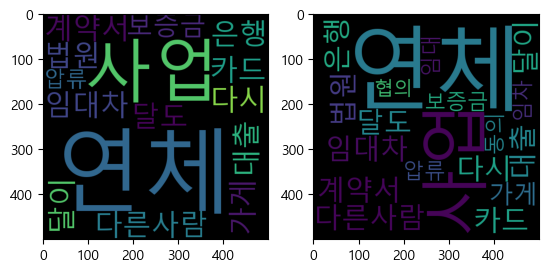

['사업', '다른사람', '임대차', '계약서', '다시', '카드', '연체', '달도', '은행', '대출', '연체', '달이', '법원', '가게', '보증금', '압류']
['사업', '다른사람', '임대차', '계약서', '다시', '카드', '연체', '달도', '은행', '대출', '연체', '달이', '법원', '가게', '보증금', '압류', '임차', '임대', '동의', '협의']


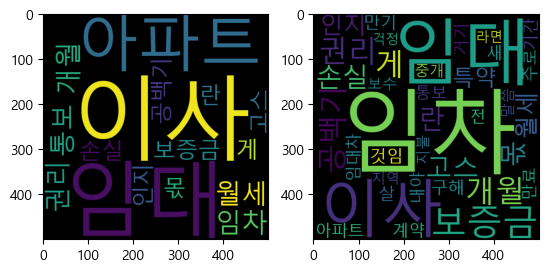

['아파트', '월세', '임차', '이사', '통보', '개월', '임대', '권리', '이사', '보증금', '게', '공백기', '손실', '고스', '란', '임대', '몫', '인지']
['개월', '임대', '권리', '이사', '보증금', '게', '공백기', '손실', '고스', '란', '임대', '몫', '인지', '임차', '만기', '살', '새', '임차', '구해', '거기', '보증금', '것임', '아파트', '월세', '임차', '이사', '통보', '개월', '임대', '권리', '이사', '보증금', '게', '공백기', '손실', '고스', '란', '임대', '몫', '인지', '임대차', '계약', '기간', '만료', '전', '임차', '특약', '주로', '임차', '월세', '내야', '중개', '보수', '지불', '특약', '임차', '말씀', '임차', '지역', '라면', '걱정']


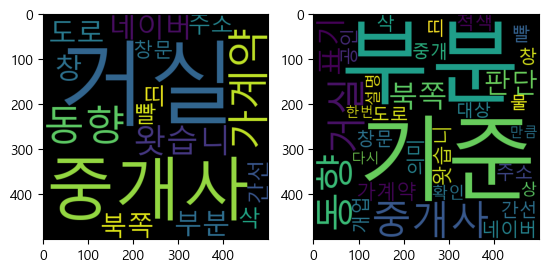

['중개사', '동향', '가계약', '왓습니', '네이버', '도로', '거실', '창', '부분', '북쪽', '주소', '삭', '띠', '빨', '간선', '거실', '창문']
['중개사', '동향', '가계약', '왓습니', '네이버', '도로', '거실', '창', '부분', '북쪽', '주소', '삭', '띠', '빨', '간선', '거실', '창문', '적색', '부분', '표기', '부분', '북쪽', '의미', '동향', '개업', '공인', '중개사', '중개', '대상', '물', '확인', '설명', '상', '표기', '기준', '기준', '판단', '만큼', '다시', '한번', '기준', '판단']


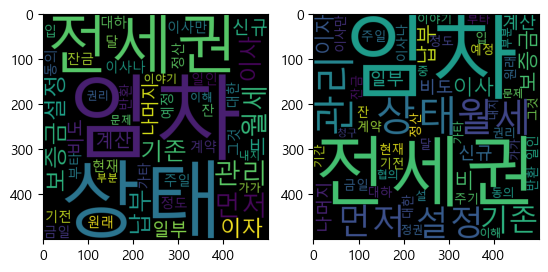

['기존', '임차', '전세권', '설정', '상태', '현재', '기전', '이사', '먼저', '이사', '상태', '전세권', '관리', '비', '월세', '납부', '상태', '신규', '계약', '잔', '금일', '입', '주일', '상태', '기존', '임차', '보증금', '일부', '상태', '나머지', '대한', '이자', '계산', '먼저', '이사나', '임차', '전세권', '설정', '관리', '비도', '납부', '월세', '납부', '임차', '달', '정도', '먼저', '이사만', '대하', '원래', '잔금', '일인', '나머지', '보증금', '이자', '정산', '반환', '예정', '기존', '임차', '동의', '그것', '가타', '부타', '이야기', '권리', '월세', '관리', '비', '이해', '가가', '월세', '관리', '비도', '내지', '전세권', '설정', '보증금', '일부', '부분', '이자', '계산', '신규', '임차', '먼저', '이사', '문제']
['기존', '임차', '전세권', '설정', '상태', '현재', '기전', '이사', '먼저', '이사', '상태', '전세권', '관리', '비', '월세', '납부', '상태', '신규', '계약', '잔', '금일', '입', '주일', '상태', '기존', '임차', '보증금', '일부', '상태', '나머지', '대한', '이자', '계산', '주기', '먼저', '이사나', '임차', '전세권', '설정', '관리', '비도', '납부', '월세', '납부', '임차', '달', '정도', '먼저', '이사만', '대하', '원래', '잔금', '일인', '나머지', '보증금', '이자', '정산', '반환', '예정', '기존', '임차', '동의', '그것', '가타', '부타', '이야기', '권리', '전세권', '설정', '기간', '중', '임차', '전세권', '설', '정권', '협의', '월세', '

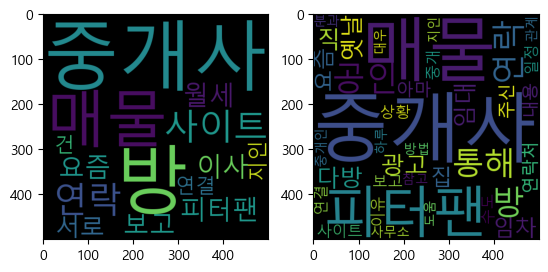

['이사', '중개사', '방', '요즘', '매물', '피터팬', '사이트', '월세', '매물', '사이트', '보고', '연락', '중개사', '연락', '방', '서로', '연결', '지인', '건']
['피터팬', '직', '다방', '공인', '중개사', '광고', '옛날', '피터팬', '임대', '임차', '집', '요즘', '아마', '피터팬', '매물', '공인', '중개사', '연락처', '중개사', '연락', '방', '주신', '내용', '사이트', '통해', '매물', '보고', '중개사', '연락', '방', '매물', '중개사', '일정', '매물', '상황', '이유', '연결', '수도', '중개', '사무소', '중개인', '통해', '매물', '방법', '중개사', '분과', '지인', '관계', '대우', '참고', '도움', '하루']


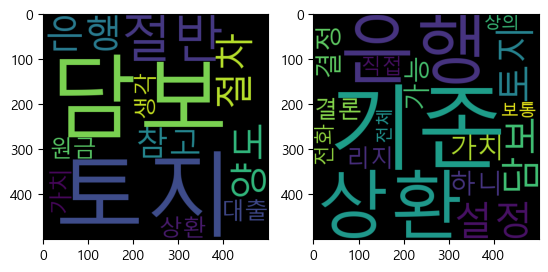

['은행', '담보', '토지', '절반', '양도', '절차', '참고', '대출', '원금', '상환', '생각', '절반', '토지', '담보', '가치']
['기존', '설정', '토지', '담보', '가치', '기존', '은행', '결정', '가능', '하니', '상환', '결론', '리지', '직접', '은행', '전화', '상의', '보통', '전체', '상환']


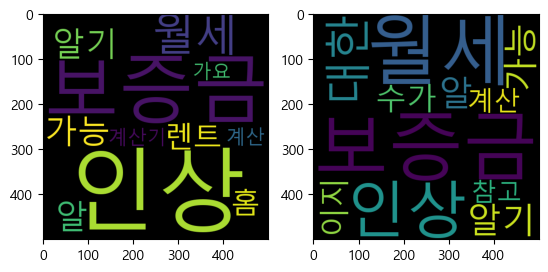

['보증금', '월세', '월세', '보증금', '인상', '알기', '인상', '가능', '알', '렌트', '홈', '계산기', '계산', '인상', '가요']
['보증금', '월세', '월세', '보증금', '인상', '알기', '인상', '가능', '알', '월세', '대한', '인상', '수가', '이지', '보증금', '대한', '인상', '계산', '참고', '보증금', '월세']


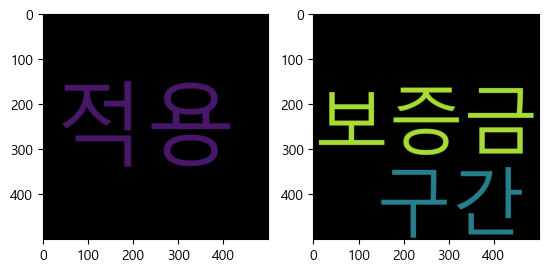

['적용']
['보증금', '구간']


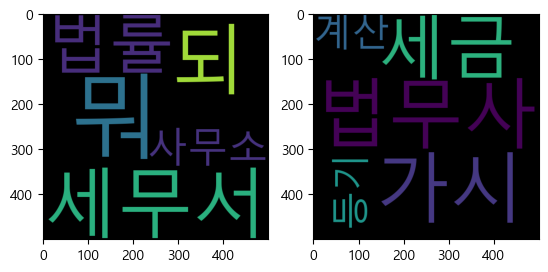

['뭐', '세무서', '되', '법률', '사무소']
['법무사', '가시', '세금', '계산', '등기']


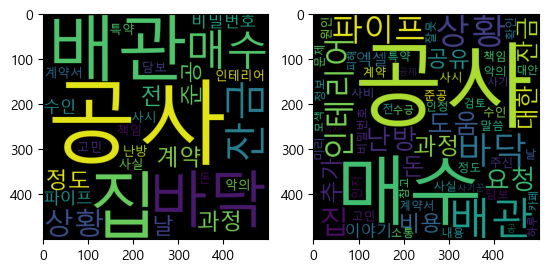

['준공', '집', '정도', '매수', '계약', '과정', '매수', '집', '배관', '공사', '전', '바닥', '공사', '집', '날', '잔금', '비밀번호', '바닥', '배관', '공사', '파이프', '공사', '수인', '인테리어', '사시', '바닥', '난방', '배관', '공사', '잔금', '돈', '상황', '악의', '사실', '계약서', '책임', '담보', '특약', '고민', '상황']
['매수', '난방', '배관', '사비', '요청', '도움', '말씀', '준공', '집', '정도', '매수', '계약', '과정', '매수', '집', '배관', '공사', '전', '바닥', '공사', '집', '날', '잔금', '비밀번호', '바닥', '배관', '공사', '파이프', '공사', '수인', '인테리어', '사시', '바닥', '난방', '배관', '공사', '잔금', '돈', '상황', '악의', '사실', '계약서', '책임', '담보', '특약', '고민', '상황', '주신', '내용', '매수', '상황', '원인', '바닥', '공사', '잘못', '인지', '매수', '소통', '과정', '정보', '확인', '매수', '추가', '공사', '대한', '비용', '문제', '미리', '검토', '상황', '매수', '추가', '비용', '대한', '인정', '요청', '수긍', '대안', '모색', '참고', '도움', '하루', '인테리어', '사기', '피해', '공유', '카페', '인테리어', '사기꾼', '공유', '인사', '공', '배관', '공사', '이야기', '배관', '공사', '엑셀', '파이프', '공사', '이야기', '엑셀', '파이프', '공사', '돈', '공제']


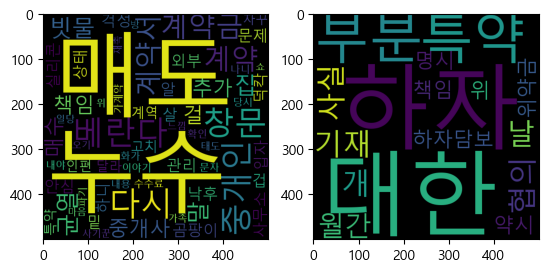

['누수', '곰팡이', '걱정', '베란다', '창문', '밑', '균열', '빗물', '중개인', '말', '실리콘', '낙후', '다시', '외부', '문제', '관리', '사무소', '안심', '계약금', '누수', '창문', '빗물', '누수', '집', '하니', '상태', '입자', '살', '베란다', '창문', '누수', '알', '계약', '겁', '덕칵', '고치', '중개사', '말', '계역', '누수', '특약', '누수', '매도', '책임', '달라', '매도', '계약서', '걸', '중개사', '매도', '인편', '자꾸', '이야기', '화가', '계약금', '나니', '계약서', '문자', '당시', '걸', '중개인', '태도', '다시', '계약서', '매도', '매수', '베란다', '균열', '확인', '매도', '책임', '계약', '파기', '중개인', '수수료', '매도', '매수', '내야', '추가', '내용', '가계약', '추가', '사기꾼', '일당', '느낌', '집', '마음', '가족', '다시', '방', '오기', '계약', '재촉', '계약금', '위', '쇼']
['하자', '대한', '부분', '특약', '기재', '협의', '사실', '날', '개', '월간', '하자담보', '책임', '위', '약시', '위약금', '명시']


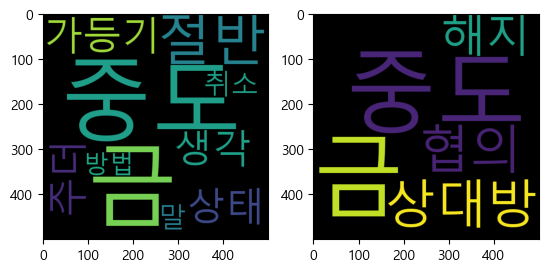

['중도', '금', '절반', '가등기', '상태', '생각', '주더', '취소', '중도', '금', '말', '방법']
['중도', '금', '상대방', '협의', '해지']


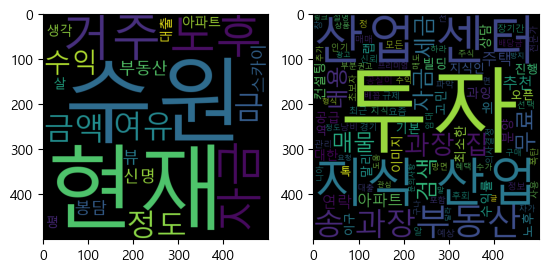

['현재', '수원', '거주', '노후', '자금', '여유', '금', '정도', '금액', '수익', '부동산', '봉담', '신명', '스카이', '뷰', '아파트', '평', '대출', '살', '생각']
['최근', '부동산', '규제', '지식', '산업', '센터', '인기', '경기', '공급', '과잉', '폭탄', '장기간', '공실이', '예상', '매물', '최소한', '지식', '산업', '센터', '대한', '기본', '지식', '알', '의사결정', '후회', '빌딩', '랩', '지식', '산업', '센터', '초보자', '내용', '무료', '매물', '정', '전', '최소한', '기본', '내용', '파악', '신뢰', '전문가', '상담', '요즘', '지식', '산업', '센터', '공급', '과잉', '매물', '선택', '고민', '지식', '산업', '센터', '낭비', '분양', '매매', '임대', '관리', '세금', '지식', '산업', '센터', '대한', '모든', '정보', '무료', '내용', '검색', '창', '빌딩', '랩', '검색', '노후', '자금', '사용', '자금', '부동산', '배당금', '주식', '방면', '고민', '송', '과장', '집', '수익', '부동산', '아파트', '구매', '면', '투자', '자가', '추천', '수가', '주택', '아파트', '투자', '말리', '세금', '부분', '배꼽', '투자', '주택', '포함', '하라', '설명', '추가', '대출', '세금', '혜택', '니아', '매도', '프리미엄', '투자', '형식', '아파트', '주택', '말리', '노후', '자금', '수익률', '상품', '투자', '추천', '말', '수익률', '정도', '구나', '투자', '권고', '도움', '광고', '글', '방지', '송', '과장', '집', '컨설팅', '부동산', '투자', '관심', '컨설팅', '위', '이미지', 

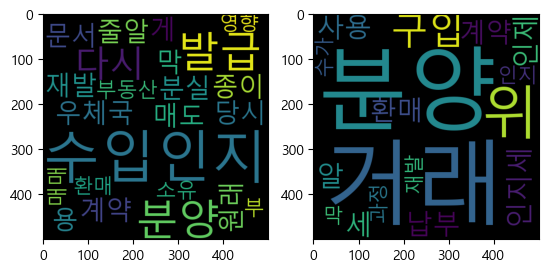

['분양', '계약', '당시', '우체국', '발급', '수입인지', '분실', '줄알', '분양', '매도', '수입인지', '종이', '문서', '용', '다시', '발급', '원래', '수입인지', '다시', '수입인지', '게', '재발', '막', '부동산', '수입인지', '부', '소유', '분양', '매매', '영향', '발급', '수입인지', '환매']
['분양', '거래', '인지세', '납부', '거래', '위', '인제', '세', '구입', '사용', '구입', '알', '환매', '분양', '계약', '위', '인지', '과정', '재발', '막', '수가']


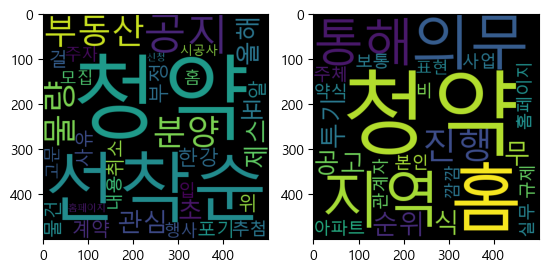

['부동산', '관심', '부동산', '청약', '올해', '초', '포', '제스', '한강', '분양', '부정', '청약', '계약', '포기', '취소', '사유', '선착순', '물량', '걸', '알', '위', '물건', '추첨', '선착순', '분양', '내용', '입', '주자', '모집', '고문', '선착순', '물량', '공지', '청약', '홈', '행사', '시공사', '홈페이지', '공지', '공지', '신청']
['무', '순위', '청약', '투기', '청약', '지역', '의무', '청약', '홈', '통해', '진행', '식', '공고', '청약', '홈', '통해', '아파트', '비', '규제', '지역', '청약', '홈', '의무', '본인', '홈페이지', '약식', '진행', '사업', '주체', '관계자', '보통', '실무', '깜깜', '표현']


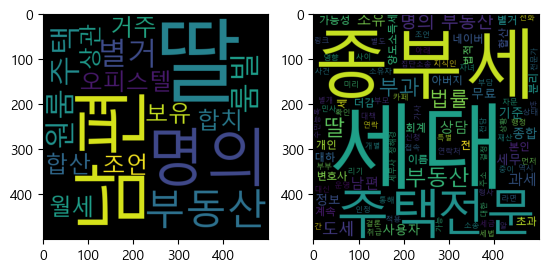

['주택', '남편', '별거', '딸', '딸', '룸빌', '원룸', '오피스텔', '보유', '월세', '거주', '딸', '합치', '남편', '명의', '부동산', '합산', '명의', '부동산', '상관', '조언']
['네이버', '지식인', '무료', '법률', '정보', '전', '먼저', '미리', '알', '아래', '링크', '통해', '법률', '상담', '신청', '소송', '전문', '변호사', '법률', '전화', '상담', '형사', '전문', '민사', '전문', '가사', '전문', '행정', '전문', '집단소송', '전문', '특별', '대책', '전담', '반', '운영', '이름', '사건', '상담', '연락처', '연락', '가능', '계속', '무료', '법률', '정보', '네이버', '카페', '접속', '무료', '법률', '정보', '계속', '법률', '법적', '자문', '대신', '법적', '결정', '리기', '전', '변호사', '상담', '사용자', '상황', '기준', '종합', '부동산', '세', '종부세', '양도소득세', '도세', '대한', '조언', '종합', '부동산', '세', '종부세', '개인', '소유', '주택', '부과', '세금', '남편', '별거', '중이', '별거', '세대', '분리', '남편', '부동산', '사용자', '세대', '별개', '취급', '가능성', '남편', '명의', '부동산', '딸', '명의', '부동산', '합산', '종부세', '부과', '종부세', '소유자', '이름', '기준', '부과', '본인', '명의', '부동산', '별도', '종부세', '부담', '양도소득세', '도세', '역시', '개별', '소유', '부동산', '기준', '부과', '사용자', '딸', '부동산', '소유', '상태', '도세', '부과', '남편', '명의', '부동산', '딸', '명의', '부동산', '도세', '부과', '결론', '본인', 

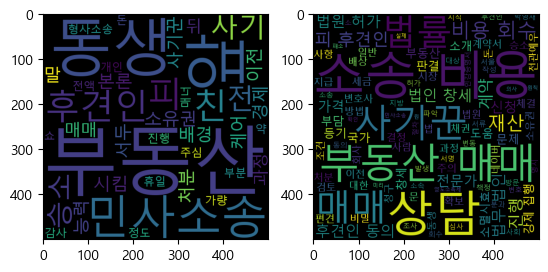

['피', '후견인', '친', '동생', '앞', '부동산', '사기', '전', '민사소송', '승소', '소유권', '이전', '사기꾼', '말', '시킴', '서두', '배경', '본론', '경제', '능력', '동생', '부동산', '처분', '케어', '앞', '부동산', '매매', '뒤', '과정', '민사소송', '형사소송', '진행', '개인', '돈', '약', '가량', '부분', '전액', '정도', '주심', '감사', '매너', '휴일', '쇼']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '박영재', '변호사', '피', '후견인', '부동산', '처분', '소송', '비용', '회수', '대한', '부동산', '매매', '과정', '피', '후견인', '부동산', '매매', '일반', '매매', '절차', '진행', '후견인', '동의', '법원', '허가', '후견인', '동의', '피', '후견인', '재산', '처분', '후견인', '동의', '동생', '분과', '부동산', '매매', '계약', '체결', '서류', '서명', '법원', '허가', '부동산', '매매', '피', '후견인', '재산', '변동', '법원', '허가', '법원', '후견인', '동의', '매매', '조건', '피', '후견인', '심사', '허가', '결정', '매매', '계약', '일반', '부동산', '매매', '계약', '매매', '대상', '부동산', '매매', '가격', '계약', '조건', '명시', '계약서', '작성', '등기', '이전', '매매', '계약', '체결', '등기', '소', '방문', '소유권', '이전', '등기', '진행', '후견인', '인감증명서', '법원', '허가', '결정', '부동산', '매매', '주의', '사항', '시장', '가격', '조사', '부동산', '시장', '가격', '파악', '매매', '가격', '책정', '전문가', '도움

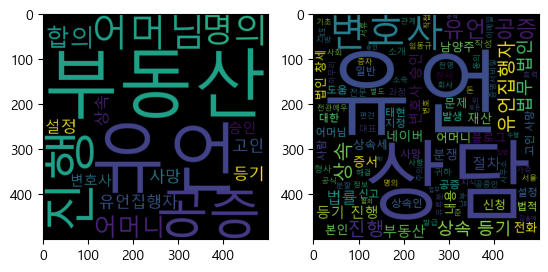

['어머님', '명의', '부동산', '유언', '공증', '어머니', '부동산', '합의', '유언집행자', '설정', '고인', '사망', '상속', '등기', '진행', '유언', '공증', '진행', '변호사', '승인']
['어머님', '명의', '부동산', '유언', '공증', '어머니', '부동산', '합의', '유언집행자', '설정', '고인', '사망', '상속', '등기', '진행', '유언', '공증', '진행', '변호사', '승인', '서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '김솔애', '변호사', '어머니', '명의', '부동산', '유언', '공증', '대한', '유언집행자', '본인', '설정', '유언', '공증', '유언', '어머니', '유언집행자', '지정', '본인', '직접', '지정', '유언집행자', '유언', '내용', '재산', '분배', '상속', '등기', '진행', '유언', '집행', '관', '모든', '업무', '수행', '사람', '본인', '유언집행자', '어머니', '유언', '부동산', '상속', '과정', '직접', '처리', '고인', '사망', '상속', '등기', '진행', '유언', '공증', '진행', '준', '변호사', '승인', '일반', '변호사', '추가', '승인', '유언', '공증', '공증인', '작성', '공식', '문서', '법적', '효력', '공증', '증서', '유언', '사망', '유언집행자', '공증', '증서', '법원', '제출', '상속', '등기', '진행', '변호사', '도움', '유언', '내용', '분쟁', '소지', '유언', '내용', '상속인', '분쟁', '예상', '변호사', '자문', '상속', '절차', '진행', '상속', '재산', '분할', '대한', '법률', '문제', '발생', '상속', '재산', '분할', '과정', '법적', '문제', '발생', '변호사', '

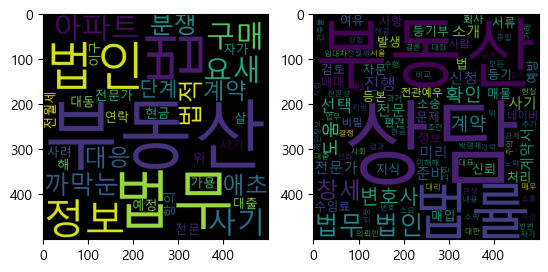

['아파트', '구매', '요새', '부동산', '사기', '법', '까막눈', '법적', '분쟁', '대응', '애초', '계약', '단계', '부동산', '법', '전문가', '대동', '부동산', '전문', '법무', '법인', '위', '해', '항의', '법무', '법인', '연락', '정보', '시기', '정보', '전월세', '자가', '사려', '대출', '가용', '현금', '살', '예정', '이구']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '박영재', '변호사', '부동산', '계약', '법률', '전문가', '도움', '선택', '부동산', '전문', '법무', '법인', '업무', '처리', '부동산', '계약', '법률', '관계', '전문', '법률', '지식', '부동산', '사기', '빈번', '발생', '현실', '법무', '법인', '도움', '매우', '선택', '부동산', '전문', '법무', '법인', '부동산', '매매', '계약', '등기', '임대차', '분쟁', '해결', '부동산', '모든', '법률', '문제', '대한', '자문', '소송', '대리', '수행', '법무', '법인', '선정', '사항', '전문성', '부동산', '소송', '경험', '변호사', '확인', '수임료', '변호사', '수임료', '미리', '확인', '비교', '신뢰', '변호사', '경력', '과거', '사건', '처리', '결과', '종합', '신뢰', '변호사', '선택', '의뢰인', '소통', '상담', '변호사', '선택', '주의', '사항', '계약서', '확인', '법무', '법인', '도움', '계약서', '내용', '확인', '이해해', '미리', '준비', '서류', '부동산', '매물', '정보', '등기부', '등본', '건축물', '대장', '서류', '미리', '준비', '상담', '진행', '여유', '법률', '자문', '계약', '진행

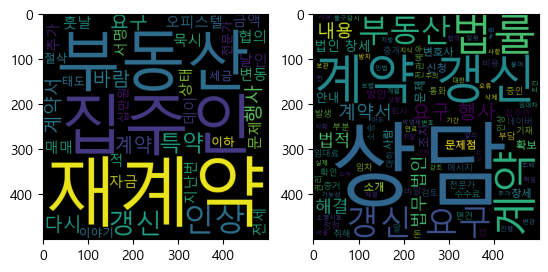

['오피스텔', '전세', '부동산', '집주인', '인상', '재계약', '훗날', '매매', '바람', '집주인', '협의', '인상', '자금', '재계약', '묵시', '갱신', '금액', '변동', '특약', '추가', '날인', '상태', '문제', '계약서', '다시', '지난번', '인상', '재계약', '계약', '갱신', '요구', '행사', '특약', '서명', '계약서', '데이', '계약', '갱신', '요구', '행사', '적', '다시', '특약', '집주인', '부동산', '이야기', '바람', '세금', '십만원', '이하', '절삭', '재계약', '부동산', '태도', '전문가']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '박영재', '변호사', '계약', '갱신', '요구', '행사', '대하', '문제점', '해결', '방안', '대하', '안내', '문제점', '계약', '갱신', '요구', '행사', '오류', '실제', '계약', '갱신', '요구', '행사', '불구', '계약서', '기재', '문제', '부동산', '안내', '부동산', '안내', '계약', '조건', '계약', '체결', '가능성', '해결', '방안', '집주인', '협의', '계약', '내용', '정정', '계약서', '기재', '내용', '사실', '집주인', '알리', '계약', '갱신', '요구', '행사', '부분', '삭제', '정정', '요구', '부동산', '잘못', '부동산', '안내', '발생', '강조', '책임', '물어', '법률', '전문가', '상담', '계약', '검토', '변호사', '법률', '전문가', '계약서', '법적', '문제점', '확인', '법적', '조치', '계약', '내용', '변경', '소송', '법적', '조치', '취할', '증거', '확보', '계약서', '계약서', '보관', '계약', '갱신', '요구', '행사', '부분', '

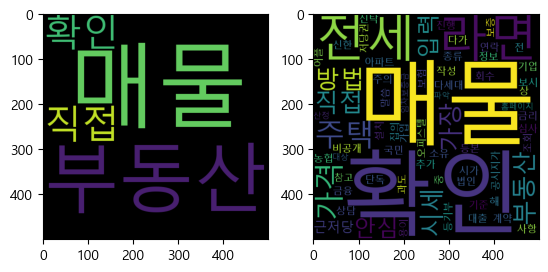

['매물', '부동산', '직접', '확인']
['전세', '대출', '매물', '확인', '방법', '비공개', '회수', '작성', '전', '매물', '부동산', '직접', '확인', '보시', '전세', '집의', '종류', '아파트', '라면', '시세', '오피스텔', '라면', '시세', '기준', '시가', '다세대', '라면', '공시지가', '말씀', '확인', '추가', '상담', '연락', '국민', '신한', '농협', '기업', '금융', '중', '가장', '금리', '진행', '매물', '부동산', '직접', '확인', '심사', '해', '계약', '주의', '사항', '단독', '다가', '주택', '신탁', '법인', '소유', '주택', '저당권', '과도', '안심', '전세', '어플', '설치', '안심', '조회', '매물', '정보', '입력', '등기부', '등본', '상', '근저당', '입력', '보증', '보험', '가입', '확인', '참고', '용이', '가장', '홈페이지', '주택', '가격', '산정', '방법', '확인', '대상', '매물', '가격', '파악', '매물', '가격', '매물', '근저당', '임차보증금', '확인']


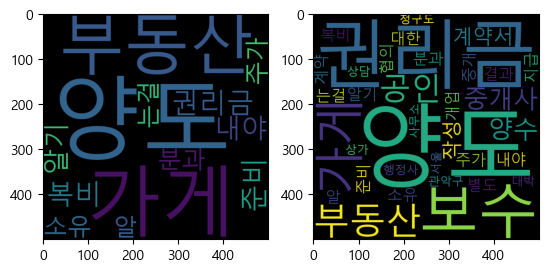

['권리금', '가게', '양도', '준비', '가게', '양도', '부동산', '복비', '내야', '알기', '양도', '분과', '부동산', '소유', '주가', '는걸', '알']
['권리금', '가게', '양도', '준비', '가게', '양도', '부동산', '복비', '내야', '알기', '양도', '분과', '부동산', '소유', '주가', '는걸', '알', '권리금', '대한', '보수', '중개', '보수', '별도', '협의', '결과', '지급', '개업', '공인', '중개사', '권리금', '양도', '양수', '계약서', '작성', '권리금', '양도', '계약', '보수', '청구도', '상가', '권리금', '양도', '양수', '계약서', '작성', '서울', '관악구', '대박', '행정사', '공인', '중개사', '사무소', '상담']


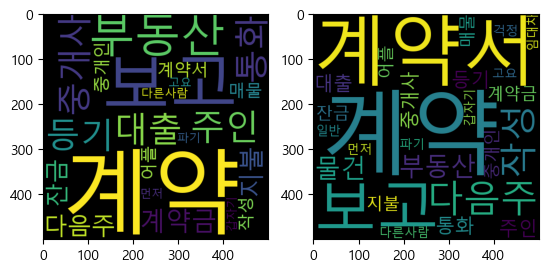

['등기', '보고', '대출', '보고', '중개사', '주인', '통화', '계약', '계약금', '지불', '다음주', '잔금', '계약서', '작성', '부동산', '어플', '계약', '매물', '중개인', '부동산', '다른사람', '고요', '먼저', '계약', '갑자기', '계약', '파기']
['등기', '보고', '대출', '보고', '중개사', '주인', '통화', '계약', '계약금', '지불', '다음주', '잔금', '계약서', '작성', '부동산', '어플', '계약', '매물', '중개인', '부동산', '다른사람', '고요', '먼저', '계약', '갑자기', '계약', '파기', '다음주', '계약서', '작성', '물건', '일반', '임대차', '계약서', '물건', '걱정']


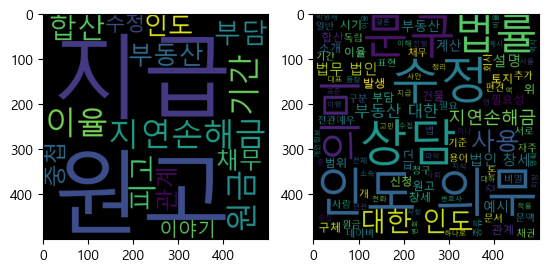

['원고', '지급', '지연손해금', '이율', '기간', '원금', '합산', '피고', '부담', '부동산', '인도', '채무', '중첩', '관계', '수정', '이야기']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '박영재', '변호사', '위', '문구', '법률', '문서', '자주', '등장', '표현', '채권', '채무', '관계', '정리', '사용', '채권', '액', '대한', '지연손해금', '계산', '부동산', '대한', '인도', '의무', '문구', '사용', '문구', '의미', '수정', '필요성', '원고', '지급', '지연손해금', '이율', '기간', '원금', '합산', '의미', '원고', '청구', '지연손해금', '이율', '기간', '개', '원금', '하나로', '합산', '계산', '의미', '수정', '필요성', '문구', '의미', '일반', '수정', '필요', '지연손해금', '계산', '기준', '이나', '이율', '적용', '기준', '대한', '추가', '설명', '피고', '부담', '부동산', '인도', '채무', '중첩', '관계', '의미', '피고', '개', '부동산', '인도', '의무', '부담', '부동산', '대한', '인도', '의무', '서로', '관계', '의미', '부동산', '대한', '인도', '의무', '독립', '서로', '연관', '구체', '설명', '수정', '필요성', '문구', '역시', '의미', '수정', '부동산', '종류', '토지', '건물', '부동산', '종류', '부동산', '대한', '인도', '의무', '구분', '설명', '인도', '의무', '발생', '시기', '부동산', '대한', '인도', '의무', '발생', '시기', '시기', '구분', '인도', '의무', '범위', '부동산', '대한', '인도', '의무', '범위', '범위', '구체', '설명', '수정

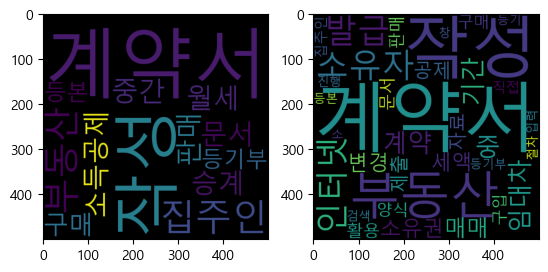

['월세', '중간', '집주인', '계약서', '승계', '작성', '소득공제', '계약서', '부동산', '계약서', '작성', '계약서', '문서', '판매', '구매', '작성', '집주인', '부동산', '등기부', '등본']
['부동산', '계약서', '작성', '임대차', '계약', '기간', '중', '매매', '소유권', '변경', '소유자', '계약서', '작성', '세액', '공제', '제출', '자료', '활용', '계약서', '문서', '판매', '구매', '작성', '계약서', '양식', '구입', '소유자', '직접', '계약서', '작성', '집주인', '부동산', '등기부', '등본', '인터넷', '발급', '검색', '창', '인터넷', '등기', '소', '입력', '진행', '절차', '발급']


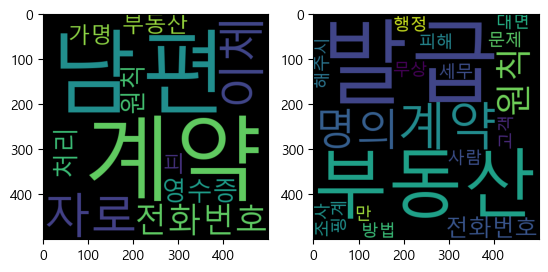

['계약', '자로', '남편', '이체', '남편', '전화번호', '영수증', '처리', '원칙', '계약', '가명', '부동산', '피']
['부동산', '해주시', '만', '부동산', '피해', '원칙', '계약', '명의', '발급', '방법', '전화번호', '부동산', '고객', '전화번호', '발급', '핑계', '대면', '계약', '명의', '발급', '부동산', '사람', '발급', '무상', '문제', '세무', '행정', '조사', '원칙', '계약', '명의', '발급']


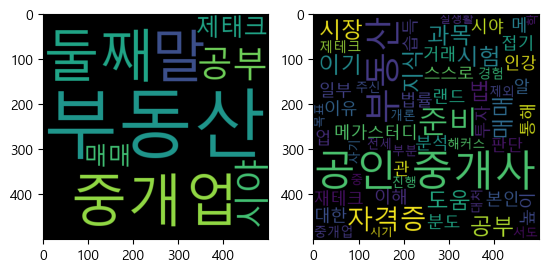

['중개업', '말', '둘째', '공부', '부동산', '시야', '제태크', '부동산', '매매']
['메가스터디', '공인', '중개사', '인강', '메', '랜드', '공인', '중개사', '시험', '준비', '이유', '공인', '중개사', '업', '준비', '일부', '부동산', '관', '시야', '준비', '본인', '스스로', '재테크', '준비', '분도', '알', '매매', '매매', '접기', '공인', '중개사', '시험', '자격증', '공인', '중개사', '공부', '부동산', '대한', '이해', '높이', '시장', '분석', '거래', '법률', '지식', '습득', '도움', '통해', '부동산', '투자', '판단', '제테크', '중개업', '경험', '해커스', '공인', '중개사', '주신', '부분', '공인', '중개사', '부동산', '자격증', '이기', '공부', '진행', '부동산', '시장', '지식', '과목', '중', '부동산', '학', '개론', '제외', '법', '과목', '이기', '전세', '사기', '대처', '법', '서도', '공인', '중개사', '목표', '실생활', '자격증', '도움', '시기']


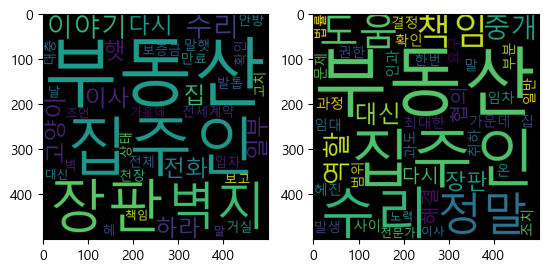

['전세계약', '만료', '이사', '집주인', '부동산', '입자', '집', '고양이', '벽', '일부', '장판', '헤', '부동산', '거실', '벽지', '안방', '벽지', '장판', '일부', '수리', '천장', '벽지', '집주인', '수리', '보증금', '이사', '날', '집주인', '집', '상태', '확인', '햇', '장판', '고양이', '발톱', '전체', '다시', '수리', '하라', '부동산', '이야기', '말햇', '부동산', '이야기', '고치', '부동산', '전화', '햇', '대충', '보고', '이야기', '집주인', '하라', '전화', '부동산', '가운데', '말', '책임', '부동산', '집주인', '대신', '장판', '다시', '조언']
['정말', '범위', '최대한', '도움', '부동산', '가운데', '말', '책임', '부동산', '임대', '인과', '임차', '사이', '중개', '역할', '중개', '과정', '발생', '문제', '책임', '부동산', '집주인', '대신', '온', '부동산', '집주인', '대신', '집', '확인', '역할', '수리', '결정', '집주인', '권한', '장판', '다시', '장판', '헤진', '부분', '수리', '일반', '집주인', '과도', '수리', '요구', '부동산', '협의', '조치', '취하', '부동산', '다시', '한번', '협의', '해결', '법률', '전문가', '도움', '이사', '정말', '해결', '노력']


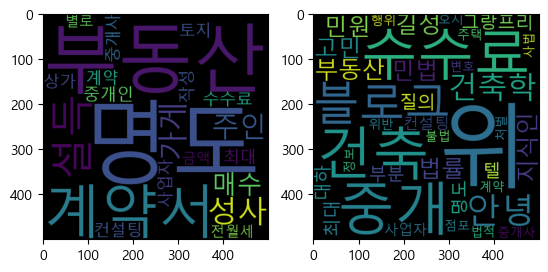

['명도', '설득', '부동산', '성사', '가게', '주인', '매수', '명도', '계약서', '부동산', '중개인', '계약서', '작성', '명도', '수수료', '최대', '컨설팅', '사업자', '중개사', '계약', '토지', '상가', '전월세', '금액', '별로']
['안녕', '건축학', '위', '부동산', '건축', '위', '건축', '민원', '위', '민법', '위', '법률', '위', '고민', '위', '지식인', '길성', '그랑프리', '텔', '위', '질의', '부분', '대하', '명도', '수수료', '최대', '컨설팅', '사업자', '중개사', '계약', '위', '점포', '주택', '법적', '중개', '수수료', '불법', '중개', '행위', '변호', '사법', '위반', '처벌', '블로그', '오시', '정보', '블로그']


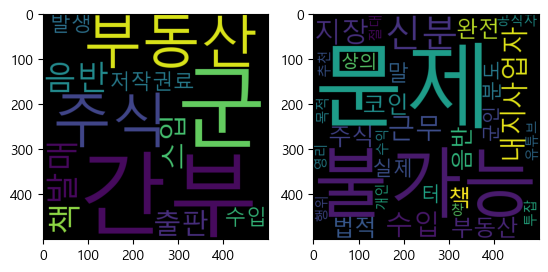

['군', '간부', '부동산', '주식', '음반', '발매', '책', '출판', '스입', '저작권료', '수입', '발생']
['사업자', '내지', '근무', '지장', '수입', '주식', '코인', '부동산', '법적', '문제', '음반', '책', '완전', '불가능', '말', '실제', '분도', '터', '불가능', '신분', '상의', '문제', '군인', '공직자', '신분', '개인', '영리', '행위', '목적', '투잡', '추천', '유튜브', '절대', '수익', '창']


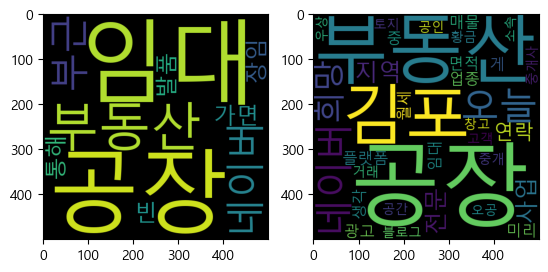

['공장', '임대', '네이버', '부동산', '부근', '가면', '빈', '공장', '임대', '장임', '발품', '부동산', '통해']
['김포', '오늘', '공장', '네이버', '부동산', '광고', '플랫폼', '중', '네이버', '부동산', '공장', '임대', '매물', '게', '희망', '지역', '사업', '희망', '업종', '면적', '월세', '미리', '생각', '지역', '공장', '전문', '부동산', '연락', '김포', '오늘', '공장', '네이버', '블로그', '김포', '오늘', '공장', '오공', '공장', '창고', '토지', '거래', '전문', '고객', '사업', '공간', '연락', '황금', '부동산', '중개', '소속', '공인', '중개사', '우상']


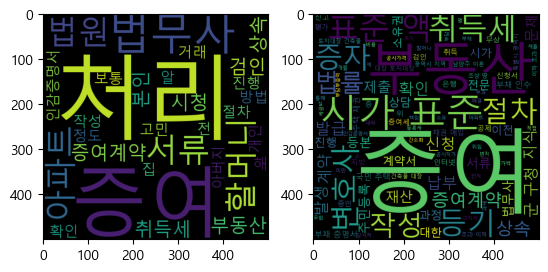

['할머니', '아파트', '증여', '법원', '서류', '처리', '방법', '증여계약', '검인', '취득세', '확인', '인감증명서', '서류', '정도', '알', '시청', '처리', '전', '진행', '절차', '할머니', '아파트', '거래', '부동산', '개인', '증여', '보통', '법무사', '처리', '해', '부동산', '본인', '법무사', '고민', '처리', '법무사', '아버지', '집', '상속', '증여', '처리', '상속', '증여', '법무사', '증여계약', '본인', '작성', '시청', '검인', '취득세', '법원', '처리']
['매매', '절세', '자금', '입증', '증여', '증여', '직접', '관할', '등기', '소', '부근', '법무사', '사무실', '위임', '증여', '필요', '서류', '등기', '의무', '증여', '인감증명서', '인감도장', '주민등록', '초본', '주소', '이력', '사항', '포함', '등기', '필증', '부채', '증명서', '부채', '등기', '권리자', '증자', '주민등록', '등본', '도장', '부동산', '등기부', '등본', '증여', '확인', '부채', '인수', '공통', '증여계약', '증여', '절차', '증여계약', '작성', '증여계약', '원본', '사본', '만듭니', '부채', '증명서', '발급', '증여', '확인', '작성', '수증', '부동산', '부채', '부채', '증명서', '증여', '확인', '증인', '증여', '부채', '인수', '채권자', '부채', '증명서', '발급', '증인', '증여', '부채', '인수', '부채', '인수', '취지', '증여', '확인', '증인', '작성', '증여계약', '검인', '군', '구청', '군', '구청', '지적', '증여', '계약서', '제출', '검인', '취득세', '고지서', '발급', '군', '구청', '군', '구청', '무과', '

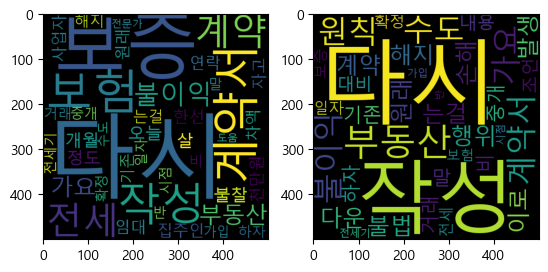

['전세', '개월', '정도', '살', '보증', '보험', '불찰', '계약', '오늘', '집주인', '연락', '임대', '사업자', '보증', '보험', '한선', '다시', '계약서', '자고', '다시', '계약서', '작성', '차액', '천만원', '다시', '계약서', '작성', '불이익', '원래', '계약', '해지', '다시', '작성', '는걸', '기존', '거래', '부동산', '부동산', '하자', '말', '중개', '비', '불이익', '확정', '일자', '다시', '가요', '전세', '보증', '보험', '전세기', '반', '시점', '가입', '수도', '가요', '전문가', '도움']
['다시', '계약서', '작성', '불이익', '다운', '계약서', '작성', '행위', '불법', '이로', '발생', '손해', '수도', '원래', '계약', '해지', '다시', '작성', '는걸', '원칙', '기존', '거래', '부동산', '부동산', '하자', '말', '중개', '비', '불이익', '부동산', '내용', '조언', '대비', '확정', '일자', '다시', '가요', '다시', '전세', '보증', '보험', '전세기', '반', '시점', '가입', '수도', '가요', '원칙']


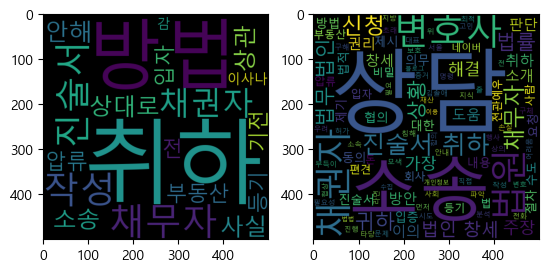

['채무자', '진술서', '작성', '취하', '취하', '방법', '채권자', '상대로', '소송', '취하', '사실', '안해', '상관', '부동산', '압류', '전', '입자', '등기', '기전', '이사나', '감', '방법']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '김솔애', '변호사', '채무자', '진술서', '취하', '어려움', '상황', '해결', '방안', '모색', '채무자', '진술서', '취하', '채권자', '주장', '채권자', '권리', '행사', '진술서', '취하', '동의', '법원', '판단', '법원', '채권자', '주장', '타당', '판단', '진술서', '취하', '허가', '채무자', '의무', '채무자', '법원', '명령', '진술서', '작성', '의무', '채무자', '요청', '취하', '채무자', '진술서', '취하', '위', '방법', '채권자', '협의', '가장', '먼저', '채권자', '직접', '협상', '진술서', '취하', '대한', '합의', '시도', '법원', '이의', '신청', '법원', '진술서', '내용', '이의', '제기', '취하', '요청', '신청', '소송', '부득이', '소송', '제기', '법원', '판단', '구해', '수도', '소송', '소송', '필요성', '채권자', '협의', '법원', '대한', '이의', '신청', '귀하', '권리', '침해', '우려', '소송', '소송', '내용', '소송', '귀하', '주장', '입증', '증거', '제시', '채권자', '주장', '입증', '변호사', '도움', '소송', '법적', '절차', '변호사', '도움', '취하', '부동산', '압류', '부동산', '압류', '재산', '상의', '손실', '초래', '입자', '등기', '전', '입자', '등기', '상황', '라면', '진술서', '취하', '필요', '수도',

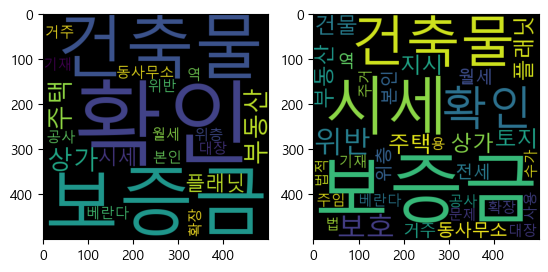

['상가', '주택', '부동산', '플래닛', '확인', '시세', '동사무소', '보증금', '역', '확인', '월세', '보증금', '본인', '위층', '거주', '베란다', '확장', '공사', '위반', '건축물', '건축물', '대장', '기재']
['상가', '주택', '부동산', '플래닛', '확인', '시세', '토지', '시세', '건물', '시세', '지시', '보증금', '동사무소', '보증금', '역', '확인', '월세', '보증금', '전세', '보증금', '본인', '위층', '거주', '베란다', '확장', '공사', '위반', '건축물', '건축물', '대장', '기재', '위반', '건축물', '주임', '법', '주거', '용', '사용', '법적', '보호', '수가', '시세', '보증금', '보증금', '보호', '문제']


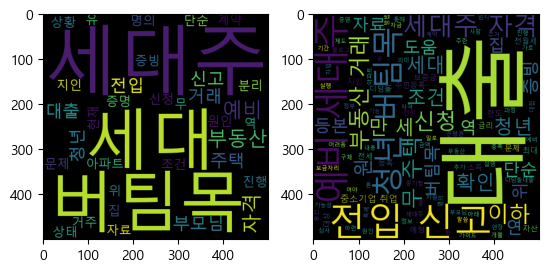

['청년', '버팀목', '대출', '무', '주택', '조건', '세대', '분리', '상황', '현재', '유', '주택', '부모님', '세대', '거주', '지인', '집', '전입', '신고', '세대주', '부동산', '거래', '단순', '전입', '신고', '문제', '부동산', '거래', '역', '부동산', '진행', '계약', '증명', '부모님', '명의', '아파트', '세대', '원인', '상태', '예비', '세대주', '자격', '청년', '버팀목', '신청', '예비', '세대주', '자격', '증빙', '위', '자료', '예비', '세대주', '자격', '버팀목', '대출']
['청년', '버팀목', '대출', '지인', '집', '전입', '신고', '세대주', '단순', '전입', '신고', '부동산', '거래', '전입', '신고', '문제', '전입', '신고', '세대주', '등록', '부동산', '거래', '역', '부동산', '거래', '역', '단순', '전입', '신고', '예비', '세대주', '자격', '청년', '버팀목', '전세', '대출', '신청', '예비', '세대주', '자격', '예비', '세대주', '청년', '버팀목', '대출', '신청', '예비', '세대', '주란', '대출', '실행', '일로', '개월', '세대', '대합', '가로', '세대주', '예정', '사람', '의미', '증빙', '자료', '예비', '세대주', '자격', '증빙', '위', '주민등록', '등본', '세대주', '예정', '자임', '확인', '자료', '전입', '신고', '세대주', '등록', '주민등록', '등본', '대출', '가능성', '예비', '세대주', '자격', '청년', '버팀목', '대출', '대출', '심사', '과정', '무', '주택', '조건', '충족', '세대주', '세대', '전원', '무', '주택', '여야', '정보', '도움', '추가', '말씀', '도움', '

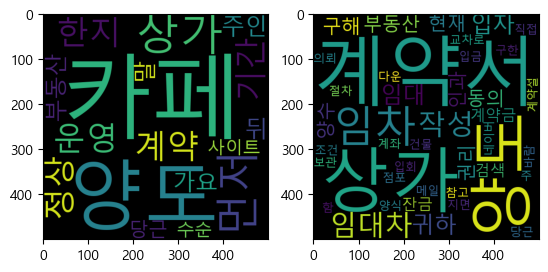

['카페', '운영', '한지', '계약', '기간', '카페', '정상', '양도', '카페', '상가', '주인', '먼저', '뒤', '부동산', '말', '가요', '당근', '상가', '양도', '사이트', '먼저', '수순']
['상가', '양도', '양수', '절차', '임대', '임차', '구해', '현재', '임대차', '조건', '점포', '양도', '동의', '건물', '주', '동의', '당근', '교차로', '부동산', '의뢰', '입자', '구한', '입자', '구해', '지면', '임차', '인과', '상가', '권리', '양도', '계약서', '작성', '양도', '양수', '계약서', '작성', '귀하', '입회', '임차', '인과', '임대', '상가', '임대차', '계약서', '작성', '임차', '양도', '계약서', '계약금', '잔금', '귀하', '직접', '임차', '상가', '임대차', '계약서', '계약금', '잔금', '임대', '계좌', '입금', '함', '부동산', '입자', '귀하', '네이버', '검색', '상가', '권리', '계약서', '상가', '임대차', '계약서', '양식', '검색', '다운', '현재', '보관', '임대차', '계약설', '참고', '작성', '작성', '메일', '바람']


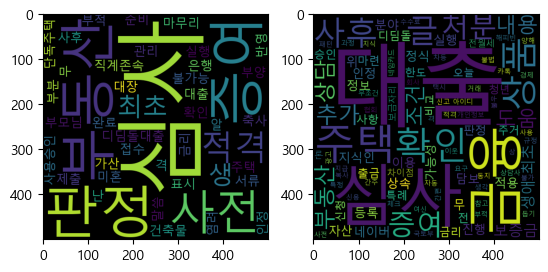

['생', '최초', '디딤돌대출', '미혼', '직계존속', '부양', '사전', '심사', '적격', '판정', '은행', '준비', '서류', '제출', '마무리', '부모님', '증여', '부동산', '알', '부동산', '건축물', '관리', '대장', '확인', '단독주택', '축사', '표시', '사용승인', '증여', '무', '주택', '인정', '불가능', '말씀', '사전', '심사', '증여', '부동산', '반영', '부분', '적격', '판정', '난', '접수', '대출', '실행', '완료', '사후', '심사', '부적', '격', '판정', '가산', '금리', '염려']
['상속', '처분', '생애', '최초', '증여', '처분', '생애', '최초', '추가', '아이디', '확인', '택시', '지급', '해피빈', '불우', '이웃', '돕기', '사용', '네이버', '지식', '상담', '카톡', '경제', '분야', '지식인', '부동산', '담보', '대출', '금융', '상품', '담보', '대출', '분야', '위', '금융', '상담', '내용', '정보', '내용', '신용', '금융', '거래', '패턴', '차등', '적용', '네이버', '지식인', '이용', '규정', '특정', '회사', '개인정보', '양해', '대출', '진행', '불법', '수수료', '요구', '금융', '정식', '등록', '상담사', '여신', '금융', '협회', '정식', '등록', '체크', '자산', '심사', '과정', '간편', '심사', '사전', '심사', '심사', '사후', '심사', '생각', '증여', '주택', '국토부', '상', '주택', '간주', '대출', '실행', '불가', '가능성', '상속', '동지', '처분', '무', '주택', '생애', '최초', '조건', '인정', '추가', '상담', '네임카드', '참고', '자동', '복사', '글', '무조건', '광고', '글'

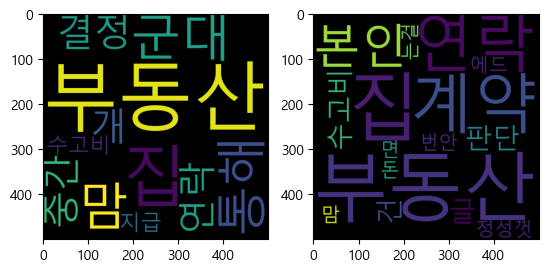

['부동산', '군대', '통해', '집', '부동산', '군대', '맘', '중간', '부동산', '통해', '집', '개', '부동산', '집', '맘', '부동산', '집', '결정', '연락', '수고비', '지급']
['본인', '판단', '수고비', '건', '부동산', '글', '정성껏', '집', '집', '계약', '연락', '번안', '연락', '부동산', '맘', '에드', '는걸', '계약', '면', '돈']


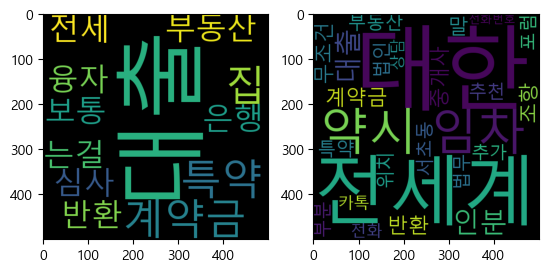

['전세', '대출', '부동산', '계약금', '반환', '특약', '보통', '특약', '집', '대출', '는걸', '융자', '집', '대출', '계약금', '은행', '심사']
['대한', '전세계', '약시', '임차', '인분', '대출', '계약금', '반환', '조항', '무조건', '중개사', '말', '부동산', '추천', '특약', '서초동', '위치', '법무', '법인', '포럼', '부분', '추가', '전화', '카톡', '상담', '전화번호']


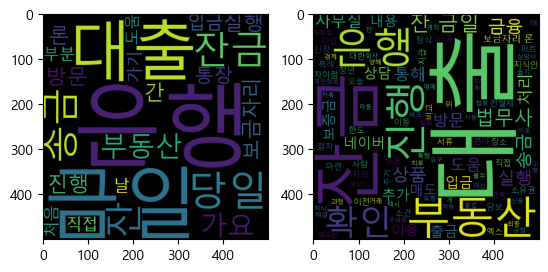

['보금자리', '론', '대출', '진행', '금일', '당일', '은행', '방문', '은행', '잔금', '송금', '잔', '금일', '당일', '부동산', '간', '은행', '대출', '실행', '통장', '입금', '직접', '송금', '가요', '잔', '금일', '날', '부동산', '가기', '은행', '잔금', '가요', '처음', '부분', '도움']
['잔', '금일', '은행', '연락', '잔', '금일', '장소', '확인', '잔', '금일', '장소', '은행', '법무사', '직접', '최종', '잔금', '처리', '실행', '본인', '계좌', '입금', '직접', '잔금', '치루', '게', '법무사', '처리', '추가', '아이디', '확인', '택시', '지급', '해피빈', '불우', '이웃', '돕기', '사용', '네이버', '지식', '상담', '카톡', '경제', '분야', '지식인', '부동산', '담보', '대출', '금융', '상품', '담보', '대출', '분야', '위', '금융', '상담', '내용', '정보', '내용', '신용', '금융', '거래', '패턴', '차등', '적용', '네이버', '지식인', '이용', '규정', '특정', '회사', '개인정보', '양해', '대출', '진행', '불법', '수수료', '요구', '금융', '정식', '등록', '상담사', '여신', '금융', '협회', '정식', '등록', '체크', '아파트', '매매', '잔', '금일', '대한', '궁금증', '해결', '잔', '금일', '보금자리', '론', '대출', '통해', '진행', '과정', '은행', '방문', '잔', '금일', '당일', '은행', '방문', '대출', '실행', '요청', '은행', '대출', '실행', '출금', '귀하', '통장', '입금', '부동산', '방문', '은행', '출금', '입금', '부동산', '사무실', '이동', '부동산', '사무실', '매

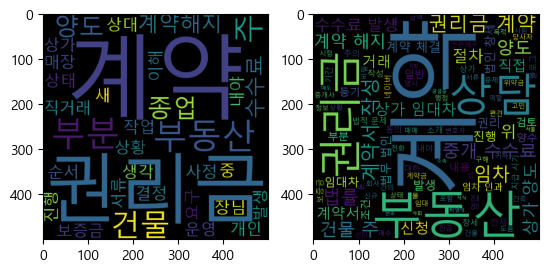

['매장', '운영', '개인', '사정', '종업', '양도', '직거래', '권리금', '상태', '상황', '양도', '결정', '부동산', '서류', '작업', '부분', '상대', '권리금', '부동산', '계약해지', '건물', '주', '보증금', '건물', '주', '새', '계약', '계약', '순서', '생각', '종업', '장님', '중', '상가', '계약', '권리금', '계약', '부동산', '요구', '수수료', '발생', '부분', '이해', '건물', '주', '계약해지', '부동산', '진행', '수수료', '내야', '부분', '권리금', '계약', '부분']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '박영재', '변호사', '상가', '양도', '발생', '궁금증', '상가', '양도', '절차', '부동산', '역할', '일반', '상가', '양도', '절차', '매도', '매수', '간의', '직접', '협상', '권리금', '인수', '조건', '협의', '계약', '체결', '부동산', '중개사', '개입', '계약서', '작성', '법률', '검토', '등기', '신청', '전반', '절차', '건물', '주', '계약', '해지', '신규', '계약', '기존', '계약', '해지', '임차', '인과', '계약', '체결', '부동산', '역할', '계약서', '작성', '양도인', '양수', '간의', '계약', '조건', '계약서', '작성', '법률', '검토', '계약', '내용', '법적', '문제', '검토', '법률', '자문', '구합', '등기', '신청', '등기', '소', '방문', '소유권', '이전', '등기', '신청', '행정', '절차', '서류', '작성', '제출', '행정', '절차', '대행', '부동산', '수수료', '부동산', '중개', '수수료', '일반', '매매', '금액', '일정', '비율', '지급', 

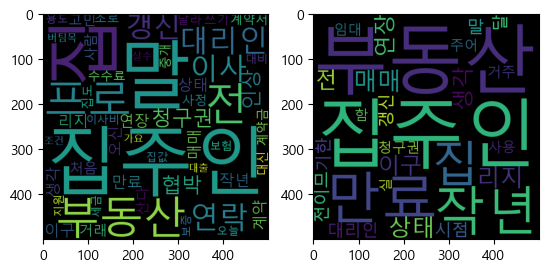

['만료', '집주인', '작년', '집', '매매', '부동산', '리지', '상태', '이구', '전', '연장', '생각', '집주인', '대리인', '부동산', '말', '집', '오신', '계약', '연락', '전', '집', '이사', '고민', '처음', '거래', '부동산', '연락', '갱신', '청구권', '말', '집주인', '대리인', '말', '집', '산다', '사람', '계약서', '쓰기', '전', '계약금', '조로', '사정', '달라', '이사', '집도', '중개', '수수료', '대신', '이사비', '용도', '지원', '오늘', '집주인', '말', '세금', '프로', '인상', '집값', '대비', '프로', '보증', '보험', '버팀목', '대출', '협박', '협박', '갱신', '청구권', '조건', '살수', '프로', '인상', '가요']
['만료', '집주인', '작년', '집', '매매', '부동산', '리지', '상태', '이구', '전', '연장', '생각', '집주인', '대리인', '부동산', '말', '시점', '기한', '달', '전이므', '갱신', '청구권', '사용', '임대', '실', '거주', '주어', '함']


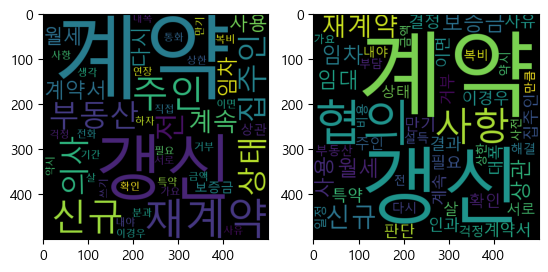

['계약', '기간', '부동산', '전화', '계약', '집주인', '의사', '생각', '주인', '분과', '직접', '통화', '의사', '연장', '상태', '주인', '전', '계약', '계속', '하자', '재계약', '계약서', '다시', '쓰기', '이경우', '임차', '계약', '갱신', '사용', '필요', '계약서', '확인', '특약', '사항', '임차', '계약', '갱신', '사용', '계약', '갱신', '집주인', '월세', '보증금', '대폭', '사유', '재계약', '거부', '재계약', '만기', '이면', '계속', '살', '주인', '서로', '상태', '갱신', '부동산', '갱신', '재계약', '계약', '신규', '다시', '걱정', '신규', '약시', '복비', '내야', '신규', '계약', '보증금', '월세', '전', '계약', '상관', '금액', '상한', '상관', '가요']
['이경우', '임차', '계약', '갱신', '사용', '필요', '임대', '인과', '협의', '결정', '사항', '계약서', '확인', '특약', '사항', '임차', '계약', '갱신', '사용', '계약', '갱신', '집주인', '월세', '보증금', '대폭', '사유', '재계약', '거부', '협의', '결과', '판단', '재계약', '만기', '이면', '계속', '살', '주인', '서로', '상태', '갱신', '부동산', '갱신', '재계약', '계약', '신규', '다시', '걱정', '임대', '설득', '해결', '신규', '약시', '복비', '내야', '일정', '비용', '부담', '만큼', '사전', '협의', '사항', '신규', '계약', '보증금', '월세', '전', '계약', '상관', '금액', '상한', '상관', '가요']


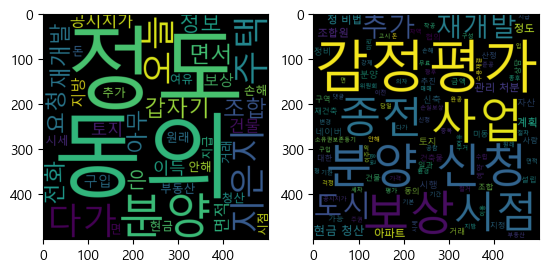

['지은지', '다가', '주택', '오늘', '갑자기', '조합', '면서', '재개발', '동의', '요청', '전화', '아무', '정보', '은', '이득', '면적', '토지', '공시지가', '정도', '건물', '보상', '지방', '구입', '부동산', '시세', '원래', '거래', '정도', '분양', '추가', '돈', '여유', '분양', '동의', '안해', '동의', '손해', '현금', '청산', '면', '지급', '정도', '시점']
['면적', '토지', '공시지가', '정도', '건물', '보상', '다가', '건축물', '토지', '대한', '감정평가', '건축물', '대한', '감정평가', '지방', '구입', '부동산', '시세', '원래', '거래', '정도', '종전', '감정평가', '사업', '시행', '시점', '감정평가', '도시', '정', '비법', '재개발', '재건축', '추진', '절차', '기본', '계획', '수립', '정비', '구역', '지정', '공람', '정비', '구역', '지정', '추진', '위원회', '구성', '조합', '설립', '사업', '시행', '종전', '감정평가', '시점', '분양', '신청', '종후', '감정평가', '시점', '신축', '아파트', '관리', '처분', '이주', '철거', '착공', '준공', '아파트', '완공', '관리', '처분', '변경', '이전', '고시', '소유권보존등기', '사람', '일과', '재개발', '사업', '종전', '자산', '감정평가', '산정', '시점', '네이버', '도시', '정', '비법', '관리', '처분', '계획', '항', '사업', '시행', '계획', '분양', '추가', '돈', '여유', '분양', '추가', '걱정', '세차', '익', '조합원', '분양', '향후', '신축', '아파트', '거래', '차액', '미리', '반영', '가격', '입', '주권', '매매', '동의', '안

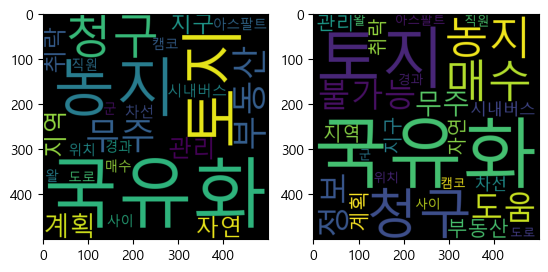

['무주', '부동산', '국유화', '농지', '국유화', '계획', '관리', '지역', '자연', '취락', '지구', '토지', '시내버스', '차선', '아스팔트', '도로', '농지', '사이', '위치', '국유화', '토지', '청구', '매수', '청구', '캠코', '직원', '왈', '경과', '군']
['국유화', '토지', '매수', '청구', '불가능', '도움', '정보', '무주', '부동산', '국유화', '농지', '국유화', '계획', '관리', '지역', '자연', '취락', '지구', '토지', '시내버스', '차선', '아스팔트', '도로', '농지', '사이', '위치', '국유화', '토지', '청구', '매수', '청구', '캠코', '직원', '왈', '경과', '군']


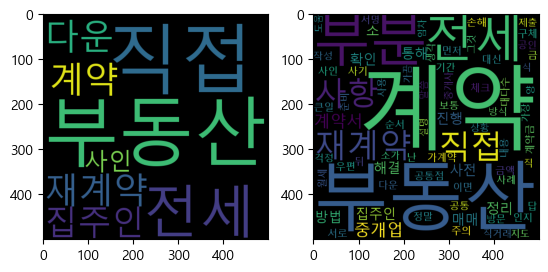

['전세', '재계약', '다운', '계약', '부동산', '집주인', '직접', '부동산', '사인', '직접']
['전세', '재계약', '다운', '계약', '부동산', '집주인', '직접', '부동산', '사인', '직접', '보통', '전세', '재계약', '사항', '서로', '우편', '방법', '사항', '대신', '사전', '계약서', '내용', '금액', '부분', '기간', '부분', '체크', '부동산', '전세', '월세', '계약', '주의', '사항', '사기', '부동산', '계약', '공통점', '순서', '구체', '사전', '확인', '확인', '먼저', '가계약', '금', '계약금', '뒤', '큰일', '난', '인지', '해결', '부분', '이면', '정말', '해결', '손해', '대다수', '답', '공통', '부분', '정리', '매매', '직거래', '공인', '중개사', '통해', '생각', '지도', '매매', '직', '부동산', '중개업', '소', '통해', '계약', '진행', '집주인', '임차', '직접', '계약서', '작성', '중개업', '소', '계약서', '준비', '양', '서명', '중개업', '소가', '정리', '제출', '방식', '부동산', '식', '계약', '사례', '걱정', '방문', '상황', '설명', '진행', '도움', '계약', '가장', '그것', '말씀', '방법', '가끔', '사용', '재계약']


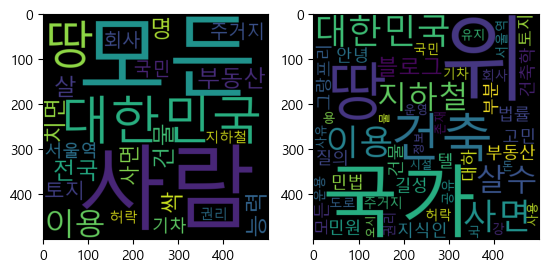

['사람', '전국', '모든', '부동산', '싹', '살', '능력', '사람', '명', '치면', '대한민국', '모든', '땅', '건물', '토지', '사면', '주거지', '회사', '대한민국', '국민', '서울역', '기차', '이용', '지하철', '이용', '허락', '땅', '권리']
['안녕', '건축학', '위', '부동산', '건축', '위', '건축', '민원', '위', '민법', '위', '법률', '위', '고민', '위', '지식인', '길성', '그랑프리', '텔', '위', '질의', '부분', '대하', '대한민국', '모든', '땅', '건물', '토지', '사면', '주거지', '회사', '대한민국', '국민', '서울역', '기차', '이용', '지하철', '용', '허락', '땅', '권리', '지하철', '국가', '운용', '이용', '도로', '강', '국가', '살수', '국', '공유', '유지', '사면', '사유', '사용', '국가', '존재', '국가', '땅', '국가', '운영', '시설', '물', '돈', '살수', '블로그', '오시', '정보', '블로그']


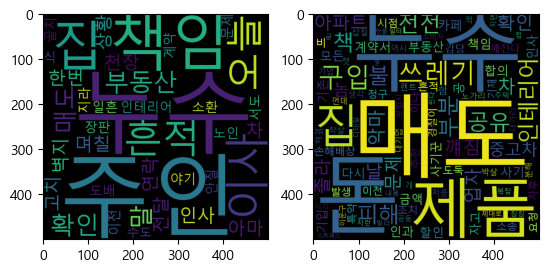

['이사', '며칠', '집', '인사', '차', '누수', '천장', '누수', '흔적', '아마', '주인', '고치', '한번', '벽지', '전달', '오늘', '부동산', '연락', '주인', '누수', '말', '흔적', '누수', '주인', '부동산', '매도', '집', '확인', '이사', '상황', '인테리어', '오늘', '도배', '장판', '책임', '소환', '이전', '주인', '책임', '집', '일흔', '노인', '누수', '야기', '확인', '계약', '서도', '책임', '지라', '식', '말', '골치', '주인', '문제', '매도', '책임', '안질', '수도']
['인테리어', '사기', '피해', '공유', '카페', '인테리어', '사기꾼', '공유', '인사', '공', '책', '모든', '책', '기존', '매도', '매도', '전전', '매도', '인과', '합의', '매도', '책임', '금액', '할인', '부동산', '계약서', '다시', '자고', '부분', '기입', '손해배상', '청구', '소송', '시점', '이전', '전전', '누수', '흔적', '누수', '부분', '조치', '요청', '차후', '비', '누수', '발생', '매도', '특약', '기재', '추천', '도둑', '집', '불', '아파트', '집', '불', '이나', '집', '피해', '돈', '꺠진다', '날', '감당', '함', '경칠이', '노가리', '차', '렌트', '햇', '차', '개', '작살', '돈', '꺠짐', '박살', '역시', '돈', '날', '기업', '제품', '쓰레기', '구입', '돈', '제품', '삽질', '쓰레기', '생각', '껀데', '제품', '확인', '적', '처음', '확인', '제품', '분해', '문제', '대기업', '보험사', '대가리', '쓰레기', '해결', '소비자', '돈', '꺠짐', '졸라', '저런', '내용', '누수', '졸라', '

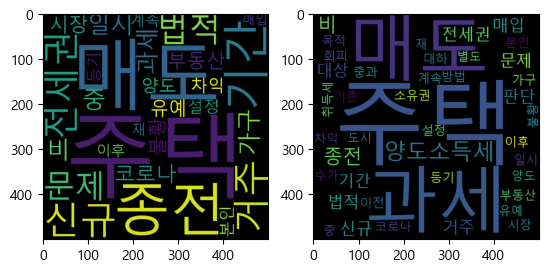

['일시', '가구', '주택', '비', '과세', '기간', '중', '종전', '주택', '매도', '코로나', '부동산', '시장', '불황', '종전', '주택', '매도', '유예', '기간', '양도', '차익', '신규', '주택', '전세권', '설정', '등기', '본인', '전세권', '계속', '거주', '매도', '법적', '문제', '이후', '종전', '주택', '매도', '거주', '신규', '주택', '재', '매입', '법적', '문제']
['일시', '가구', '주택', '비', '과세', '기간', '중', '종전', '주택', '매도', '코로나', '부동산', '시장', '불황', '종전', '주택', '매도', '유예', '기간', '양도', '차익', '신규', '주택', '전세권', '설정', '등기', '본인', '전세권', '계속', '거주', '매도', '법적', '문제', '양도소득세', '과세', '대상', '이후', '종전', '주택', '매도', '거주', '신규', '주택', '재', '매입', '법적', '문제', '매입', '취득세', '중과', '대상', '도시', '양도소득세', '비', '별도', '판단', '양도소득세', '회피', '목적', '소유권', '이전', '비', '과세', '기존', '주택', '대하', '양도소득세', '과세', '수가', '방법', '판단']


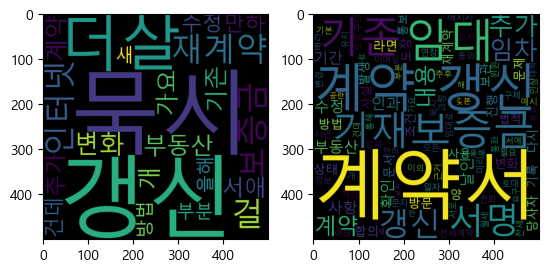

['묵시', '갱신', '더살', '재계약', '인터넷', '걸', '보증금', '변화', '부동산', '개', '가요', '기존', '계약', '서애', '추가', '수정', '만하', '건데', '부분', '을해', '방법', '새']
['전세계약', '묵시', '갱신', '재계약', '보증금', '변화', '부동산', '다시', '방문', '계약', '갱신', '계약', '갱신', '구체', '방법', '기존', '계약서', '확인', '기존', '계약서', '상태', '라면', '토대', '보증금', '임대', '기간', '임대', '임차', '기본', '정보', '다시', '확인', '계약서', '모든', '항목', '양', '이의', '확인', '계약', '갱신', '의사', '합의', '임대', '인과', '임차', '계약', '갱신', '동의', '사실', '문서', '문자', '메시지', '이메일', '전화', '통화', '기록', '서면', '기존', '계약서', '추가', '사항', '기재', '보증금', '임대료', '변경', '계약서', '작성', '필요', '기존', '계약서', '계약', '갱신', '내용', '기재', '아래', '추가', '기재', '예시', '갱신', '일자', '갱신', '내용', '계약', '양', '당사자', '합의', '조건', '연장', '임대', '서명', '날인', '임차', '서명', '날인', '계약서', '날인', '계약서', '추가', '사항', '임대', '인과', '임차', '서명', '도장', '도장', '서명', '진행', '계약', '라면', '서명', '계약서', '보관', '추가', '수정', '계약서', '임대', '인과', '임차', '부', '보관', '문서', '추후', '문제', '발생', '법적', '근거', '사용', '주의', '사항', '계약', '갱신', '임대', '보증금', '월세', '인상', '미리', '통보', '통보', '계약', '갱신', '진행', 

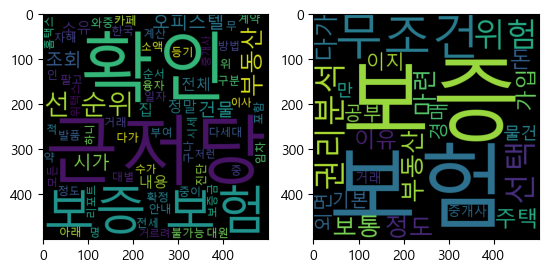

['전세', '자해', '발품', '팔고', '부동산', '카페', '보증', '보험', '정말', '다세대', '정말', '다가', '구나', '오피스텔', '와중', '아래', '구분', '보증', '보험', '무', '융자', '선', '순위', '근저당', '선', '순위', '소액', '임차', '포함', '확인', '위', '순서', '집', '오피스텔', '약', '대별', '등기', '전체', '건물', '명', '소유', '중', '보증', '보험', '불가능', '근저당', '정도', '건물', '진단', '리포트', '시가', '조회', '근저당', '선', '순위', '부동산', '안내', '계약', '확정', '일자', '부여', '대원', '보증금', '확인', '계산', '시가', '근저당', '선', '순위', '건물', '시가', '조회', '방법', '오피스텔', '전체', '인', '소유', '중이', '거래', '적', '홈택스', '위택스', '한국', '부동산', '시세', '조회', '내용', '확인', '보증', '보험', '모든', '집', '거르려', '하니', '이사', '수가', '중개사', '저런', '내용', '확인']
['부동산', '무조건', '정도', '위험', '마련', '보증', '보험', '무조건', '보증', '보험', '보통', '다가', '주택', '가입', '권리분석', '이유', '돈', '이지', '보증', '보험', '외면', '선택', '경매', '공부', '권리분석', '기본', '위험', '물건', '선택', '만', '중개사', '거래']


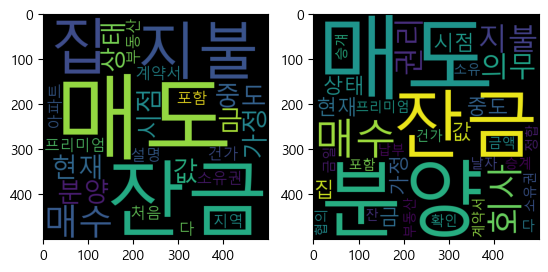

['현재', '중도', '금', '지불', '잔금', '상태', '시점', '분양', '매도', '가정', '매도', '집', '값', '프리미엄', '포함', '잔금', '매도', '잔금', '지불', '소유권', '매수', '건가', '부동산', '매도', '매수', '다', '계약서', '잔금', '지역', '아파트', '집', '매도', '처음', '설명']
['현재', '중도', '금', '지불', '잔금', '상태', '시점', '분양', '매도', '가정', '매도', '집', '값', '프리미엄', '포함', '잔금', '매도', '잔금', '지불', '소유권', '매수', '건가', '매도', '분양', '회사', '납부', '금액', '매수', '분양', '회사', '권리', '의무', '승계', '분양', '소유', '부동산', '매도', '매수', '다', '계약서', '잔금', '분양', '회사', '권리', '의무', '승걔', '날자', '확인', '매도', '매수', '협의', '잔', '금일', '정합']


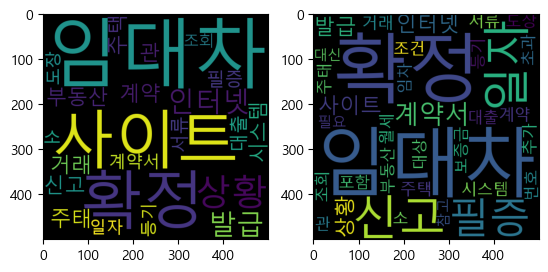

['주태', '임대차', '계약', '부동산', '거래', '관', '시스템', '사이트', '주택', '임대차', '신고', '확정', '필증', '상황', '대출', '서류', '임대차', '계약서', '확정', '일자', '도장', '인터넷', '등기', '소', '사이트', '조회', '인터넷', '발급', '상황', '발급']
['주태', '임대차', '계약', '부동산', '거래', '관', '시스템', '사이트', '주택', '임대차', '신고', '확정', '필증', '상황', '대출', '서류', '임대차', '계약서', '확정', '일자', '도장', '인터넷', '등기', '소', '사이트', '조회', '인터넷', '발급', '상황', '발급', '임대차', '계약서', '확정', '일자', '계약서', '임차', '조건', '보증금', '월세', '초과', '임대차', '신고', '대상', '신고', '필증', '확정', '일자', '번호', '포함', '추가', '확정', '일자', '필요', '참고', '신고', '필증', '대신']


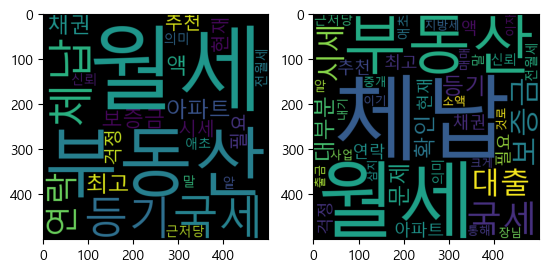

['부동산', '연락', '아파트', '월세', '채권', '최고', '액', '보증금', '월세', '추천', '시세', '현재', '걱정', '필요', '월세', '근저당', '부동산', '말', '신뢰', '국세', '체납', '등기', '애초', '등기', '의미', '전월세', '국세', '체납', '알']
['부동산', '연락', '아파트', '월세', '채권', '최고', '액', '대출', '보증금', '월세', '추천', '시세', '현재', '걱정', '필요', '월세', '근저당', '부동산', '말', '신뢰', '국세', '체납', '등기', '애초', '등기', '의미', '전월세', '국세', '체납', '알', '국세', '지방세', '체납', '확인', '중개', '부동산', '장님', '통해', '확인', '사업', '대부분', '체납', '체납', '대부분', '소액', '이기', '문제', '보증금', '대출', '월세', '것로', '출금', '이자', '내기', '매매', '시세', '크게', '문제', '삼지']


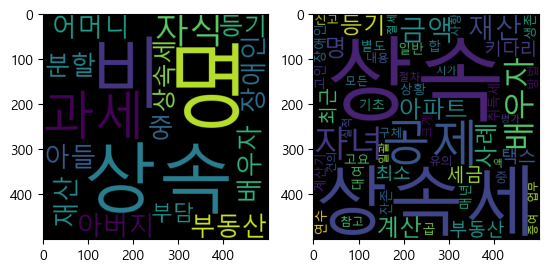

['아버지', '어머니', '아들', '명', '상속', '배우자', '비', '과세', '자식', '명', '중', '장애인', '명', '자식', '비', '과세', '상속', '재산', '부동산', '분할', '등기', '상속세', '부담']
['상황', '일반', '상속세', '등기', '취득세', '별도', '고요', '아파트', '상속세', '계산', '사례', '배우자', '자녀', '상속세', '계산기', '상속', '재산', '아파트', '상속세', '계산', '사례', '배우자', '자녀', '자녀', '중', '금액', '공제', '명', '기초', '공제', '자녀', '명', '합', '장애인', '자녀', '대여', '잔존', '연수', '매년', '곱', '금액', '금액', '상속', '재산', '부동산', '고인', '배우자', '생존', '상속세', '신고', '방법', '세금', '크게', '유의', '구체', '내용', '사항', '참고', '상속', '모든', '상속', '절차', '상속세', '절세', '상속', '등기', '최근', '키다리', '택스', '상속', '증여', '세금', '최소', '업무', '실적', '키다리', '택스', '최근', '건의', '상속', '부동산', '상속', '공제', '배우자', '공제', '최소', '일괄', '공제', '공제', '상속', '재산', '평가', '액', '시가', '상속세']


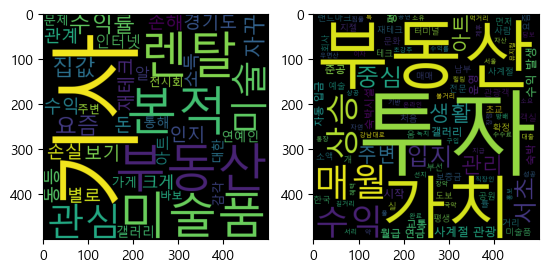

['수익률', '요즘', '집값', '자꾸', '기사', '부동산', '경기도', '재테크', '돈', '보기', '손해', '본적', '인지', '수익', '손실', '동등', '관계', '별로', '소득', '크게', '인터넷', '알', '아트', '갤러리', '통해', '미술품', '렌탈', '기사', '연예인', '관심', '가게', '문제', '미술', '감각', '미술', '대한', '관심', '전시회', '본적', '미술품', '렌탈', '주변', '부동산', '바보']
['사계절', '관광', '숙박', '지젤', '움', '소액', '투자', '수익', '발생', '관리', '평생', '월급', '연금', '매월', '자동', '입금', '부동산', '가치', '상승', '입지', '투자', '매월', '수익', '교통', '생활', '문화', '예술', '중심', '초교', '남부', '터미널', '도보', '거리', '서초', '강남대로', '부선', '자연', '녹지', '기반', '서리', '풀', '공원', '부선', '상공', '우면산', '방배', '공원', '먹거리', '볼거리', '길거리', '힐링', '부동산', '상승', '가치', '재테크', '성공', '입지', '한국', '랜드마크', '서초', '중심', '사계절', '관광객', '짐풀', '서울', '주변', '교통', '입지', '특', '장점', '준공', '완료', '생활', '숙박시설', '투자', '약', '평', '담보', '구입', '실', '투자', '소요', '보증금', '대출', '이자', '수익률', '소유', '부동산', '자산', '가치', '관리', '매월', '월급', '연금', '통장', '자동', '입금', '직장인', '부동산', '투자', '초강추', '수익', '발생', '혜택', '매월', '확정', '수익', '보증금', '선지', '운영', '수수료', '제후', '지급', '전문', '운영', '관리', '온라인', '홍보

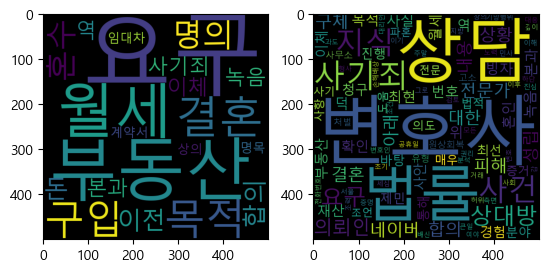

['결혼', '목적', '부동산', '구입', '명의', '월세', '요구', '혼수', '요구', '이전', '합의', '요구', '돈', '부동산', '사기죄', '녹음', '본과', '이체', '역', '임대차', '계약서', '상의', '월세', '요구', '명목']
['네이버', '지식', '상담', '변호사', '최현', '덕', '의뢰인', '사건', '깊이', '이해', '진심', '법률', '전문가', '의뢰인', '권리', '노력', '공휴일', '주말', '상담', '의뢰인', '번호', '확인', '사기죄', '성립', '위', '상대방', '허위', '사실', '여야', '그로', '재산', '상의', '피해', '부동산', '거래', '결혼', '목적', '초기', '합의', '이후', '상대방', '조건', '요구', '요구', '증명', '혼인', '빙자', '기망행위', '사안', '이기', '녹음', '본과', '이체', '역', '구체', '상황', '과도', '월세', '요구', '사실', '혼인', '빙자', '사기죄', '성립', '손해배상', '청구', '배신', '감', '큰일', '대응', '하단', '전화번호', '통해', '형사', '사건', '민사', '사건', '대한', '경험', '조력', '변호인', '법률', '대리인', '법률', '분야', '경험', '의뢰인', '최선', '변호사', '세심', '분석', '바탕', '사건', '모든', '측면', '검토', '변호사', '최현', '덕', '변호사', '네이버', '지식', '지식', '전문가', '서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '제민', '변호사', '현재', '상황', '매우', '문제', '말씀', '내용', '대한', '법적', '해석', '상대방', '결혼', '목적', '부동산', '구입', '합의', '내용', '월세', '요구', '혼수', '요구', '사기죄', '간주'

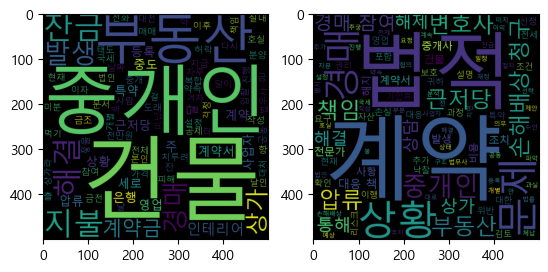

['상가', '건물', '호실', '부동산', '중개', '계약금', '백', '지불', '특약', '항', '은행', '근저당', '설정', '잔', '금전', '해결', '계약금', '지불', '달', '중도', '금', '천만원', '인테리어', '허락', '지불', '이후', '실내', '인테리어', '잔금', '치루려', '계약', '부동산', '법인', '건물', '주', '중개인', '근저당', '잔금', '국세', '미납', '압류', '상황', '발생', '복합', '건물', '미분', '상가', '전체', '압류', '계약금', '중도', '금조', '지급', '인테리어', '약', '발생', '터', '걸', '세로', '계약서', '사업자', '등록', '영업', '달', '해결', '겨자', '먹기', '세로', '계약서', '중개인', '사업자', '등록', '영업', '달이', '해결', '중개인', '건물', '주', '다시', '대전', '상가', '건물', '분양', '날', '해결', '매매', '계약', '상황', '은행', '츨', '현재', '잔금', '지불', '이자', '발생', '발생', '피해', '본인', '잔금', '공제', '부동산', '중개인', '특약', '문서', '작성', '날인', '약속', '날짜', '도래', '건물', '전화', '태도', '중개인', '법무사', '차후', '경매', '경매', '참여', '사람', '가격', '입찰', '경매', '걱정', '공동', '상가라', '개별', '경매', '진행', '부동산', '중개인', '책임', '대처', '젛을']
['현재', '상황', '법적', '재정', '문제', '포함', '법적', '대응', '상황', '사항', '대응', '책', '근저당', '설정', '문제', '잔금', '미지', '불', '법인', '건물', '주가', '약속', '대로', '근저당', '해결', '추가', '국세', '체납', '압류', '발생', '상황'

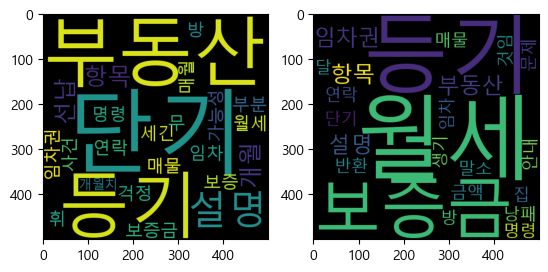

['방', '단기', '월세', '매물', '연락', '부동산', '등기', '설명', '부동산', '임차권', '등기', '명령', '임차', '보증금', '항목', '설명', '항목', '걱정', '부분', '개월', '단기', '무', '보증', '세긴', '사건', '휘', '가능성', '개월', '선납', '매월', '개월치', '선납']
['방', '단기', '월세', '매물', '연락', '부동산', '등기', '설명', '부동산', '임차권', '등기', '명령', '임차', '보증금', '항목', '설명', '항목', '보증금', '반환', '임차권', '등기', '말소', '집', '금액', '낭패', '것임', '보증금', '월세', '문제', '생기', '월세', '달', '안내']


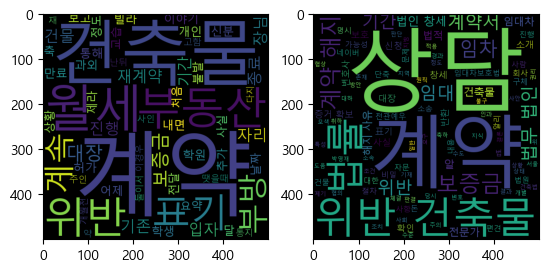

['빌라', '월세', '부방', '개인', '과외', '교습', '계약', '만료', '추가', '계약', '날짜', '재계약', '학생', '학원', '계약', '진행', '기존', '자리', '계약', '월세', '내면', '입자', '계속', '어제', '자리', '부방', '신분', '계약', '부동산', '이야기', '통해', '진행', '입자', '계약', '건축물', '대장', '건물', '축', '대장', '위반', '건축물', '표기', '부방', '허가', '제라', '계약', '불발', '전달', '부동산', '부동산', '부동산', '장님', '보증금', '계약', '종료', '보고', '위반', '건축물', '표기', '재계약', '계약', '기간', '월세', '계속', '위반', '건축물', '사실', '계속', '월세', '달', '정도', '상황', '보증금', '요약', '월세', '계약', '건물', '건축물', '대장', '건축물', '위반', '표기', '처음', '위반', '건축물', '표기', '부동산', '장님', '땟을때', '표기', '고함', '재', '약', '난뒤', '이경우', '보증금', '기존', '계약', '종료', '주인', '둘이서', '계약', '사인', '개월전', '통지', '계약', '기간', '다지']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '박영재', '변호사', '위반', '건축물', '임대차', '계약', '해지', '보증금', '반환', '대하', '위반', '건축물', '임대차', '계약', '해지', '보증금', '반환', '원칙', '해지', '가능성', '일반', '건축물', '대장', '위반', '사항', '기재', '건물', '건축법', '위반', '임대차', '계약', '해지', '사유', '임대', '임차', '위반', '사실', '알리', '임차', '계약', '해지', '보증금', '임대차보호법', '적용

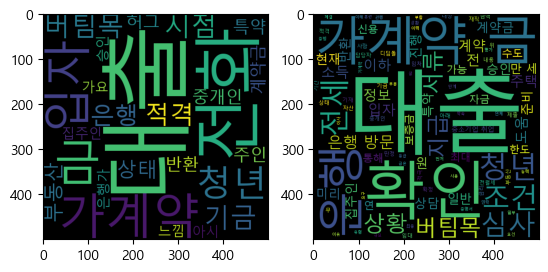

['청년', '버팀목', '대출', '시점', '기금', '적격', '은행', '상태', '대출', '부동산', '중개인', '전화', '가계약', '금', '주인', '입자', '전화', '특약', '허그', '대출', '계약금', '반환', '가계약', '금', '입자', '집주인', '가요', '은행가', '대출', '승인', '느낌', '아시']
['청년', '버팀목', '전세', '대출', '내용', '이해', '기금', '적격', '판정', '은행', '방문', '전', '단계', '부동산', '중개인', '가계약', '금', '연락', '혼란', '상황', '가계약', '금', '일반', '가계약', '금은', '임대', '지급', '임차', '임대', '가계약', '금', '지급', '계약', '체결', '금액', '계약금', '일부', '사용', '일반', '관행', '현재', '살', '입자', '가계약', '금', '지급', '상황', '수도', '현재', '입자', '이사', '위', '조건', '집주인', '가계약', '금', '요구', '집주인', '입자', '가계약', '금', '먼저', '지급', '가계약', '금', '약속', '수도', '부분', '부동산', '중개인', '이유', '확인', '집주인', '현재', '입자', '가계약', '금', '지급', '가계약', '금', '지급', '확인', '은행', '대출', '확정', '기금', '적격', '판정', '은행', '최종', '대출', '심사', '대출', '확정', '은행', '방문', '서류', '제출', '은행', '담당자', '상담', '통해', '대출', '가능', '확인', '은행', '대출', '심사', '사항', '신용', '상태', '신용', '등급', '연체', '이력', '확인', '소득', '재직', '소득', '증빙', '서류', '재직', '증명서', '통해', '상환', '능력', '평가', '주택', '요건', '임차', '주택', '전세',

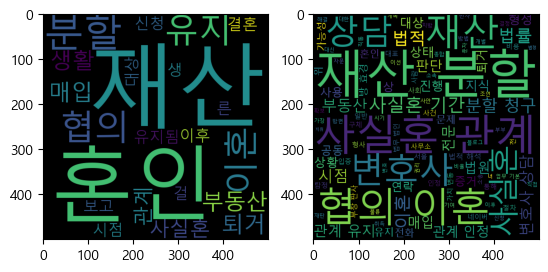

['부동산', '매입', '협의', '이혼', '협의', '이혼', '퇴거', '혼인', '생활', '유지', '퇴거', '혼인', '생활', '유지', '매입', '부동산', '사실혼', '재산', '분할', '대상', '협의', '이혼', '재산', '분할', '신청', '혼인', '관계', '른', '재산', '분할', '사실혼', '유지됨', '혼인', '관계', '유지', '걸', '보고', '결혼', '이후', '생', '재산', '시점', '재산', '분할']
['협의', '이혼', '재산', '분할', '신청', '시점', '이후', '기본', '재산', '분할', '청구', '사실혼', '관계', '유지', '법원', '인정', '가능성', '사실혼', '관계', '유지', '판단', '혼인', '관계', '법적', '지위', '재산', '분할', '사실혼', '관계', '법정', '판단', '변호사', '상담', '구체', '상황', '논의', '가장', '법률', '사무소', '상담', '법적', '절차', '토대', '문제', '해결', '사설', '업체', '비용', '합리', '연락', '불륜', '증거', '사람', '흥신소', '의뢰', '비용', '탐정', '사무소', '탐정', '비용', '상', '소송', '상', '녀', '상', '남', '불륜', '탐정', '심부름', '센터', '간통죄', '외도', '증거', '수집', '이혼소송', '상', '녀', '소송비용', '지식', '법률', '상담', '진행', '정진', '변호사', '상담', '전용', '회선', '대법원', '판례', '변경', '판', '예측', '판사', '사람', '판단', '가능성', '확신', '신가', '서초동', '교대역', '앞', '법무', '법인', '올해', '이혼', '전문', '변호사', '상담', '서류', '작성', '재판', '참석', '직접', '담당', '변호사', '선임', '변호사', '경력', '업무', '분야',

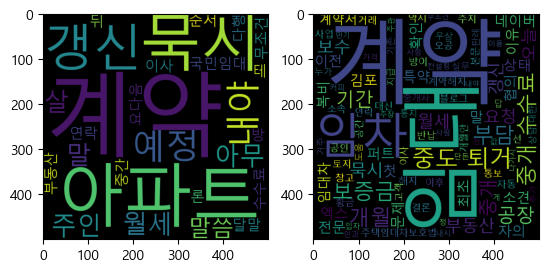

['말', '아파트', '계약', '월세', '살', '주인', '아무', '말씀', '묵시', '갱신', '국민임대', '아파트', '순서', '달말', '이사', '예정', '다행', '방', '계약', '요다음', '뒤', '계약', '예정', '부동산', '연락', '테', '수수료', '내야', '론', '묵시', '갱신', '계약', '중간', '내야', '무조건']
['오늘', '공장', '선', '결론', '중개', '수수료', '임대', '주택임대차보호법', '첫', '임대차', '계약', '이후', '묵시', '갱신', '임차', '임대', '계약해지', '통보', '개월', '자동', '해지', '방이', '말', '개월안', '임대', '보증금', '반납', '본문', '부동산', '말', '첫', '임대차', '약시', '계약', '기간', '이사', '중개', '수수료', '임대', '대신', '임차', '중개', '수수료', '주지', '김포', '오늘', '공장', '네이버', '블로그', '김포', '오늘', '공장', '오공', '공장', '창고', '토지', '거래', '전문', '고객', '사업', '공간', '연락', '황금', '부동산', '중개', '소속', '공인', '중개사', '우상', '묵시', '갱신', '임차', '통지', '특약', '확인', '중개', '보수', '부담', '누가', '실무', '계약', '기간', '부담', '계약', '기간', '판례', '기존', '거주', '중개', '보수', '부담', '특약', '중개', '보수', '지급', '도움', '확인', '추가', '대한', '답', '상담', '전문', '부동산', '컨설팅', '네이버', '엑스', '퍼트', '이용', '자의', '엑스', '퍼트', '가격', '단돈', '커피', '잔', '값', '자의', '주관', '소견', '사람', '소견', '묵시', '정', '갱신', '상태', '중도', '퇴거', '요청', '개월'

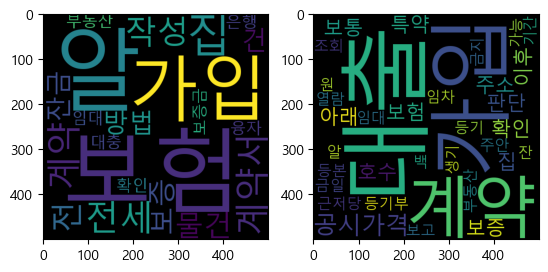

['전세', '계약', '계약서', '작성', '전', '물건', '보증', '보험', '가입', '알', '방법', '보험', '잔금', '가입', '건', '알', '부동산', '보험', '집', '확인', '은행', '집', '보증금', '임대', '융자', '대충', '알']
['계약', '집', '주소', '호수', '등기부', '등본', '열람', '근저당', '확인', '대출', '확인', '계약', '집', '주소', '호수', '알', '공시가격', '조회', '대출', '공시가격', '원', '아래', '보증', '보험', '가입', '가능', '보통', '판단', '대출', '백', '아래', '계약', '가입', '보통', '부동산', '등기', '보고', '공시가격', '판단', '가입', '특약', '임차', '잔', '금일', '이후', '주안', '보증', '보험', '가입', '임대', '기간', '대출', '금지', '특약', '대출', '이후', '대출', '생기', '가입']


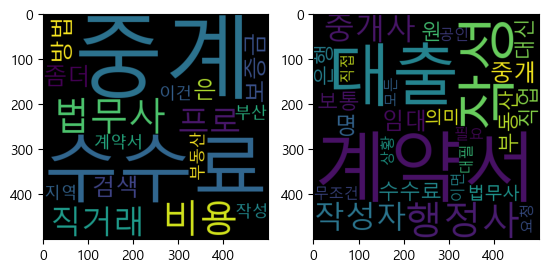

['중계', '수수료', '직거래', '법무사', '비용', '은', '보증금', '중계', '수수료', '프로', '검색', '프로', '법무사', '비용', '중계', '수수료', '직거래', '법무사', '좀더', '방법', '계약서', '부동산', '작성', '이건', '비용', '지역', '부산']
['계약서', '작성자', '임대', '명', '작성', '중개', '수수료', '원', '보통', '부동산', '계약서', '대신', '작성', '직업', '행정사', '은행', '대출', '법무사', '행정사', '계약서', '의미', '대출', '무조건', '공인', '중개사', '계약서', '필요', '대출', '행정사', '대필', '요청', '중개사', '대출', '계약서', '상황', '이면', '작성자', '직접', '작성', '모든']


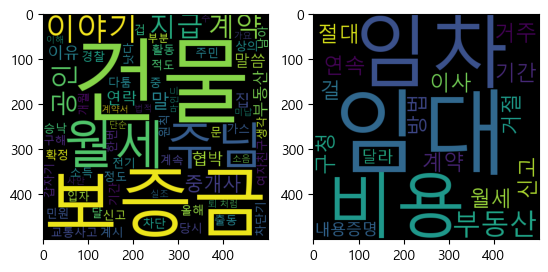

['계약', '올해', '확정', '계약', '당시', '보증금', '월세', '지급', '교통사고', '소득', '활동', '이유', '달', '월세', '지급', '월세', '지급', '건물', '주님', '이야기', '건물', '주님', '승낙', '여자친구', '집', '다툼', '정도', '한번', '건물', '주민', '경찰', '신고', '출동', '적도', '계속', '건물', '주님', '민원', '건물', '주님', '부동산', '공인', '중개사', '상의', '갑자기', '연락', '말', '공인', '중개사', '연락', '말씀', '계시', '문', '전기', '차단기', '가스', '차단', '협박', '이야기', '이야기', '중', '보증금', '겁', '계약', '기간', '개월', '남아', '원칙', '입자', '구해', '말씀', '보증금', '낫다', '생각', '말', '집', '부분', '계약서', '처럼', '월세', '미납', '단순', '소음', '퇴', '실조', '부동산', '공인', '중개사', '협박', '말', '건물', '주', '마인드', '이해', '법적', '사안', '이유', '이야기', '보증금', '가요']
['월세', '연속', '걸', '임대', '거주', '임차', '절대', '임대', '계약', '기간', '이사', '비용', '임차', '거절', '방법', '구청', '부동산', '부동산', '신고', '내용증명', '비용', '달라']


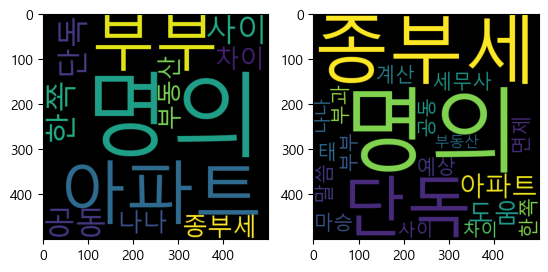

['아파트', '부부', '공동', '명의', '한쪽', '단독', '명의', '사이', '종부세', '차이', '나나', '부동산']
['마승', '태', '세무사', '종부세', '계산', '아파트', '단독', '명의', '명의', '예상', '도움', '명의', '종부세', '면제', '단독', '명의', '종부세', '부과', '도움', '말씀', '아파트', '부부', '공동', '명의', '한쪽', '단독', '명의', '사이', '종부세', '차이', '나나', '부동산']


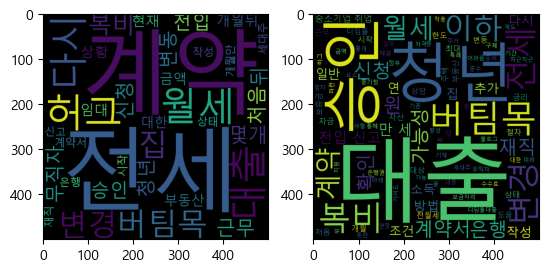

['현재', '근무', '무직자', '허그', '버팀목', '집', '월세', '계약', '개월뒤', '전세', '변경', '허그', '대출', '임대', '월세', '계약', '몇개', '뒤', '전세', '계약', '다시', '상황', '부동산', '복비', '대한', '변동', '처음', '복비', '금액', '계약서', '다시', '작성', '복비', '무직자', '상태', '대출', '다시', '근무', '시작', '전세', '변동', '청년', '허그', '버팀목', '신청', '재직', '승인', '월세', '계약', '개월안', '전세', '변경', '은행', '승인', '전입', '집', '몇개', '뒤', '다시', '집', '전입', '신고', '대출', '신청', '세대주', '변경', '처음', '월세', '전세', '계약', '청년', '허그', '버팀목', '대출']
['청년', '허그', '버팀목', '대출', '부동산', '복비', '변동', '월세', '계약', '전세', '변경', '부동산', '중개', '수수료', '복비', '대한', '변동', '일반', '계약서', '작성', '추가', '복비', '발생', '기존', '계약서', '변경', '사항', '기재', '방법', '계약서', '작성', '일반', '처음', '복비', '계약서', '다시', '작성', '추가', '복비', '가능성', '재직', '대출', '승인', '가능성', '무직자', '상태', '대출', '승인', '재직', '다시', '근무', '시작', '대출', '승인', '가능성', '청년', '버팀목', '자금', '대출', '재직', '상태', '소득', '요소', '작용', '재직', '근무', '시작', '대출', '신청', '승인', '가능성', '월세', '계약', '전세', '변경', '은행', '승인', '월세', '계약', '개월', '전세', '변경', '대출', '신청', '은행', '승인', '전입', '신고', '절차', '

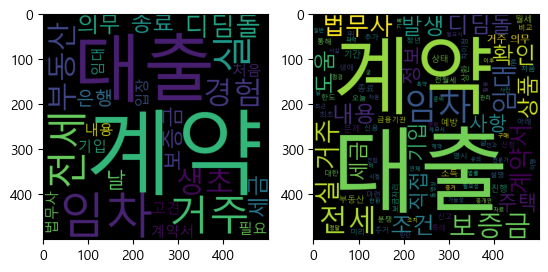

['부동산', '계약', '경험', '생초', '디딤돌', '대출', '실', '거주', '의무', '실', '거주', '날', '전세', '계약', '임차', '세금', '대출', '계약', '종료', '보증금', '임차', '임차', '전세', '대출', '은행', '계약', '계약서', '내용', '기입', '법무사', '계약', '필요', '처음', '임대', '입장', '고견']
['생애', '최초', '디딤돌', '대출', '주택', '구매', '실', '거주', '의무', '이행', '전세', '실', '거주', '전세', '계약', '시점', '실', '거주', '의무', '기간', '날', '전세', '계약', '디딤돌', '대출', '실', '거주', '조건', '이후', '전세', '대한', '제약', '임차', '전세', '대출', '상환', '임차', '세금', '대출', '계약', '종료', '임대', '임차', '직접', '보증금', '반환', '임차', '금융기관', '직접', '상환', '계약서', '기입', '사항', '계약서', '임차', '대출', '사실', '계약', '종료', '금융기관', '보증금', '직접', '상환', '내용', '명시', '발생', '분쟁', '예방', '위', '조치', '법무사', '계약', '필요성', '전세', '계약', '일반', '부동산', '중개인', '통해', '진행', '법무사', '선임', '계약', '내용', '법률', '자문', '판단', '법무사', '계약', '추가', '임대', '사항', '유의', '임차', '신용', '확인', '임차', '신용', '상태', '확인', '월세', '보증금', '연체', '가능성', '미리', '파악', '계약', '조건', '명확', '계약', '기간', '월세', '보증금', '관리', '비', '계약', '조건', '명시', '특약', '사항', '계약서', '기입', '주택', '상태', '점검', '임대', '주택', '상태',

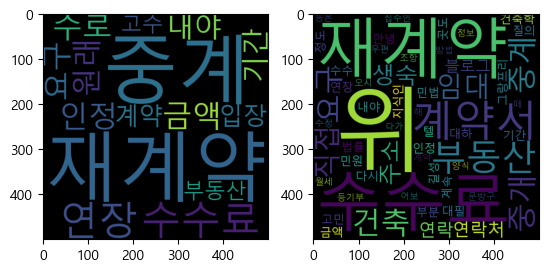

['원래', '재계약', '금액', '인정', '재계약', '중계', '수로', '요구', '내야', '중계', '수수료', '기간', '재계약', '연장', '입장', '중계', '수수료', '연장', '계약', '부동산', '고수']
['안녕', '건축학', '위', '부동산', '건축', '위', '건축', '민원', '위', '민법', '위', '법률', '위', '고민', '위', '지식인', '길성', '그랑프리', '텔', '위', '질의', '부분', '대하', '금액', '인정', '재계약', '중계', '수수', '요구', '내야', '중계', '수수료', '기간', '재계약', '연장', '재계약', '중개', '수수료', '계약서', '다시', '대필', '부동산', '정도', '계약서', '곳도', '중개', '수수료', '계속', '요구', '문방구', '계약', '양식', '다가', '임대', '집주인', '조항', '월세', '수정', '직접', '방법', '계약서', '생숙', '임대', '주소', '연락처', '직접', '연락', '연락처', '생숙', '등기부', '등본', '떼', '어보', '주소', '우편', '연락', '해', '블로그', '오시', '정보', '블로그']


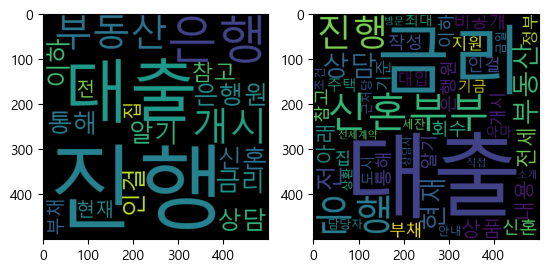

['부동산', '개시', '은행원', '통해', '상담', '진행', '신혼', '대출', '금리', '알기', '이하', '인걸', '진행', '참고', '현재', '집', '부채', '은행', '대출', '은행', '진행', '전', '진행']
['신혼부부', '상품', '금리', '아래', '금리', '내용', '신혼부부', '전세', '대출', '금리', '비공개', '회수', '작성', '전', '부동산', '개시', '은행원', '통해', '상담', '진행', '신혼', '대출', '금리', '알기', '이하', '인걸', '진행', '참고', '현재', '집', '부채', '은행', '대출', '은행', '진행', '전', '진행', '대출', '정부', '지원', '신혼부부', '대출', '금리', '대입', '은행', '대출', '금리', '현재', '기준', '주택', '도시', '기금', '신혼부부', '대출', '최대', '금리', '아마', '담당자', '신혼부부', '대출', '은행', '대출', '안내', '세잔', '금일', '근저당', '상환', '조건', '전세계약', '부동산', '소개', '대출', '상담사', '직접', '은행', '방문', '대출', '상담']


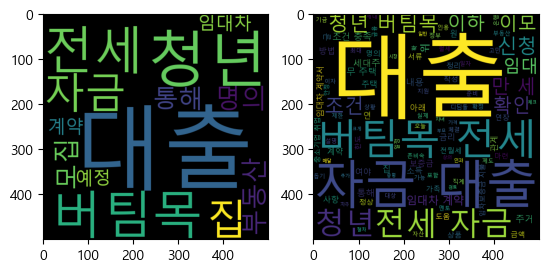

['청년', '버팀목', '전세', '자금', '대출', '집', '명의', '모집', '대출', '부동산', '통해', '임대차', '계약', '예정', '대출']
['청년', '버팀목', '전세', '자금', '대출', '조건', '충족', '임대차', '계약', '임대', '인과', '차주', '관계', '직계', '존비속', '부모', '자녀', '임대', '대출', '이모', '직계', '존비속', '일반', '대출', '부동산', '통해', '임대차', '계약', '작성', '이모', '계약', '실제', '정상', '임대차', '계약', '증명', '위', '보증금', '월세', '조건', '시장', '가격', '크게', '임대차', '계약서', '상의', '내용', '검토', '추가', '대출', '조건', '충족', '확인', '아래', '사항', '체크', '버팀목', '전세', '자금', '대출', '조건', '절차', '버팀목', '전세', '자금', '대출', '조건', '이자', '연장', '정리', '버팀목', '전세', '자금', '대출', '매달', '월세', '만', '전세', '계약', '대부분', '일정', '금액', '대출', '보증금', '생각', '사회생활', '한지', '정도', '지나', '목돈', '마련', '막', '돈', '독립', '시작', '나이', '대의', '청년', '라면', '금액', '이자', '이용', '제도', '버팀목', '자금', '대출', '오늘', '글', '버팀목', '대출', '청년', '우대', '버팀목', '대출', '설명', '작성자', '임대', '조건', '제한', '내용', '아래', '확인', '버팀목', '전세', '자금', '대출', '주거', '안정', '위', '지원', '중고차', '마스터', '버팀목', '자금', '대출', '정부', '주택', '기금', '금리', '대출', '상품', '근로자', '서민', '주거', '안정', '돕기', '설계', '청년'

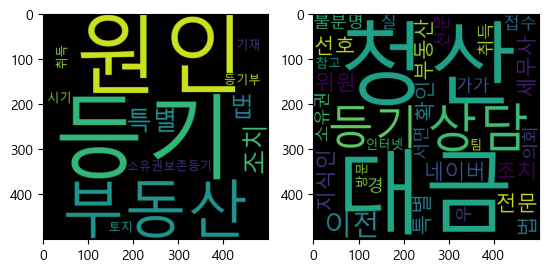

['부동산', '특별', '조치', '법', '소유권보존등기', '토지', '취득', '시기', '등기부', '등기', '원인', '등기', '원인', '기재']
['네이버', '지식인', '전문', '상담', '위원', '선호', '세무사', '부동산', '등기', '특별', '조치', '법', '이전', '대금', '청산', '확인', '대금', '청산', '대금', '청산', '불분명', '경', '우', '소유권', '이전', '등기', '접수', '취득', '가가', '질', '의회', '신문', '서면', '인터넷', '방문', '상담', '팀', '참고']


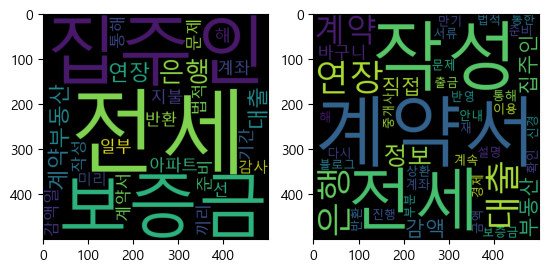

['부동산', '선', '아파트', '전세', '계약', '기간', '집주인', '전세', '연장', '지불', '보증금', '일부', '은행', '대출', '계약', '은행', '집주인', '전세', '대출', '반환', '계좌', '은행', '전세', '연장', '계약서', '작성', '보증금', '보증금', '감액일', '부동산', '통해', '집주인', '끼리', '법적', '문제', '준비', '해', '미리', '감사']
['전세', '연장', '설명', '전세', '대출', '상환', '전세', '만기', '은행', '집주인', '출금', '반환', '계좌', '안내', '대출', '직접', '은행', '연장', '대출', '계속', '이용', '은행', '계약서', '작성', '전세', '연장', '계약서', '다시', '작성', '보증금', '재', '계약서', '작성', '감액', '감액', '금액', '반영', '계약서', '작성', '해', '부동산', '통한', '계약', '집주인', '직접', '계약', '법적', '문제', '부동산', '중개사', '통해', '계약', '진행', '계약서', '작성', '서류', '준비', '부분', '신경', '경제', '정보', '블로그', '확인', '정보', '바구니', '정보', '바구니']


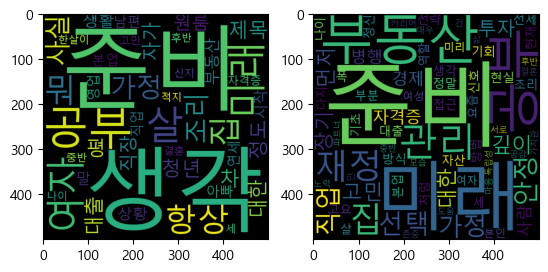

['제목', '살', '미래', '준비', '생각', '청년', '차', '집', '대한', '생각', '항상', '평', '집', '살', '뭐', '자가', '대출', '정도', '원룸', '직장', '생활', '부동산', '공부', '상황', '미래', '공부', '시작', '여자', '가정', '말', '남편', '아빠', '직업', '생각', '본업', '조리', '사실', '조리', '뭐', '영업', '공부', '연세', '준비', '자격증', '한살이', '공부', '세', '사실', '적지', '나이', '준비', '중반', '후반', '살', '항상', '고민', '여자', '미래', '가정', '준비', '신지', '여자', '결혼', '생각']
['세', '미래', '준비', '깊이', '고민', '정말', '미래', '대한', '준비', '방식', '접근', '집', '부동산', '공부', '현실', '부분', '집', '재정', '관리', '먼저', '집', '대한', '생각', '선택', '부동산', '장기', '자산', '공부', '투자', '기회', '대출', '전세', '살', '재정', '관리', '신호', '부동산', '공부', '깊이', '투자', '전략', '직업', '자격증', '직업', '병행', '미래', '안정', '본업', '조리', '부동산', '자격증', '준비', '선택', '고요', '요즘', '처럼', '직업', '병행', '사람', '준비', '장기', '안정', '미래', '선택', '폭', '미래', '가정', '준비', '방법', '가정', '먼저', '경제', '정신', '준비', '현재', '준비', '기초', '다지', '나이', '재정', '관리', '관리', '가정', '역할', '미리', '고민', '준비', '여자', '준비', '여성', '본인', '커리어', '준비', '경제', '독립성', '노력', '결혼', '미래', '마음', '사람', '건', '서로', '가치관', '존

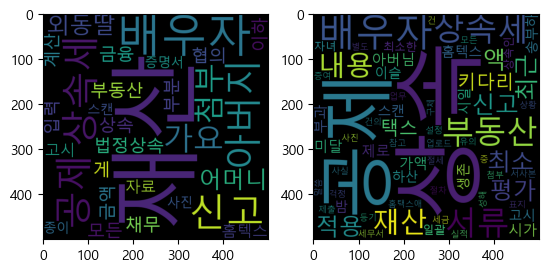

['어머니', '외동딸', '아버지', '법정상속', '부동산', '금융', '재산', '채무', '모든', '재산', '협의', '상속세', '신고', '배우자', '공제', '게', '배우자', '아버지', '상속', '금액', '배우자', '공제', '가요', '상속세', '신고', '부분', '입력', '계산', '재산', '이하', '홈텍스', '고시', '첨부', '자료', '증명서', '종이', '사진', '첨부', '가요', '스캔']
['아버님', '상속', '재산', '배우자', '제로', '공제', '시가', '평가', '상속', '재산', '가액', '미달', '상속세', '부과', '홈텍스', '상속세', '고시', '서류', '스캔', '송부하', '밤', '이슬', '상속', '시일', '배우자', '생존', '하산', '상속', '최소한', '공제', '일괄', '공제', '상속인', '자녀', '서류', '홈택스애', '사진', '업로드', '신고', '서사본', '첨부', '서류', '별도', '신고', '서류', '건', '표지', '성해', '세무서', '제출', '배우자', '공제', '배우자', '상속', '최소', '액', '공제', '말씀', '상황', '배우자', '공제', '적용', '사실', '배우자', '공제', '적용', '상속세', '걱정', '상속', '재산', '부동산', '부동산', '평가', '액', '설정', '유의', '구체', '내용', '내용', '중', '부동산', '내용', '참고', '상속', '모든', '상속', '절차', '상속세', '절세', '상속', '등기', '최근', '키다리', '택스', '상속', '증여', '세금', '최소', '업무', '실적', '키다리', '택스', '최근', '건의', '상속', '부동산']


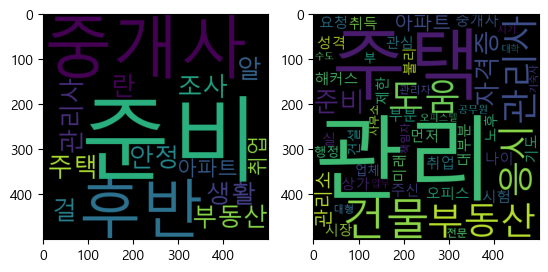

['중개사', '준비', '후반', '부동산', '조사', '주택', '관리사', '란', '걸', '알', '안정', '생활', '준비', '아파트', '취업']
['성격', '상가', '관리', '오피스', '관리', '실', '중개사', '먼저', '취득', '부동산', '취업', '도움', '요청', '해커스', '주택', '관리사', '주신', '부분', '주택', '관리사', '시험', '나이', '제한', '응시', '대부분', '응시', '미래', '준비', '자격증', '노후', '자격증', '불리', '기도', '부동산', '시장', '관심', '준비', '아파트', '관리소', '주택', '건설', '업체', '관리', '부', '행정', '관리자', '대형', '건물', '관리', '사무소', '건물', '관리', '책임자', '주택', '관리', '전문', '공무원', '아파트', '오피스텔', '건물', '대학', '기숙사', '관리소', '업무', '수도', '도움', '시기']


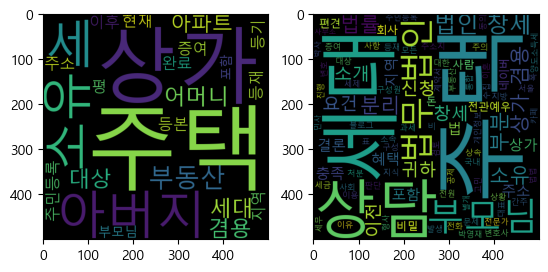

['세대', '주택', '대상', '현재', '주민등록', '등본', '등재', '아버지', '세', '어머니', '세', '세', '아버지', '소유', '부동산', '상가', '겸용', '주택', '상가', '평', '어머니', '소유', '부동산', '아파트', '소유', '부동산', '아파트', '아버지', '상가', '겸용', '주택', '증여', '등기', '완료', '이후', '주소', '지역', '부모님', '세대', '주택', '대상', '상가', '주택', '포함']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '박영재', '변호사', '결론', '귀하', '상가', '겸용', '주택', '증여', '지역', '주소', '이전', '부모님', '세대', '주택', '대상', '이유', '세대', '분리', '귀하', '지역', '주소', '이전', '부모님', '별개', '세대', '세대', '분리', '세대', '주택', '부모님', '주택', '소유', '부모님', '주택', '소유', '세대', '주택', '요건', '충족', '상가', '겸용', '주택', '상가', '겸용', '주택', '주택', '부분', '주택', '포함', '세대', '주택', '요건', '세대', '주민등록', '표', '등재', '세대', '전원', '주택', '소유', '주택', '세대', '구성', '모든', '구성원', '국내', '주택', '소유', '주의', '사항', '상가', '부분', '상가', '부분', '주택', '포함', '상가', '겸용', '주택', '주택', '부분', '주택', '간주', '세대', '분리', '주소지', '이전', '세대', '분리', '세대', '세대', '주택', '공제', '혜택', '세대', '주택', '양도소득세', '비', '과세', '세제', '혜택', '판단', '세무', '전문가', '상담', '결론', '귀하', '상황', '부모님', '세대'

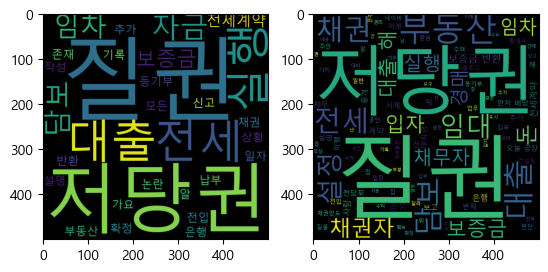

['질권', '저당권', '논란', '모든', '전세', '자금', '대출', '부동산', '담보', '임차', '전세', '보증금', '반환', '채권', '담보', '질권', '자금', '대출', '질권', '등기부', '기록', '추가', '저당권', '실행', '임차', '전세', '대출', '보증금', '납부', '전세계약', '작성', '전입', '신고', '확정', '일자', '저당권', '실행', '은행', '전세계약', '질권', '존재', '알', '실행', '가요', '질권', '저당권', '상황', '설명']
['전', '질권', '뭐', '저당권', '뭐', '설명', '질권', '저당권', '담보물권', '담보', '함', '채무자', '금전', '채무', '불', '이행', '대비', '채권자', '채무', '이행', '확보', '수단', '질권', '설명', '질권', '채권자', '질물', '점유', '채무자', '돈', '질물', '처분', '채권', '변제', '권리', '말', '채무자', '전당포', '시계', '돈', '전당포', '주인', '시계', '점유', '돈', '돈', '간', '사람', '돈', '전당포', '주인', '시계', '처분', '채권', '변제', '질권', '저당권', '채무자', '돈', '등기부', '담보', '내용', '표시', '해', '사용', '수익', '채무자', '채무자', '채무', '불', '이행', '채권자', '부동산', '경매', '처분', '채권', '변제', '저당권', '모든', '전세', '자금', '대출', '부동산', '담보', '임차', '전세', '보증금', '반환', '채권', '담보', '질권', '부동산', '담보', '잡', '수가', '부동산', '임차', '임대', '건데', '남', '부동산', '담보', '잡', '입자', '보증금', '채권', '채권', '보고', '대출', '해', '위', '오타', '난', '전세계약', '임차', '채

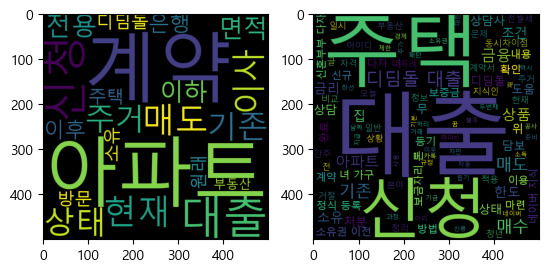

['현재', '아파트', '매도', '계약', '이사', '아파트', '계약', '상태', '기존', '아파트', '주거', '전용', '면적', '이하', '이후', '은행', '디딤돌', '대출', '신청', '방문', '주택', '소유', '원래', '부동산', '계약', '대출', '신청']
['디딤돌', '대출', '기본', '무', '주택', '자만', '신청', '현재', '소유', '아파트', '매도', '아파트', '매수', '과정', '주택', '동시', '소유', '상태', '간주', '대출', '신청', '디딤돌', '대출', '한도', '금리', '신청', '조건', '신혼부부', '다자', '녀', '가구', '디딤돌', '대출', '한도', '금리', '신청', '조건', '신혼부부', '다자', '녀', '가구', '디딤돌', '대출', '신혼부부', '다자', '녀', '가구', '위', '금리', '주택', '담보', '대출', '소득', '조건', '대출', '한도', '금리', '확인', '집', '마련', '꿈', '부동산', '계약', '대출', '신청', '일반', '소유권', '이전', '등기', '완료', '전', '주택', '동시', '소유', '간주', '디딤돌', '대출', '자격', '제한', '기존', '아파트', '매도', '아파트', '대한', '소유권', '이전', '디딤돌', '대출', '신청', '대출', '신청', '위', '기존', '주택', '매도', '계약서', '신규', '주택', '매수', '계약서', '준비', '소유권', '이전', '등기', '완료', '신청', '방법', '처분', '무', '주택', '조건', '신규', '매수', '디딤돌', '신청', '매도', '매수', '날짜', '처리', '신규', '매수', '집', '일시', '주택', '적용', '일반', '주택', '담보', '대출', '주택', '금융', '공사', '보금자리', '론', '이용', '기존', '집

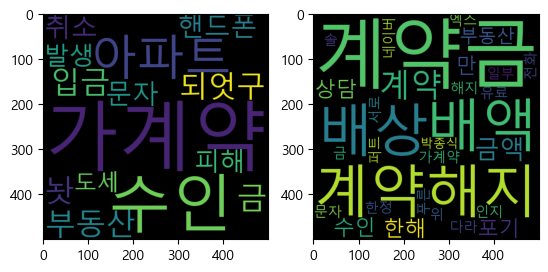

['아파트', '부동산', '놧', '수인', '가계약', '가계약', '금', '입금', '되엇구', '핸드폰', '문자', '가계약', '취소', '피해', '발생', '수인', '도세']
['계약해지', '위', '계약금', '배액', '배상', '수인', '계약금', '수인', '계약해지', '가계약', '금', '계약금', '인지', '계약', '포기', '계약', '금액', '한해', '만', '계약금', '배액', '배상', '포기', '금액', '한정', '다라', '서로', '문자', '계약', '해지', '계약금', '일부', '금액', '한해', '만', '배액', '배상', '계약해지', '상담', '네이버', '엑스', '퍼트', '부동산', '유료', '상담', '전화', '푸른', '솔', '부동산', '박종식']


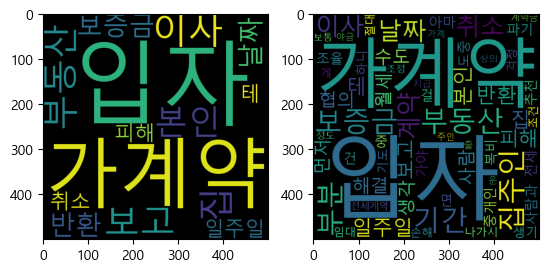

['이사', '집', '보고', '부동산', '본인', '입자', '입자', '가계약', '보증금', '반환', '날짜', '일주일', '입자', '가계약', '취소', '테', '피해']
['이사', '집', '보고', '부동산', '본인', '입자', '입자', '가계약', '보증금', '반환', '날짜', '일주일', '입자', '가계약', '취소', '테', '피해', '가계약', '사람과', '집주인', '아마', '파기', '부분', '집주인', '부동산', '중개인', '협의', '해결', '부분', '먼저', '날짜', '조율', '걸', '추천', '전세', '월세', '기간', '중', '이사', '가야', '면', '보증금', '복비', '입자', '생각', '도중', '수도', '사람', '건', '생기', '기도', '하니', '생각', '계약', '기간', '나가시', '부분', '손해', '걱정', '입자', '임대', '사람', '부분', '해결', '집주인', '계약', '기간', '게', '절대', '조건', '전세계약', '보통', '월세', '계약', '정도', '집주인', '협의', '기간', '조정', '이사', '집', '보고', '부동산', '본인', '입자', '입자', '가계약', '보증금', '반환', '날짜', '일주일', '입자', '가계약', '취소', '테', '피해', '입자', '가계약', '취소', '계약금', '지급', '운', '가계', '야금', '부동산', '상의', '주인', '먼저', '보증금', '줄', '수도']


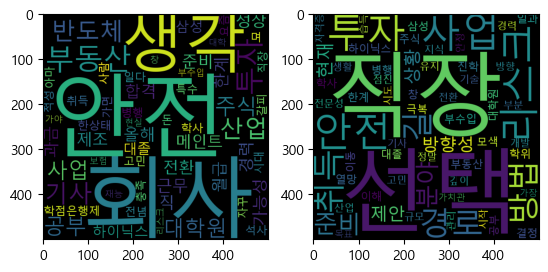

['반도체', '제조', '근무', '산업', '안전', '기사', '준비', '올해', '합격', '경력', '안전', '메인트', '직', '전환', '회사', '성장', '가능성', '월급', '과금', '한계', '하이닉스', '삼성', '대졸', '학점은행제', '학사', '취득', '한상태', '대학원', '석사', '안전', '반도체', '고민', '일다', '며', '특수', '대학원', '병행', '돈', '사업', '부동산', '투자', '주식', '전념', '생각', '자꾸', '갈피', '요즘', '시대', '회사', '회사', '적성', '사람', '사업', '아마', '회사', '가면', '충족', '직장', '주식', '부동산', '투자', '부수입', '창', '대학', '가야', '생각', '보험', '산업', '안전', '기사', '부동산', '투자', '공부', '생각', '리스크', '생각', '현실', '재능', '공부']
['현재', '상황', '방향성', '제안', '직장', '경로', '하이닉스', '삼성', '이동', '대졸', '한계', '극복', '학사', '학위', '취득', '선택', '대학원', '진학', '일과', '병행', '결정', '사업', '투자', '길', '사업', '열망', '직장', '부수입', '창', '방법', '모색', '주식', '부동산', '투자', '공부', '선택', '리스크', '이해', '준비', '안전', '분야', '전문성', '산업', '안전', '기사', '자격증', '취득', '안전', '분야', '경력', '전환', '부분', '준비', '개발', '방향', '기술', '지식', '습득', '정말', '깊이', '고민', '리스크', '관리', '사업', '투자', '리스크', '규모', '시작', '방법', '안정', '직장', '생활', '유지', '점진', '시도', '가치관', '목표', '경로', '선택', '길', '가장']


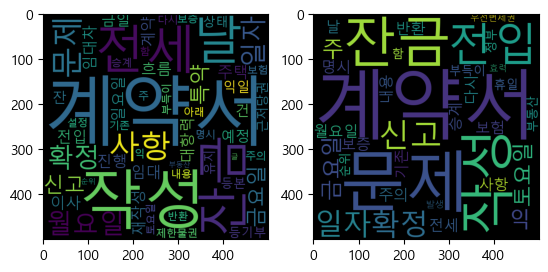

['전세', '계약서', '작성', '대항력', '일요일', '전세', '계약서', '작성', '월요일', '확정', '일자', '주택', '임대차', '계약', '신고', '금요일', '잔금', '이사', '전입', '신고', '계약서', '재작성', '임대', '잔금', '날', '흐름', '진행', '예정', '건', '특약', '사항', '잔', '금일', '익일', '날', '등기부', '등본', '상태', '유지', '근저당권', '제한물권', '설정', '특약', '사항', '아래', '작성', '금요일', '토요일', '문제', '문제', '익', '주', '월요일', '명시', '잔금', '날', '전세', '계약서', '다시', '작성', '주의', '사항', '기존', '계약서', '내용', '승계', '반환', '보증', '보험', '계약서', '부득이', '작성', '함', '부동산', '계약서', '확정', '일자', '순위', '문제', '글']
['금요일', '토요일', '문제', '문제', '익', '주', '월요일', '명시', '잔금', '날', '전세', '계약서', '다시', '작성', '주의', '사항', '기존', '계약서', '내용', '승계', '반환', '보증', '보험', '계약서', '부득이', '작성', '함', '잔금', '휴일', '정부', '전입', '신고', '확정', '일자', '부동산', '계약서', '확정', '일자', '순위', '문제', '전입', '신고', '우선변제권', '효력', '발생']


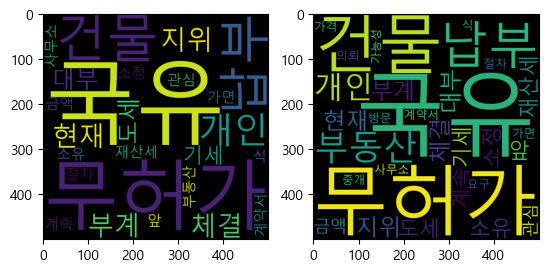

['현재', '국유', '지위', '무허가', '건물', '국유', '부계', '체결', '대부', '납부', '무허가', '건물', '도세', '기세', '재산세', '납부', '앞', '계속', '소유', '소정', '금액', '관심', '부동산', '사무소', '가면', '개인', '개인', '계약서', '식', '절차']
['현재', '국유', '지위', '무허가', '건물', '국유', '부계', '체결', '대부', '납부', '무허가', '건물', '도세', '기세', '재산세', '납부', '앞', '계속', '소유', '소정', '금액', '관심', '부동산', '사무소', '가면', '개인', '개인', '계약서', '식', '절차', '부동산', '방문', '중개', '의뢰', '요구', '가격', '가능성']


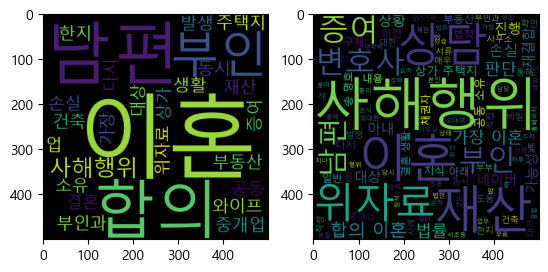

['결혼', '생활', '와이프', '부동산', '중개업', '재산', '남편', '건축', '업', '손실', '발생', '합의', '이혼', '부인과', '남편', '공동', '소유', '상가', '주택지', '위자료', '부인', '합의', '이혼', '동시', '부인', '증여', '사해행위', '이혼', '한지', '다시', '가장', '이혼', '사해행위', '대상']
['지식', '법률', '상담', '진행', '정진', '변호사', '상담', '전용', '회선', '남편', '빚', '상태', '빚', '부인', '이전', '사해행위', '서초동', '교대역', '앞', '법무', '법인', '올해', '변호사', '상담', '서류', '작성', '재판', '참석', '직접', '담당', '변호사', '선임', '변호사', '경력', '업무', '분야', '확인', '상담', '오시', '사무실', '무료', '주차', '부인', '상가', '주택지', '위자료', '이혼', '지나', '사해행위', '대상', '도움', '결혼', '생활', '와이프', '부동산', '중개업', '재산', '남편', '건축', '업', '손실', '발생', '합의', '이혼', '부인과', '남편', '공동', '소유', '상가', '주택지', '위자료', '부인', '합의', '이혼', '동시', '부인', '증여', '사해행위', '이혼', '한지', '다시', '가장', '이혼', '사해행위', '대상', '부인', '부동산', '위자료', '사행', '행위', '다시', '결합', '사해행위', '대상', '도움', '하루', '내용', '결혼', '생활', '와이프', '부동산', '중개업', '재산', '남편', '건축', '업', '손실', '발생', '합의', '이혼', '부인과', '남편', '공동', '소유', '상가', '주택지', '위자료', '부인', '합의', '이혼', '동시', '부인', '증여', '사해행위', '이혼', '한지',

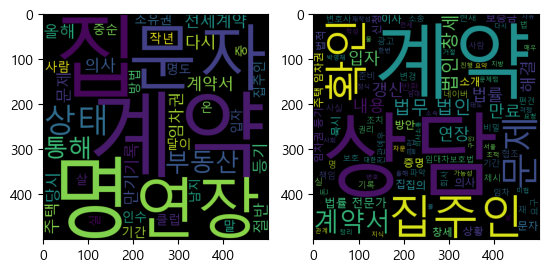

['부동산', '통해', '전세계약', '계약서', '다시', '문자', '연장', '의사', '올해', '계약', '만기', '연장', '문자', '상태', '집', '문제', '주택', '임차권', '등기', '기록', '계약', '당시', '명', '절반', '소유권', '중', '명', '작년', '명', '집', '인수', '상태', '집주인', '중순', '입자', '명도', '집', '온', '사람', '실', '클럽', '말', '살', '계약', '기간', '달이', '남지', '방법']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '박영재', '변호사', '현재', '상황', '매우', '전세', '계약', '문자', '연장', '의사', '올해', '계약', '만료', '이사', '준비', '집주인', '미협', '조적', '태도', '집', '문제', '사실', '걱정', '현재', '상황', '정리', '해결', '방안', '제시', '문제점', '요약', '계약', '연장', '문자', '연장', '의사', '계약서', '재작성', '집주인', '변경', '집주인', '명', '명', '변경', '주택', '임차권', '등기', '기록', '입자', '구인', '집주인', '입자', '계약', '만료', '살', '요구', '집의', '문제', '집', '문제', '가능성', '해결', '방안', '계약', '관계', '확인', '계약서', '재', '확인', '문자', '연장', '의사', '정식', '계약서', '작성', '계약', '기간', '계약서', '다시', '한번', '확인', '법률', '전문가', '자문', '묵시', '갱신', '계약서', '불', '묵시', '갱신', '확인', '묵시', '갱신', '임대', '사유', '계약', '갱신', '거절', '집주인', '의사소통', '내용', '증명', '계약', '만료', '재', '확인', '계약', '기간', '

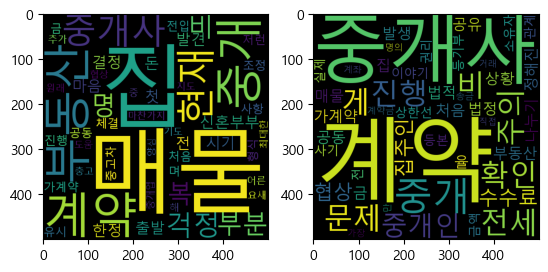

['현재', '신혼부부', '집', '첫', '출발', '돈', '한정', '결정', '시기', '전', '마음', '매물', '발견', '현재', '가계약', '금', '계약', '체결', '전입', '처음', '집', '저런', '사항', '조정', '중개사', '계약', '부동산', '매물', '며', '부동산', '계약', '진행', '걱정', '부분', '부분', '중고차', '공동', '중개', '명', '매물', '유시', '중개', '비', '명', '형식', '부동산', '마찬가지', '중개', '비', '추가', '집', '어른', '복', '중개사', '협상', '최대한', '해', '충고', '복', '원래', '지도', '기도', '요새', '중개업', '중', '양심', '걱정', '도움']
['전세', '계약', '진행', '주의', '중개사', '처음', '집', '중개사', '계약', '진행', '중개사', '부동산', '매물', '공유', '상황', '가계약', '금', '계약', '문제', '확인', '게', '중개', '비', '공동', '중개', '중개', '비', '중개인', '수수료', '나누기', '발생', '법정', '율', '중개', '수수료', '협상', '법적', '정해진', '상한선', '금액', '협상', '중개인', '이야기', '전세', '사기', '주의', '계약', '전', '등기부', '등본', '확인', '집주인', '실제', '소유자', '권리', '관계', '문제', '계약금', '집주인', '명의', '계좌', '직접', '송금', '만', '중개사', '거래', '게', '가장']


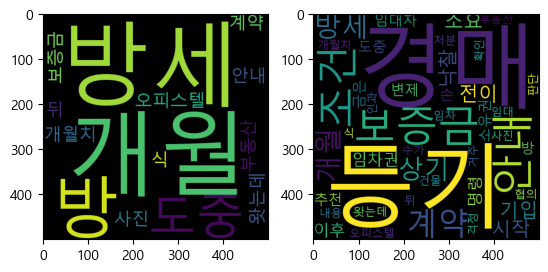

['방', '도중', '오피스텔', '개월치', '방세', '개월', '방세', '안내', '개월', '뒤', '보증금', '식', '부동산', '사진', '왓는데', '계약']
['경매', '등기', '기입', '전이', '경매', '시작', '낙찰', '소요', '임차권', '등기', '명령', '이후', '임대차', '변제', '금은', '보증금', '안내', '조건', '손', '계약', '소유권', '추천', '방', '도중', '오피스텔', '개월치', '방세', '개월', '방세', '안내', '개월', '뒤', '보증금', '식', '부동산', '사진', '왓는데', '계약', '상기', '내용', '건물', '처분', '확인', '수가', '상기', '임차', '조건', '임대', '인과', '협의', '걱정', '거주', '판단']


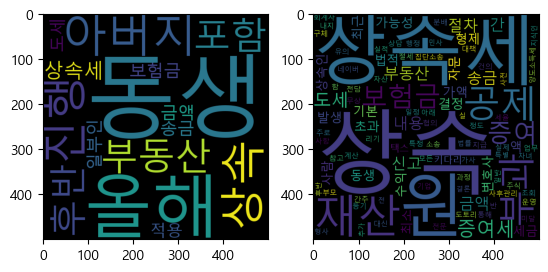

['올해', '아버지', '동생', '상속', '진행', '부동산', '포함', '후반', '상속세', '보험금', '금액', '일부인', '동생', '송금', '도세', '적용']
['상속세', '계산', '상속세', '상속', '재산', '가액', '기본', '공제', '금액', '초과', '부과', '상속세', '기본', '공제', '원', '상속', '재산', '원', '후반', '상속세', '부과', '가능성', '상속', '재산', '가액', '원', '초과', '상속세', '내지', '보험금', '송금', '도세', '보험금', '원', '동생', '송금', '도세', '증여세', '도세', '주로', '부동산', '주식', '자산', '발생', '세금', '증여세', '사람', '사람', '일정', '금액', '재산', '무상', '증여', '부과', '증여', '공제', '부모', '자녀', '간', '원', '공제', '형제', '간', '원', '공제', '원', '형제', '간', '증여', '간주', '원', '원', '원', '증여세', '부과', '세율', '정도', '증여세', '발생', '결론', '상속세', '부과', '가능성', '보험금', '송금', '도세', '증여세', '부과', '추가', '아래', '내용', '통해', '소송', '전문', '변호사', '형사', '민사', '가사', '행정', '집단소송', '기업', '자문', '특별', '대책', '전담', '반', '운영', '네이버', '지식인', '법률', '법적', '자문', '대신', '법적', '결정', '리기', '전', '변호사', '상담', '상속', '공제', '최소', '금액', '상속', '재산', '액', '미달', '함', '상속세', '상속', '보험금', '수익', '상속인', '협의', '수익', '특정', '보험금', '상속인', '분배', '증여', '사전', '증여', '재산', '재산', '상속세', '상속', '상속세', '신

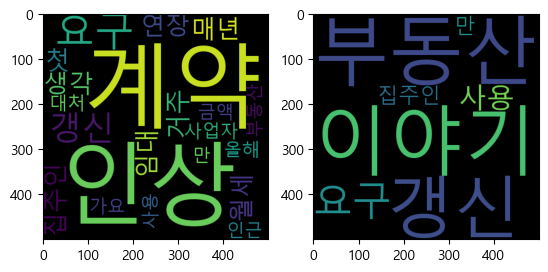

['첫', '월세', '계약', '매년', '인상', '거주', '연장', '계약', '갱신', '요구', '생각', '집주인', '임대', '사업자', '올해', '인상', '금액', '요구', '가요', '인근', '부동산', '계약', '갱신', '요구', '사용', '만', '인상', '대처']
['부동산', '이야기', '갱신', '요구', '사용', '집주인', '만']


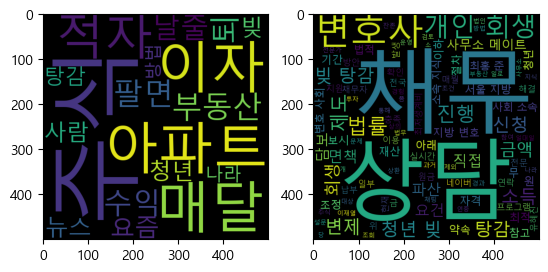

['주식', '아파트', '이자', '매달', '적자', '부동산', '퇴', '팔면', '수익', '날줄', '요즘', '뉴스', '사람', '청년', '빚', '탕감', '나라', '방법']
['네이버', '지식', '상담', '변호사', '이재열', '연중', '무', '실시간', '채팅', '상담', '신청', '자격', '조회', '현재', '나라', '청년', '채무', '문제', '해결', '지원', '프로그램', '청년', '빚', '탕감', '제도', '자격', '채무', '일부', '탕감', '상환', '조건', '조정', '부동산', '투자', '주식', '발생', '채무', '조정', '대상', '개인', '회생', '채무', '조정', '프로그램', '검토', '보시', '지원', '방법', '변호사', '채무', '상담', '전문가', '상의', '신청', '절차', '진행', '상담', '당', '소', '회생', '변호사', '직접', '일대일', '상담', '통해', '최적', '회생', '변호사', '직접', '상담', '실시간', '상담', '변호사', '직접', '확인', '네이버', '폼', '설문', '참여', '서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '최홍', '준', '변호사', '청년', '빚', '탕감', '개인', '회생', '진행', '청년', '빚', '탕감', '상담', '연락', '개인', '회생', '변제', '기간', '소득', '최저생계비', '제외', '금액', '변제', '금', '납부', '잔존', '채무', '면책', '법적', '제도', '청년', '빚', '탕감', '개인', '회생', '신청', '자격', '요건', '아래', '소득', '발생', '재산', '채무', '과거', '개인', '회생', '파산', '면책', '경험', '면책', '일로', '경과', '채무', '금액', '무', '담보', '담보', '이하', '법무'

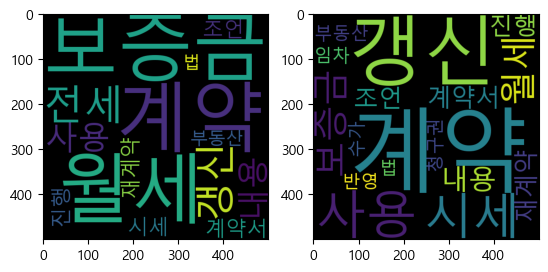

['전세', '보증금', '월세', '보증금', '월세', '계약', '계약', '갱신', '사용', '내용', '계약서', '재계약', '시세', '조언', '진행', '부동산', '법']
['보증금', '월세', '계약', '계약', '갱신', '사용', '내용', '계약서', '재계약', '시세', '조언', '진행', '부동산', '법', '임차', '갱신', '청구권', '사용', '시세', '반영', '계약', '수가']


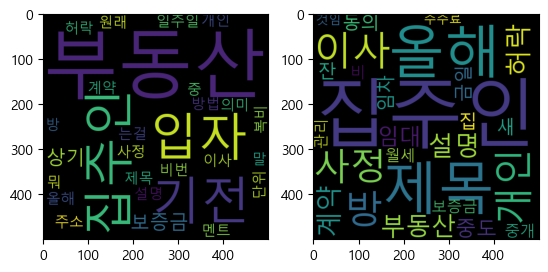

['제목', '올해', '이사', '방', '집주인', '개인', '사정', '설명', '집주인', '허락', '계약', '부동산', '입자', '기전', '보증금', '입자', '기전', '보증금', '방법', '원래', '부동산', '부동산', '는걸', '부동산', '부동산', '주소', '비번', '복비', '중', '부동산', '일주일', '단위', '상기', '상기', '의미', '뭐', '멘트', '말']
['제목', '올해', '이사', '방', '집주인', '개인', '사정', '설명', '집주인', '허락', '계약', '부동산', '임대', '중도', '동의', '집', '새', '임차', '잔', '금일', '보증금', '월세', '관리', '비', '중개', '수수료', '것임']


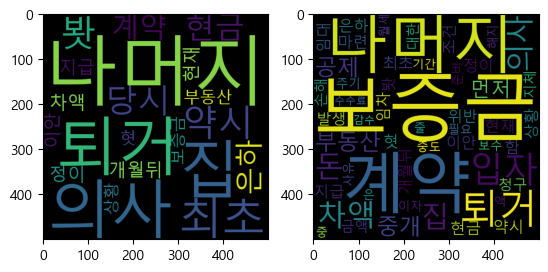

['최초', '약시', '집', '봣', '당시', '현금', '계약', '은하', '개월뒤', '나머지', '차액', '지급', '정이', '나머지', '이안', '퇴거', '의사', '현재', '부동산', '집', '상황', '퇴거', '의사', '혓', '나머지', '보증금']
['차액', '돈', '마련', '최초', '약시', '집', '봣', '현금', '계약', '은하', '개월뒤', '나머지', '차액', '지급', '함', '정이', '나머지', '이안', '퇴거', '의사', '현재', '부동산', '집', '상황', '퇴거', '의사', '혓', '나머지', '보증금', '임대', '임차', '계약', '조건', '위반', '발생', '손해', '청구', '공제', '금액', '대한', '지체', '이자', '중개', '보수', '보증금', '퇴거', '입자', '돈', '주기', '은', '줄', '필요', '먼저', '보증금', '준비', '입자', '계약', '중도', '해지', '사유', '입자', '먼저', '보증금', '중', '기간', '월세', '액', '부동산', '중개', '수수료', '공제', '감수']


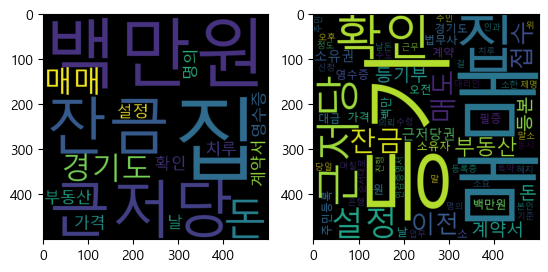

['경기도', '집', '매매', '부동산', '계약서', '집', '가격', '백만원', '근저당', '백만원', '설정', '잔금', '날', '돈', '돈', '근저당', '확인', '영수증', '잔금', '치루', '집', '명의']
['경기도', '집', '매매', '부동산', '계약서', '집', '가격', '백만', '원', '근저당', '백만', '원', '설정', '잔금', '날돈', '돈', '근저당', '확인', '영수증', '걸', '잔금', '집', '제명', '며칠', '부동산', '매매', '계약', '등기부', '등본', '소유자', '매도', '본인', '확인', '매도', '소유자', '확인', '등기', '필증', '주민등록', '등본', '주민', '등록증', '확인', '등기부', '설정', '근저당권', '매매', '대금', '말', '소한', '매매', '계약서', '특약', '등기부', '설정', '근저당권', '매매', '대금', '수인', '매도', '등기', '필증', '매도', '인감증명서', '주민등록', '등본', '수령', '매매', '계약', '소유권', '이전', '등기', '법무사', '대리인', '진행', '근저당권', '말소', '소유권', '이전', '등기', '동시', '등기', '소', '소유권', '이전', '등기', '접수', '접수', '순서대로', '오전', '접수', '당일', '오후', '접수', '날', '오전', '경기도', '집', '매매', '부동산', '계약서', '집', '가격', '백만원', '근저당', '백만원', '설정', '잔금', '날', '돈', '돈', '근저당', '확인', '영수증', '잔금', '치루', '집', '명의', '잔금', '등기', '소', '등기', '이전', '신청', '근무', '기준', '정도', '소요', '근저당', '해지', '위', '법무사', '업무', '의뢰', '매도', '인과', '설정', '은행', '확인', '수도'

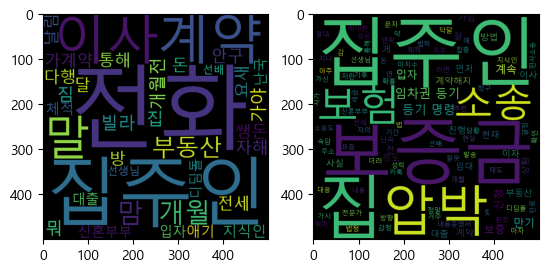

['빌라', '계약', '개월전', '전화', '이사', '말', '집주인', '가야', '짐', '전화', '뭐', '개월', '맘', '집', '가계약', '집주인', '맘', '집주인', '전화', '통해', '자해', '말', '돈', '부동산', '방', '요새', '전세', '안구', '이사', '계약', '다행', '전화', '쌩돈', '날림', '달', '지식인', '개월', '애기', '체적', '난국', '신혼부부', '디딤돌', '대출', '부동산', '입자', '선생님', '선배']
['신혼부부', '디딤돌', '대출', '부동산', '입자', '선생님', '선배', '현재', '집주인', '보증금', '미지수', '상황', '감정', '성적', '법적', '대응', '게', '계약', '기간', '지나', '마자', '임차권', '등기', '명령', '보험', '신청', '걸', '추천', '보증금', '전', '절대', '이사', '가시', '집주인', '보증금', '임차권', '등기', '명령', '정말', '당황', '집주인', '보증금', '입자', '전', '잘못', '저런', '태도', '집', '임대', '최대한', '방향', '게', '보증금', '확률', '사실', '집주인', '먼저', '집주인', '보증금', '만기', '사가', '보증', '보험', '사실', '전문가', '방법', '현재', '자의', '상황', '자주', '현실', '집주인', '계속', '압박', '보증금', '내용', '계약해지', '문자', '카톡', '내용증명서', '발송', '계약해지', '계약', '만료', '세금', '환청', '소송', '진행', '소송', '약', '개월', '정도', '소송도', '집주인', '압박', '방법', '소송', '진행', '집중', '집', '정도', '보증금', '집주인', '압박', '감', '생돈', '집', '대출', '더러', '집주인', '압박', '연락', '기후', '집', '소송', 

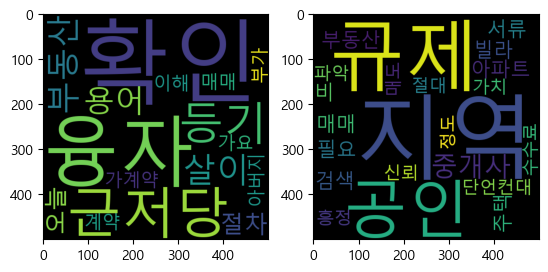

['살이', '부동산', '용어', '절차', '오늘', '가계약', '아버지', '융자', '근저당', '등기', '이해', '매매', '계약', '확인', '융자', '근저당', '등기', '확인', '가요', '부가', '확인']
['지역', '주택', '빌라', '아파트', '비', '규제', '지역', '규제', '지역', '부동산', '매매', '필요', '서류', '검색', '단언컨대', '공인', '중개사', '절대', '신뢰', '수수료', '공인', '중개사', '흥정', '정도', '가치', '파악', '매도']


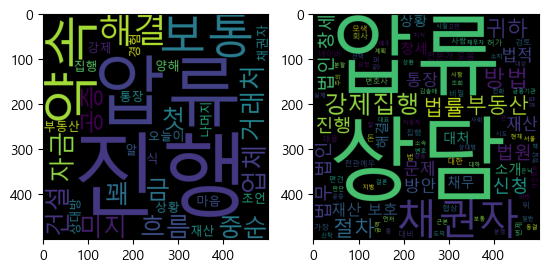

['업체', '건설', '자금', '흐름', '거래처', '미지', '금', '꽤', '중순', '공증', '진행', '첫', '약속', '오늘이', '약속', '나머지', '양해', '채권자', '마음', '강제', '집행', '압류', '진행', '보통', '압류', '식', '진행', '알', '상대방', '재산', '진행', '부동산', '압류', '보통', '통장', '압류', '진행', '해결', '상황', '진행', '경험', '해결', '조언']
['서울', '지방', '변호', '사회', '소속', '지식', '법률', '상담', '진행', '김솔애', '변호사', '상황', '공증', '채권자', '강제집행', '절차', '대응', '방안', '대하', '상대방', '재산', '진행', '부동산', '압류', '정답', '채권자', '귀하', '부동산', '압류', '위', '먼저', '귀하', '부동산', '대한', '정보', '채권자', '법원', '강제집행', '신청', '법원', '채무자', '귀하', '재산', '조회', '압류', '대상', '부동산', '채권자', '귀하', '부동산', '대한', '정보', '알', '부동산', '압류', '진행', '보통', '통장', '압류', '진행', '통장', '압류', '가장', '일반', '강제집행', '방법', '중', '채권자', '법원', '허가', '귀하', '금융기관', '압류', '요청', '귀하', '통장', '금액', '동결', '통장', '압류', '방법', '강제집행', '진행', '부동산', '압류', '자동차', '압류', '채권자', '귀하', '재산', '상황', '방법', '강제집행', '시도', '강제집행', '절차', '대처', '방안', '강제집행', '절차', '채권자', '법원', '강제집행', '신청', '법원', '허가', '집행', '관', '실제', '압류', '집행', '절차', '대처', '방안', '채권자', '협상', '가장', '방법

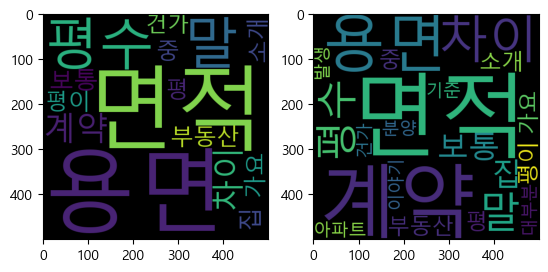

['보통', '집', '평수', '말', '부동산', '평수', '소개', '면적', '용면', '중', '말', '가요', '용면', '평', '계약', '면적', '평이', '차이', '계약', '면적', '용면', '차이', '건가']
['보통', '집', '평수', '말', '부동산', '평수', '소개', '계약', '면적', '용면', '중', '말', '가요', '용면', '평', '계약', '면적', '평이', '차이', '아파트', '대부분', '분양', '면적', '기준', '이야기', '계약', '면적', '용면', '차이', '건가', '차이', '발생']
200
200


In [2]:
base_csv = pd.read_csv('./data/네이버지식인_부동산_2024.10.012024.10.04_20.csv')
okt = Okt()

with open('./data/stopwords.txt', 'r', encoding='utf-8') as f:
    stop_word = [i.strip() for i in list(f)]

res_q = []
res_a = []

for i in range(len(base_csv['답변'])):
    q_nouns = okt.nouns(base_csv.iloc[i,2])
    res_q_nouns = [i for i in q_nouns if i not in stop_word]
    a_nouns = okt.nouns(base_csv.iloc[i,4])
    res_a_nouns = [i for i in a_nouns if i not in stop_word]
    
    wc=WordCloud(font_path="C:/windows/fonts/malgun.ttf",
                background_color='black',
                width=500,
                height=500,
                max_words=100,
                max_font_size=200)
    wc=wc.generate(' '.join(res_q_nouns))
    plt.subplot(1,2,1)
    plt.imshow(wc)

    try:
        wc=wc.generate(' '.join(res_a_nouns))
        plt.subplot(1,2,2)
        plt.imshow(wc)
        plt.show()
    except:
        print(f'{i}번째 답변이 없습니다.')

    print(res_q_nouns)
    print(res_a_nouns)
    res_q.append(res_q_nouns)
    res_a.append(res_a_nouns)

print(len(res_q))
print(len(res_a))

In [3]:
base_csv['질문단어'] = res_q
base_csv['답변단어'] = res_a

In [4]:
base_csv

,Unnamed: 0,질문,상세질문,답변개수,답변,질문단어,답변단어
0,0,부동산 상속 관련 문의드려요,"외할아버지가 돌아가셨는데엄마,삼촌,이모 셋이서 합의를 보고 엄마한테 부동산을 상속하...",3,['안녕하세요. 서울지방변호사회 소속으로 지식iN 법률상담을 진행하고 있는 김솔애 ...,"[외할아버지, 엄마, 삼촌, 이모, 이서, 합의, 보고, 엄마, 부동산, 상속, 나...","[서울, 지방, 변호, 사회, 소속, 지식, 법률, 상담, 진행, 김솔애, 변호사,..."
1,1,제주 부동산 특조법,제주에 땅이 작은 거 (170평)있는데ᆢ안에 미등기 묘지 지목(50평)만 있어서 (...,2,"['안녕하세요. 로시컴-네이버 지식iN 상담변호사 임선준 입니다.', '⚖️철저하고...","[제주, 땅, 평, 등기, 묘지, 지목, 평, 만, 봉분, 해체, 상태, 부동산, ...","[네이버, 지식, 상담, 변호사, 임선준, 법적, 조치, 상세, 상담, 요청, 확인..."
2,2,아파트 가계약하고 집주인이 더높은 가격으로 부동산에...,아파트 가계약하고 집주인이 더높은 가격으로 부동산에 내놓았습니다이 상황만으로 계약을...,5,['1. 그런 경우 계약금의 배액을 배상 받고 해약을 하면 될 일입니다.\n주인이 ...,"[아파트, 가계약, 집주인, 가격, 부동산, 상황, 계약, 파기, 기분]","[계약금, 배액, 배상, 해약, 주인, 먼저, 계약, 파기, 계약금, 포기, 계약,..."
3,3,부동산 가계약금 반환,집을 보고 마음에들어서 가계약금 30만원을 집주인에게 입금했습니다그런데 그날 부동산...,3,['가계약금의 의미는\n상황에 따라 다를 수 있어서\n생각보다 간단한 문제는 아닙니...,"[집, 보고, 마음, 가계약, 금, 집주인, 입금, 그날, 부동산, 문제, 등기부,...","[가계약, 금, 의미, 상황, 생각, 문제, 판례, 아래, 정리, 계약서, 가계약,..."
4,4,전세사기 부동산강제경매,안녕하세요2023년에 전세사기 당한것을 알고임차권 등록 진행해서 허그보증보험을 통해...,2,"['귀하는 별지목록기재 부동산에 대한 주택임차권자인바, 위 부동산에 대하여 채권자로...","[전세, 사기, 알, 임차권, 등록, 진행, 허그, 보증, 보험, 통해, 세금, 며...","[목록, 기재, 부동산, 대한, 주택, 임차권, 위, 부동산, 대하, 채권자, 신청..."
...,...,...,...,...,...,...,...
195,195,집 매매 계약했는데~,경기도에 집을 매매하게 되었습니다부동산에서 계약서를 쓰면서 집 가격이1억8천5백만원...,2,['경기도에 집을 매매하게 되었습니다\n부동산에서 계약서를 쓰면서 집 가격이\n1억...,"[경기도, 집, 매매, 부동산, 계약서, 집, 가격, 백만원, 근저당, 백만원, 설...","[경기도, 집, 매매, 부동산, 계약서, 집, 가격, 백만, 원, 근저당, 백만, ..."
196,196,전세 보증금 받는 법,"빌라 만기계약 6개월전 전화로 이사하겠다 말하고집주인은 안가면안되냐, 꼭 가야하냐 ...",4,['제가 부린이라 잘 몰라요..\n지금 신혼부부디딤돌전세대출인데 2년연장해서 4년째...,"[빌라, 계약, 개월전, 전화, 이사, 말, 집주인, 가야, 짐, 전화, 뭐, 개월...","[신혼부부, 디딤돌, 대출, 부동산, 입자, 선생님, 선배, 현재, 집주인, 보증금..."
197,197,집 매매 하려고 하는데 중요한게 있을까요?,24살이구 부동산용어도 모르고 절차도 모릅니다.오늘 가계약 걸러 가는데 아버지는 융...,1,"[""어떤 지역이고, 주택 빌라 아파트인지, 비규제 지역인지 규제지역인지,\n다 따져...","[살이, 부동산, 용어, 절차, 오늘, 가계약, 아버지, 융자, 근저당, 등기, 이...","[지역, 주택, 빌라, 아파트, 비, 규제, 지역, 규제, 지역, 부동산, 매매, ..."
198,198,"공증 어길 시, 질문드립니다.","안녕하세요,저희 업체가 건설사를 일을 하다보니 자금 흐름이 원활하지 않습니다.그러다...",1,['안녕하세요. 서울지방변호사회 소속으로 지식iN 법률상담을 진행하고 있는 김솔애 ...,"[업체, 건설, 자금, 흐름, 거래처, 미지, 금, 꽤, 중순, 공증, 진행, 첫,...","[서울, 지방, 변호, 사회, 소속, 지식, 법률, 상담, 진행, 김솔애, 변호사,..."


In [5]:
df_list = []
tmp_nouns = []
tmp_nouns_unique = []
for i in base_csv['질문단어']:
    dtm=[]
    tmp_nouns = sorted(list(set(i)))
    tmp_nouns_unique.extend(tmp_nouns)
    dtm.append([])
    for j in tmp_nouns:
        dtm[-1].append(i.count(j))
    # print(tmp_nouns)
    # print(dtm)
    tmp = pd.DataFrame(dtm, columns=tmp_nouns)
    # display(tmp_tf_)
    df_list.append(tmp)


In [6]:
len(sorted(list(set(tmp_nouns_unique))))

1657

In [7]:
tf_ = pd.concat(df_list, ignore_index=True).fillna(0)

In [8]:
D=len(tf_) #총문서수
df=tf_.astype(bool).sum()
idf=D/df

In [9]:
tfidf = tf_*idf

In [10]:
tfidf

,나머지,보고,부동산,삼촌,상속,서류,엄마,외할아버지,이모,이서,...,거래처,건설,꽤,미지,상대방,업체,오늘이,용면,평수,평이
0,25.0,15.384615,1.265823,200.0,40.0,20.0,100.0,200.0,200.0,200.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000000,2.531646,0.0,40.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.000000,1.265823,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,25.0,15.384615,2.531646,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.000000,3.797468,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.0,0.000000,1.265823,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
196,0.0,0.000000,2.531646,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
197,0.0,0.000000,1.265823,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
198,25.0,0.000000,1.265823,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,200.0,200.0,200.0,200.0,200.0,200.0,200.0,0.0,0.0,0.0


In [11]:
from sklearn.metrics.pairwise import cosine_similarity
cos_sim = cosine_similarity(tfidf, tfidf)
result_df = pd.DataFrame(data=cos_sim, index=tfidf.index, columns=tfidf.index)
result_df

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,1.000000,0.002261,0.000032,0.004715,0.000333,0.009788,0.000005,0.000029,0.000261,0.000007,...,0.000010,0.000009,0.002193,0.000040,0.007890,0.000008,0.000012,0.004380,0.003910,0.000005
1,0.002261,1.000000,0.000017,0.001743,0.001201,0.016123,0.001109,0.000015,0.000056,0.000292,...,0.017201,0.000005,0.000024,0.000826,0.000069,0.000324,0.001907,0.006576,0.019160,0.002554
2,0.000032,0.000017,1.000000,0.051544,0.000073,0.000028,0.000017,0.001220,0.001702,0.004876,...,0.002610,0.000739,0.001881,0.002836,0.001705,0.011331,0.008965,0.010580,0.001358,0.000193
3,0.004715,0.001743,0.051544,1.000000,0.000424,0.000238,0.000009,0.000707,0.013330,0.006893,...,0.002037,0.000018,0.009021,0.004341,0.010056,0.008338,0.011656,0.014383,0.030354,0.002034
4,0.000333,0.001201,0.000073,0.000424,1.000000,0.005539,0.010837,0.000067,0.006849,0.000016,...,0.005025,0.000021,0.035841,0.000239,0.000016,0.000018,0.001034,0.001228,0.022534,0.000212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.000008,0.000324,0.011331,0.008338,0.000018,0.000007,0.000004,0.000698,0.000756,0.001213,...,0.000010,0.000008,0.000663,0.000037,0.000426,1.000000,0.000798,0.031337,0.000005,0.000150
196,0.000012,0.001907,0.008965,0.011656,0.001034,0.000010,0.004062,0.000405,0.001140,0.000009,...,0.001330,0.000012,0.001935,0.005172,0.000160,0.000798,1.000000,0.002001,0.000008,0.000462
197,0.004380,0.006576,0.010580,0.014383,0.001228,0.004549,0.000006,0.009833,0.000291,0.000009,...,0.000814,0.000012,0.000668,0.000098,0.000054,0.031337,0.002001,1.000000,0.000008,0.000335
198,0.003910,0.019160,0.001358,0.030354,0.022534,0.000745,0.000003,0.000020,0.001422,0.004068,...,0.007068,0.000006,0.020840,0.000027,0.005644,0.000005,0.000008,0.000008,1.000000,0.006352


In [12]:
result_df[12].sort_values(ascending=False)

12     1.000000
109    0.379665
84     0.120651
43     0.063071
103    0.045667
         ...   
104    0.000000
105    0.000000
106    0.000000
108    0.000000
100    0.000000
Name: 12, Length: 200, dtype: float64

In [16]:
print(base_csv.set_index('상세질문').iloc[12])
print(base_csv.set_index('답변').iloc[12])
print('---------------------------------------------------------------')
print(base_csv.set_index('상세질문').iloc[109])
print(base_csv.set_index('답변').iloc[109])
print('---------------------------------------------------------------')
print(base_csv.set_index('상세질문').iloc[84])
print(base_csv.set_index('답변').iloc[84])
print('---------------------------------------------------------------')

Unnamed: 0                                                   12
질문                                 가등기 되어 있는 부동산에 가등기 또 할수 있나요?
답변개수                                                          1
답변            ['세계사이버대학 부동산금융자산학과장 강병기입니다.\n가능할 것으로 보입니다.\n가...
질문단어                            [담보, 가등기, 부동산, 사람, 이름, 매매, 가등기]
답변단어          [세계, 사이버, 대학, 부동산, 금융, 자산, 학과, 강병기, 가등기, 본등기, ...
Name: 담보에 의한 가등기가 되어 있는 부동산에다른 사람 이름으로 매매에 의한 가등기를 또 할 수 있나요?, dtype: object
Unnamed: 0                                                   12
질문                                 가등기 되어 있는 부동산에 가등기 또 할수 있나요?
상세질문          담보에 의한 가등기가 되어 있는 부동산에다른 사람 이름으로 매매에 의한 가등기를 또...
답변개수                                                          1
질문단어                            [담보, 가등기, 부동산, 사람, 이름, 매매, 가등기]
답변단어          [세계, 사이버, 대학, 부동산, 금융, 자산, 학과, 강병기, 가등기, 본등기, ...
Name: ['세계사이버대학 부동산금융자산학과장 강병기입니다.\n가능할 것으로 보입니다.\n가등기는 본등기가 아니라 향후 어떤 등기를 할 것을 예약하는 등기에 불과하며,\n가등기가 있는 부동산에 또 다른 가등기를 하는 것을 금지하는 법령상의 규정이 없으므로,\n질문의 경우 특별